In [1]:

%reload_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt

from qick import *
from qick.helpers import gauss
from tqdm import tqdm_notebook as tqdm

import time
import os
import sys
sys.path.append('/home/xilinx/jupyter_notebooks/')
sys.path.append('C:\\_Lib\\python\\rfsoc\\rfsoc_multimode\\example_expts')
import scipy as sp
import json
from scipy.fft import fft, fftfreq

from slab.instruments import *
from slab.experiment import Experiment
from slab.datamanagement import SlabFile
from slab import get_next_filename, AttrDict
from slab import Experiment, dsfit, AttrDict

# Figure params
plt.rcParams['figure.figsize'] = [10,6]
plt.rcParams.update({'font.size': 14})

Warning serial library import failed.
Could not load InstrumentManagerWindow
Could not import QickInstrument, try install qick package
Could not load AD5780 dac 
Could not load labbrick
Could not load Autonics TM4 Driver


In [2]:
from slab.dsfit import *
import os
from scipy.interpolate import griddata
from numpy import mgrid, array, zeros,abs,pi,cos,transpose, linspace
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from tempfile import TemporaryFile
font = {'family' : 'DejaVu Sans',
        'weight' : 'normal',
        'size'   : 15}
import json
from h5py import File
from datetime import datetime
import time
from slab.datamanagement import SlabFile
import matplotlib.pyplot as plt
import numpy as np
import os
import json
from slab.dsfit import *
from scipy.optimize import curve_fit
# import experiments.fitting as fitter
from matplotlib.colors import Normalize

## Import modules from parent and multimode expts

In [3]:
import json
import os

# Get the current working directory
path = os.getcwd()
print("Current Path:", path)

# Isolate the parent directory
parent_path = os.path.dirname(path)
print("Parent Path:", parent_path)

# Add the parent path to the sys.path
sys.path.append(parent_path)

Current Path: c:\_Lib\python\multimode_expts\analysis_notebooks
Parent Path: c:\_Lib\python\multimode_expts


In [4]:
import sys

# Path to add
expts_path = 'C:\\_Lib\\python\\multimode_expts'

# Add the path to the system path at the highest priority
if expts_path not in sys.path:
    sys.path.insert(0, expts_path)
    print('Path added at highest priority')

# Verify the path is added
print(sys.path)


Path added at highest priority
['C:\\_Lib\\python\\multimode_expts', 'c:\\_Lib\\python\\multimode_expts\\analysis_notebooks', 'C:\\_Lib\\python', 'C:\\_Lib\\python\\slab', 'C:\\_Lib\\python\\qick\\qick_lib', 'C:\\_Lib\\python\\rfsoc\\rfsoc_multimode\\example_expts', 'c:\\_Lib\\python\\multimode_expts\\analysis_notebooks', 'c:\\Users\\26049\\.conda\\envs\\slab\\python38.zip', 'c:\\Users\\26049\\.conda\\envs\\slab\\DLLs', 'c:\\Users\\26049\\.conda\\envs\\slab\\lib', 'c:\\Users\\26049\\.conda\\envs\\slab', '', 'C:\\Users\\26049\\AppData\\Roaming\\Python\\Python38\\site-packages', 'c:\\Users\\26049\\.conda\\envs\\slab\\lib\\site-packages', 'c:\\Users\\26049\\.conda\\envs\\slab\\lib\\site-packages\\easy_lmfit-1.0-py3.8.egg', 'c:\\Users\\26049\\.conda\\envs\\slab\\lib\\site-packages\\attrdict-2.0.1-py3.8.egg', 'c:\\Users\\26049\\.conda\\envs\\slab\\lib\\site-packages\\win32', 'c:\\Users\\26049\\.conda\\envs\\slab\\lib\\site-packages\\win32\\lib', 'c:\\Users\\26049\\.conda\\envs\\slab\\lib\\s

In [5]:
from multimode_expts.fit_display import *

importing from path  C:\_Lib\python\multimode_expts\experiments\clifford_averager_program.py
imported experiments.clifford_averager_program
importing from path  C:\_Lib\python\multimode_expts\experiments\fitting.py
imported experiments.fitting
importing from path  C:\_Lib\python\multimode_expts\experiments\qram_protocol_timestepped.py
imported experiments.qram_protocol_timestepped
importing from path  C:\_Lib\python\multimode_expts\experiments\qubit_cavity
imported experiments.qubit_cavity.amplitude_rabi_f0g1
imported experiments.qubit_cavity.displacement_enhanced_sideband
imported experiments.qubit_cavity.displace_amplitude_calibration
imported experiments.qubit_cavity.displace_pulse_probe
imported experiments.qubit_cavity.ecd
imported experiments.qubit_cavity.ecd_backup
imported experiments.qubit_cavity.ecd_read_spec
imported experiments.qubit_cavity.non_demolution_readout
imported experiments.qubit_cavity.out_and_back
imported experiments.qubit_cavity.photo_resolved_pulse_probe
impo

In [6]:
import experiments.fitting as fitter
from numpy.linalg import inv

# Exp path

In [7]:

# print("path: ", path)

"""Reopen saved data"""
def prev_data(expt_path, filename):
    temp_data_file = expt_path+'\\'+filename
    with SlabFile(temp_data_file) as a:
        attrs = dict()
        for key in list(a.attrs):
            attrs.update({key:json.loads(a.attrs[key])})
        keys = list(a)
        temp_data = dict()
        for key in keys:
            temp_data.update({key:np.array(a[key])})
        # print(f'Extracted data and attrs {list(a.attrs)}')
    return temp_data, attrs

data_parent =  r'H:\Shared drives\SLab\Multimode\experiment\240911'
expt_path=data_parent+'\\data1'
print('Data are extracted from', expt_path)

Data are extracted from H:\Shared drives\SLab\Multimode\experiment\240911\data1


In [8]:
from dataset import *
from dataset import storage_man_swap_dataset
import os 

file_name = '\\man1_storage_swap_dataset.csv'
file_path = parent_path + file_name

ds_stor_man_swap = storage_man_swap_dataset(file_path)

In [9]:
ds_stor_man_swap.df

,stor_name,freq (MHz),precision (MHz),pi (mus),h_pi (mus),gain (DAC units),last_update
0,M1-S1,349.415,0.010,0.977143,0.488571,3000,2024-10-26 17:42:46.915401
1,M1-S2,520.925,0.010,1.130904,0.565452,5000,2024-10-26 17:43:09.376354
2,M1-S3,696.665,0.010,1.333910,0.666955,9000,2024-10-26 17:43:34.019332
3,M1-S4,875.845,0.010,1.254287,0.627144,9000,2024-10-26 17:43:51.867832
4,M1-S5,1053.395,0.010,1.973198,0.986599,7500,2024-10-26 17:44:14.975970
5,M1-S6,1245.160,0.010,1.595310,0.797655,13500,2024-10-26 17:44:34.143253
6,M1-S7,1423.040,0.010,1.685008,0.842504,13500,2024-10-26 17:44:51.587301
7,M1-S8,-1.000,-1.000,-1.000000,-1.000000,-1,51:31.3
8,M1-S9,-1.000,-1.000,-1.000000,-1.000000,-1,51:31.3
9,M1-S10,-1.000,-1.000,-1.000000,-1.000000,-1,51:31.3


In [10]:
# load BS data frame (without spectators)
folder = os.path.join(data_parent, 'RAM_paper_results', 'datasets')
file_name = 'DualRail_BeamSplitters.csv'
file_path = os.path.join(folder, file_name)

# Ensure the directory exists
os.makedirs(folder, exist_ok=True)

# Load the data
df_bs = pd.read_csv(file_path)
df_bs

,Mode,file_list,name,fids_list,fids_post_list,fid,fid_err,fid_post,fid_post_err,Depth fit up to,...,ge_list,eg_list,ee_list,gg_list_err,ge_list_err,eg_list_err,ee_list_err,ebars_list,ebars_post_list,depth_fit_up_to
0,1,"[548, 549, 550, 551, 552, 553, 554, 555, 556, ...",_SingleBeamSplitterRBPostSelection_sweep_depth...,"[0.933563187108675, 0.92539176866761, 0.908718...","[0.994865836316126, 0.993013098261554, 0.99046...",0.996652,0.000072,0.998779,0.000169,2000,...,"[0.9085502306183065, 0.9057903676411931, 0.887...","[0.004686333863849433, 0.00637849709117257, 0....","[0.06175047902747567, 0.06822973424121748, 0.0...","[0.0018465746795619019, 0.0015659177897998028,...","[0.0018465746795619019, 0.0015659177897998028,...","[0.0004359989629942819, 0.0006174559521902646,...","[0.0015981747296314585, 0.0018304495944191988,...","[0.0016098005294681022, 0.0018226997647139613,...","[0.0004799021448033312, 0.0006728531999346926,...",2000
1,2,"[569, 570, 571, 572, 573, 574, 575, 576, 577, ...",_SingleBeamSplitterRBPostSelection_sweep_depth...,"[0.9356514245251336, 0.9242189803653471, 0.914...","[0.9950886744818882, 0.9935122956231536, 0.991...",0.997613,0.000013,0.999754,0.000101,2000,...,"[0.8957272139719534, 0.8840266115577843, 0.873...","[0.0044322282288122945, 0.005776719908511158, ...","[0.05991634724605409, 0.07000429972614167, 0.0...","[0.0022832745775030047, 0.0018772482133232158,...","[0.0022832745775030047, 0.0018772482133232158,...","[0.00043983346018930907, 0.0004906753514151476...","[0.0018721113801848717, 0.001540946897328571, ...","[0.0016098005294681022, 0.0018226997647139613,...","[0.00048243060740322136, 0.0005523446792671511...",2000
2,3,"[590, 591, 592, 593, 594, 595, 596, 597, 598, ...",_SingleBeamSplitterRBPostSelection_sweep_depth...,"[0.932848556683558, 0.9184909395360339, 0.9043...","[0.9953260202637892, 0.9926657260845021, 0.991...",0.997000,0.000019,0.999229,0.000145,2000,...,"[0.8890630812784109, 0.8752246533122903, 0.861...","[0.0041724998020788145, 0.006467488235228106, ...","[0.06297894351436314, 0.07504157222873784, 0.0...","[0.0019511508849668908, 0.002034707201115821, ...","[0.0019511508849668908, 0.002034707201115821, ...","[0.0003559383392788671, 0.0005238370770952343,...","[0.001176226769595588, 0.001570598764562083, 0...","[0.0018364832264220945, 0.0014975954861458222,...","[0.00039949444035114164, 0.0005909073629860316...",2000
3,4,"[611, 612, 613, 614, 615, 616, 617, 618, 619, ...",_SingleBeamSplitterRBPostSelection_sweep_depth...,"[0.9224996506107835, 0.8977564150549788, 0.877...","[0.9924848735561859, 0.9889322008290996, 0.985...",0.993877,0.000050,0.996009,0.000355,2000,...,"[0.8953524548427165, 0.8707604852155324, 0.853...","[0.006783837945321119, 0.00973645686574578, 0....","[0.07071651144389529, 0.0925071280792755, 0.10...","[0.0021139916294548116, 0.0021486621308964065,...","[0.0021139916294548116, 0.0021486621308964065,...","[0.0005176444615874594, 0.0006221573958370889,...","[0.0016800866418539158, 0.0019553545429684908,...","[0.0018364832264220945, 0.0014975954861458222,...","[0.0005700234403086111, 0.0007143665655444077,...",2000
4,5,"[632, 633, 634, 635, 636, 637, 638, 639, 640, ...",_SingleBeamSplitterRBPostSelection_sweep_depth...,"[0.924224701154291, 0.8972516351072528, 0.8680...","[0.994061657262647, 0.9914303178857917, 0.9861...",0.993209,0.000068,0.997944,0.000094,2000,...,"[0.9077750642910327, 0.8827509904350767, 0.851...","[0.0054231752960300465, 0.007617899645197445, ...","[0.07035212354967885, 0.0951304652475498, 0.11...","[0.001587489521038847, 0.0023662620250462256, ...","[0.001587489521038847, 0.0023662620250462256, ...","[0.00041051773797976297, 0.0006694071490576667...","[0.0012095062061867597, 0.0021735478521388344,...","[0.0012115656976351553, 0.001564185678578712, ...","[0.00045023043163391213, 0.0007583637132156032...",2000
5,6,"[653, 654, 655, 656, 657, 658, 659, 660, 661, ...",_SingleBeamSplitterRBPostSelection_sweep_depth...,"[0.890094859149635, 0.8900864880228737

In [453]:
T1s

array([ 358.3, 1254.8,  799. ,  597.4,  355.7,  589.5,  371.2])

# Cross Kerrs

In [240]:
cross_kerrs = [[ 0.00000000e+00, 2.69516637e-04, 1.26486438e-04, 8.86845176e-05, 4.26936404e-05, 1.94041328e-05, -1.95956248e-05], [-1.77543592e-04, 0.00000000e+00, -6.92266452e-05, -7.10978126e-05, 1.37913777e-05, -2.56223707e-05, 9.10903529e-07], [-7.56355942e-05, -4.42189013e-05, 0.00000000e+00, -2.45449305e-05, -4.28864355e-06, 2.24512793e-06, -3.33552244e-06], [ 6.10648017e-05, 4.56428583e-05, 1.96973208e-05, 0.00000000e+00, 2.41548015e-06, -1.08904643e-05, -6.20592017e-06], [-3.72488668e-05, -4.62192947e-05, -3.77809419e-05, -1.58034621e-05, 0.00000000e+00, -2.52649638e-05, -2.20498490e-06], [-4.31597553e-05, -1.65832342e-05, -4.06943788e-05, 1.21448311e-05, -1.92766876e-05, 0.00000000e+00, 1.27297852e-05], [-5.42085347e-06, -3.00407857e-05, -7.10933782e-06, -2.45232181e-05, 8.53857371e-06, -1.07023464e-05, 0.00000000e+00]]
cross_kerrs = np.array(cross_kerrs)
print(cross_kerrs)

[[ 0.00000000e+00  2.69516637e-04  1.26486438e-04  8.86845176e-05
   4.26936404e-05  1.94041328e-05 -1.95956248e-05]
 [-1.77543592e-04  0.00000000e+00 -6.92266452e-05 -7.10978126e-05
   1.37913777e-05 -2.56223707e-05  9.10903529e-07]
 [-7.56355942e-05 -4.42189013e-05  0.00000000e+00 -2.45449305e-05
  -4.28864355e-06  2.24512793e-06 -3.33552244e-06]
 [ 6.10648017e-05  4.56428583e-05  1.96973208e-05  0.00000000e+00
   2.41548015e-06 -1.08904643e-05 -6.20592017e-06]
 [-3.72488668e-05 -4.62192947e-05 -3.77809419e-05 -1.58034621e-05
   0.00000000e+00 -2.52649638e-05 -2.20498490e-06]
 [-4.31597553e-05 -1.65832342e-05 -4.06943788e-05  1.21448311e-05
  -1.92766876e-05  0.00000000e+00  1.27297852e-05]
 [-5.42085347e-06 -3.00407857e-05 -7.10933782e-06 -2.45232181e-05
   8.53857371e-06 -1.07023464e-05  0.00000000e+00]]


# Mode Bare Ramsey Dataset

In [13]:
folder = os.path.join(data_parent, 'RAM_paper_results', 'datasets')
file_name = 'ModeT2s_and_echoes.csv'
file_path = os.path.join(folder, file_name)

# Ensure the directory exists
os.makedirs(folder, exist_ok=True)

# Save the DataFrame to a CSV file
df_t2_and_echo = pd.read_csv(file_path)

print(f"DataFrame read from to {file_path}")

DataFrame read from to H:\Shared drives\SLab\Multimode\experiment\240911\RAM_paper_results\datasets\ModeT2s_and_echoes.csv


In [14]:
df_t2_and_echo

,target,type,file_no,name,t2,t2_err,return_args
0,1,T2,90,_stor_cavity_ramsey_sweep.h5,235.687931,7.102034,"[[1.8099999999999998, 3.6099999999999994, 5.40..."
1,1,T2_echo,91,_stor_cavity_ramsey_sweep.h5,551.567706,16.846464,"[[3.02, 6.02, 9.02, 12.02, 15.02, 18.02, 21.02..."
2,2,T2,92,_stor_cavity_ramsey_sweep.h5,378.310633,15.076063,"[[6.01, 12.01, 18.01, 24.01, 30.01, 36.01, 42...."
3,2,T2_echo,93,_stor_cavity_ramsey_sweep.h5,1493.194215,53.469139,NaN
4,3,T2,94,_stor_cavity_ramsey_sweep.h5,677.194120,16.847612,"[[4.81, 9.61, 14.409999999999998, 19.21, 24.01..."
5,3,T2_echo,95,_stor_cavity_ramsey_sweep.h5,1309.914525,41.804243,"[[8.02, 16.02, 24.02, 32.02, 40.02, 48.02, 56...."
6,4,T2,96,_stor_cavity_ramsey_sweep.h5,806.227803,23.684860,"[[4.21, 8.41, 12.610000000000001, 16.810000000..."
7,4,T2_echo,97,_stor_cavity_ramsey_sweep.h5,972.376941,29.846202,"[[7.02, 14.02, 21.02, 28.02, 35.02, 42.02, 49...."
8,5,T2,98,_stor_cavity_ramsey_sweep.h5,591.843259,15.246132,"[[3.6099999999999994, 7.209999999999999, 10.80..."
9,5,T2_echo,99,_stor_cavity_ramsey_sweep.h5,663.338928,22.742345,"[[6.02, 12.02, 18.02, 24.02, 30.02, 36.02, 42...."


# Analyze Many body dephasing data

## Calculate Ramseys

In [15]:
#collecting all the file nos
depth_list = np.arange(1, 210, 7)

mode_list = [1, 2,3,4,5,6,7]
state_idxs = [0,1,2,3,4,5]


file_list_start_no = 19
curr_file_no = file_list_start_no
name = '_stor_cavity_ramsey_sweep.h5'

# Initialize an empty list to store the data
data_MBD = [] # many body dephasing

for idx, stor_no in enumerate(mode_list):
    
        file_list_t2_and_echo = np.arange(curr_file_no, curr_file_no + 2)
        curr_file_no = curr_file_no + 2 
        file_list_MBD = np.arange(curr_file_no, curr_file_no + 6)
        curr_file_no = curr_file_no +6



        for state_idx in state_idxs:
            if state_idx == 0 : # i made an error here, prep_random_storage_state() has no idx = 0; so will ignore this file 
                file_no =  file_list_t2_and_echo.tolist()[0] # (the t2 file)
            else:
                file_no =  file_list_MBD.tolist()[state_idx]

            data_MBD.append({
                'target': stor_no,
                'state_idx': state_idx,
                'file_no': file_no,  # Convert numpy array to list
                'name': name
            })


# Create a DataFrame from the data
df_MBD = pd.DataFrame(data_MBD)

# Display the DataFrame
print(df_MBD)

    target  state_idx  file_no                          name
0        1          0       19  _stor_cavity_ramsey_sweep.h5
1        1          1       22  _stor_cavity_ramsey_sweep.h5
2        1          2       23  _stor_cavity_ramsey_sweep.h5
3        1          3       24  _stor_cavity_ramsey_sweep.h5
4        1          4       25  _stor_cavity_ramsey_sweep.h5
5        1          5       26  _stor_cavity_ramsey_sweep.h5
6        2          0       27  _stor_cavity_ramsey_sweep.h5
7        2          1       30  _stor_cavity_ramsey_sweep.h5
8        2          2       31  _stor_cavity_ramsey_sweep.h5
9        2          3       32  _stor_cavity_ramsey_sweep.h5
10       2          4       33  _stor_cavity_ramsey_sweep.h5
11       2          5       34  _stor_cavity_ramsey_sweep.h5
12       3          0       35  _stor_cavity_ramsey_sweep.h5
13       3          1       38  _stor_cavity_ramsey_sweep.h5
14       3          2       39  _stor_cavity_ramsey_sweep.h5
15       3          3   

In [16]:
# some file_no change
mode_list = [1, 2,3,4,5,6,7]
state_idxs = [0,1,2,3,4,5]


file_list_start_no = 90
curr_file_no = file_list_start_no
name = '_stor_cavity_ramsey_sweep.h5'

# Initialize an empty list to store the data
# data_t2_and_echo = [] # t2 and echo data

for idx, stor_no in enumerate(mode_list):
    
    file_list_t2_and_echo = np.arange(curr_file_no, curr_file_no + 2)
    curr_file_no = curr_file_no + 2 

    # change the file no for the MBD data
    
    ## find the row in df_MBD with the same target and state_idx =0 and change the file_no
    idx = df_MBD[(df_MBD['target'] == stor_no) & (df_MBD['state_idx'] == 0)].index[0]
    df_MBD.at[idx, 'file_no'] = file_list_t2_and_echo.tolist()[0]



# Create a DataFrame from the data
# df_t2_and_echo = pd.DataFrame(data_t2_and_echo)
# Display the DataFrame
# print(df_t2_and_echo)
print(df_MBD)

    target  state_idx  file_no                          name
0        1          0       90  _stor_cavity_ramsey_sweep.h5
1        1          1       22  _stor_cavity_ramsey_sweep.h5
2        1          2       23  _stor_cavity_ramsey_sweep.h5
3        1          3       24  _stor_cavity_ramsey_sweep.h5
4        1          4       25  _stor_cavity_ramsey_sweep.h5
5        1          5       26  _stor_cavity_ramsey_sweep.h5
6        2          0       92  _stor_cavity_ramsey_sweep.h5
7        2          1       30  _stor_cavity_ramsey_sweep.h5
8        2          2       31  _stor_cavity_ramsey_sweep.h5
9        2          3       32  _stor_cavity_ramsey_sweep.h5
10       2          4       33  _stor_cavity_ramsey_sweep.h5
11       2          5       34  _stor_cavity_ramsey_sweep.h5
12       3          0       94  _stor_cavity_ramsey_sweep.h5
13       3          1       38  _stor_cavity_ramsey_sweep.h5
14       3          2       39  _stor_cavity_ramsey_sweep.h5
15       3          3   

00090_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.028097209173008147 +/- 2.1708344143963394e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.028097209173
 	1974.971902790827
T2 Ramsey from fit I [us]: 278.04222952977193
Fit frequency from Q [MHz]: 0.028164290172487373 +/- 7.016056071074718e-05
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.0281642901725
 	1974.9718357098275
T2 Ramsey from fit Q [us]: 309.0651645887048


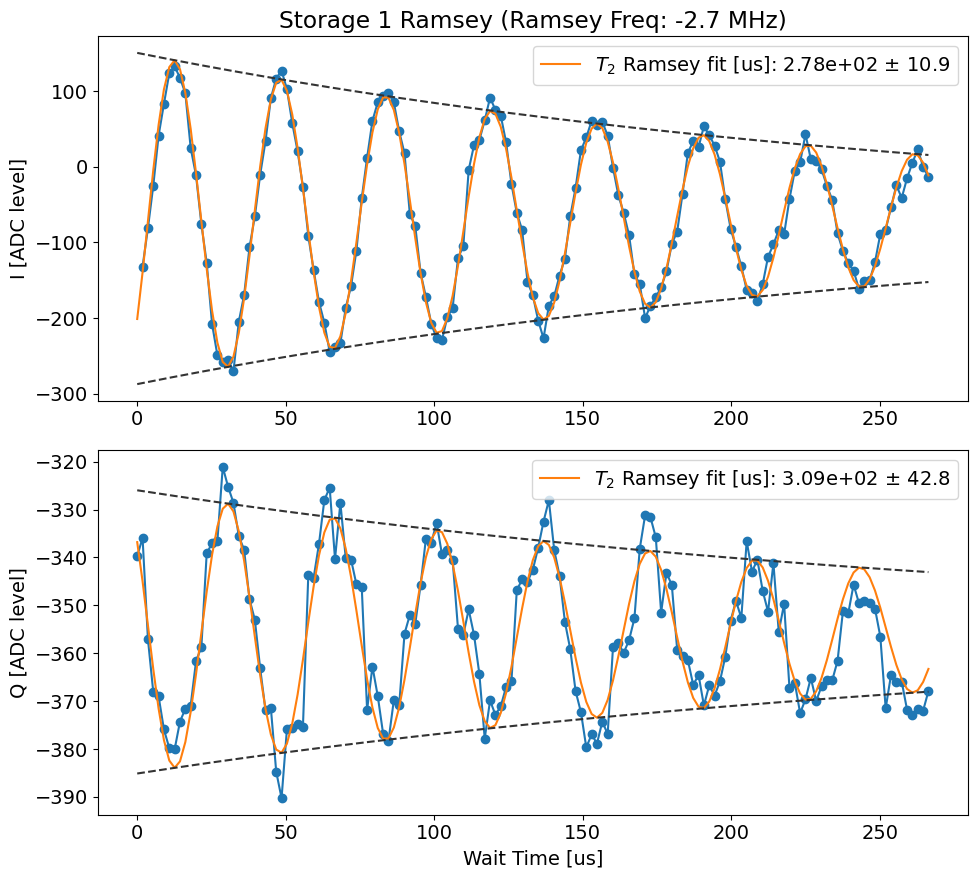

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00022_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.09909909909909911, which is out of bounds 0.00045351473922902497 to 0.06802721088435375. Instead init to 0.03424036281179139
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.02817283907630359 +/- 2.211331508420263e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.0281728390764
 	1974.9718271609238
T2 Ramsey from fit I [us]: 290.8663411481148
Fit frequency from Q [MHz]: 0.04033273248272707 +/- 0.0014375745759440642
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.0403327324827
 	1974.9596672675173
T2 Ramsey from fit Q [us]: 66.15


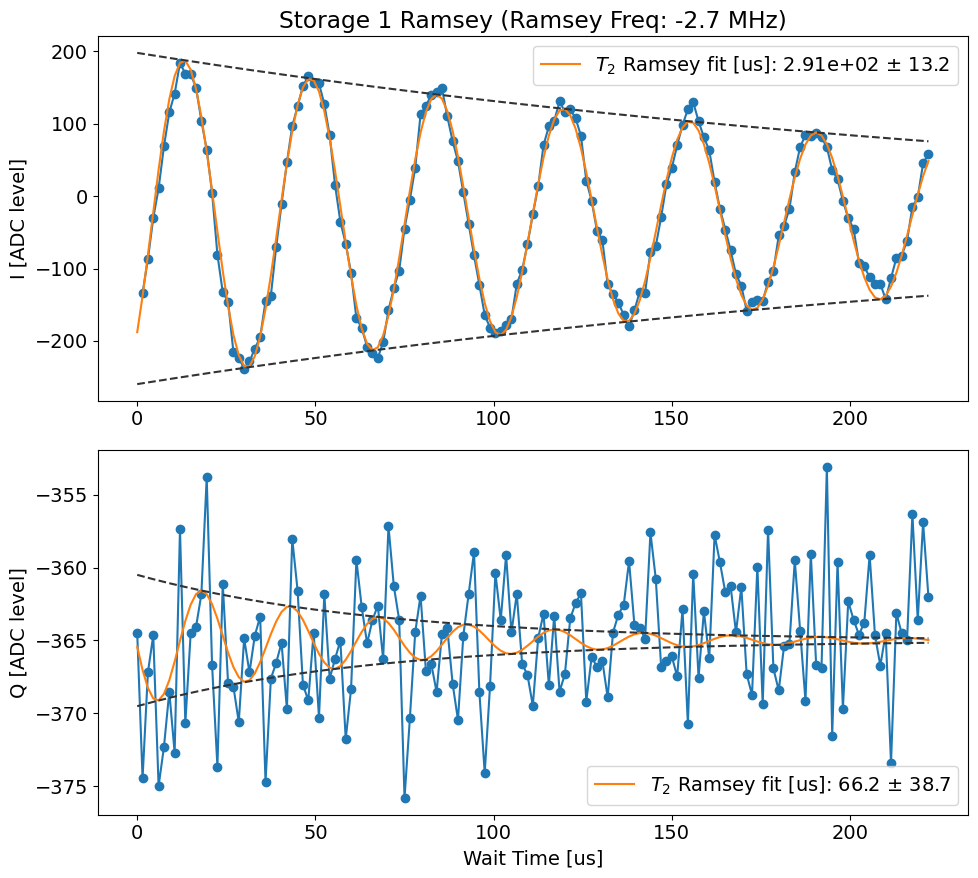

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00023_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.02252252252252253 +/- inf
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.0225225225226
 	1974.9774774774776
T2 Ramsey from fit I [us]: 220.5
Fit frequency from Q [MHz]: 0.026053208051055016 +/- 0.0009355006699120433
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.026053208051
 	1974.973946791949
T2 Ramsey from fit Q [us]: 159.29516273849214


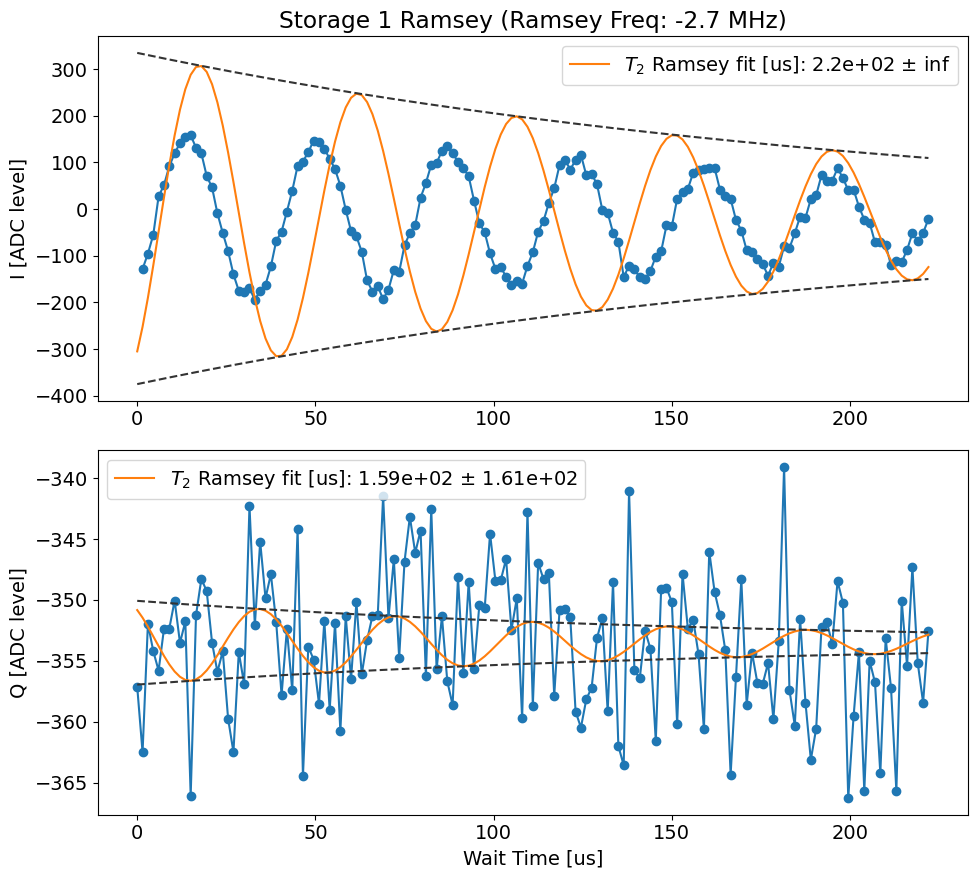

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00024_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.20270270270270274, which is out of bounds 0.00045351473922902497 to 0.06802721088435375. Instead init to 0.03424036281179139
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.027798812484074183 +/- 2.2488171896761354e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.0277988124842
 	1974.972201187516
T2 Ramsey from fit I [us]: 285.8600331091299
Fit frequency from Q [MHz]: 0.03477370068633912 +/- 0.002788646473558143
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.0347737006864
 	1974.9652262993136
T2 Ramsey from fit Q [us]: 66.15


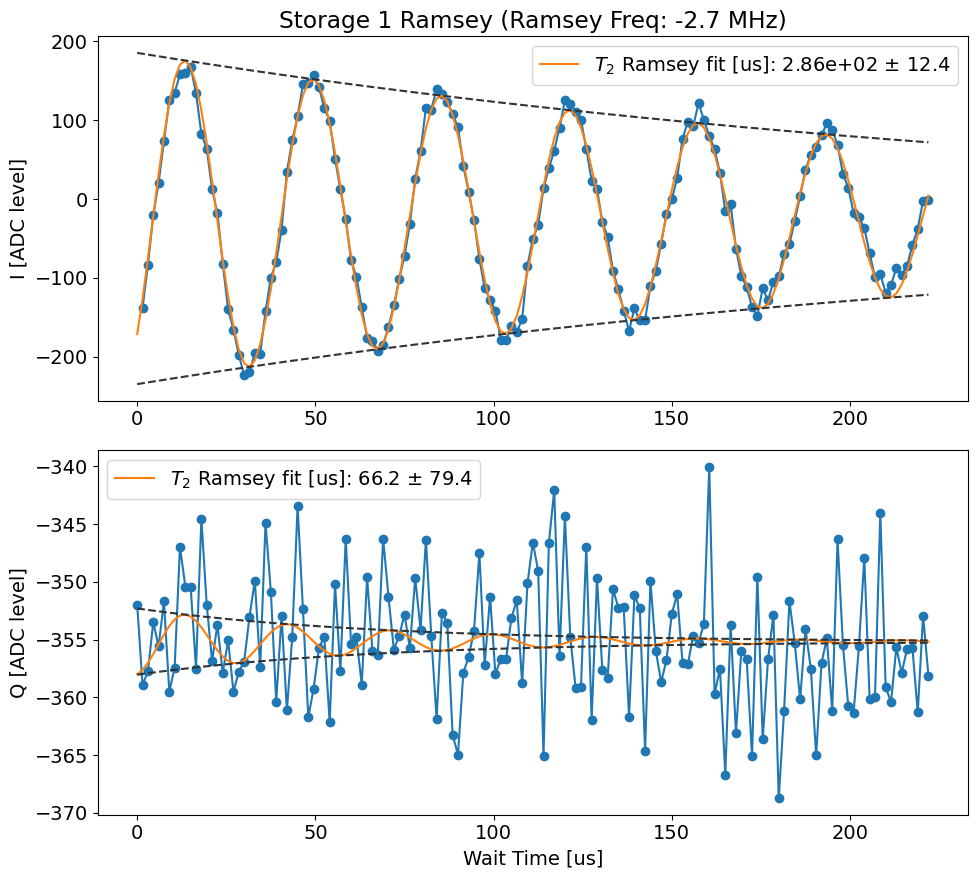

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00025_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.20720720720720726, which is out of bounds 0.00045351473922902497 to 0.06802721088435375. Instead init to 0.03424036281179139
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.02252252252252253 +/- inf
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.0225225225226
 	1974.9774774774776
T2 Ramsey from fit I [us]: 220.5
Fit frequency from Q [MHz]: 0.033943811167377956 +/- 0.0017232814779864266
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.0339438111673
 	1974.9660561888327
T2 Ramsey from fit Q [us]: 122.81054570558719


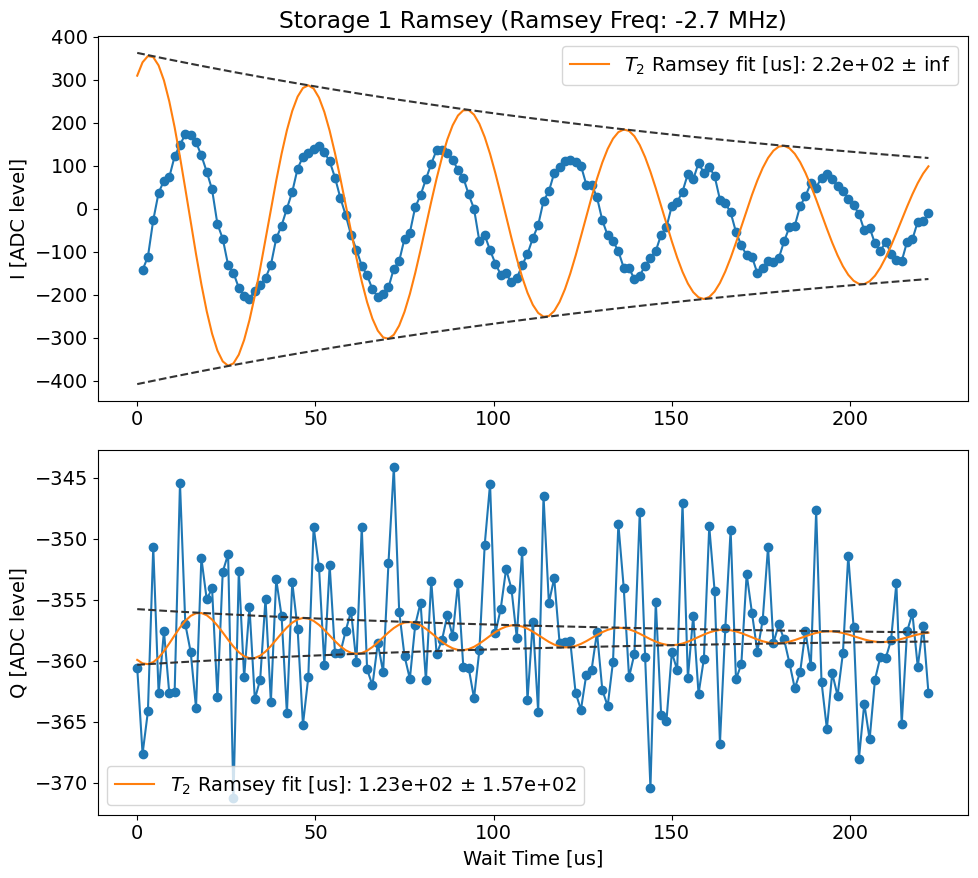

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00026_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.28828828828828834, which is out of bounds 0.00045351473922902497 to 0.06802721088435375. Instead init to 0.03424036281179139
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.0278841355148579 +/- 2.1598714790044298e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.0278841355148
 	1974.9721158644852
T2 Ramsey from fit I [us]: 281.4087270297665
Fit frequency from Q [MHz]: 0.03424036281179139 +/- inf
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.034240362812
 	1974.9657596371883
T2 Ramsey from fit Q [us]: 220.5


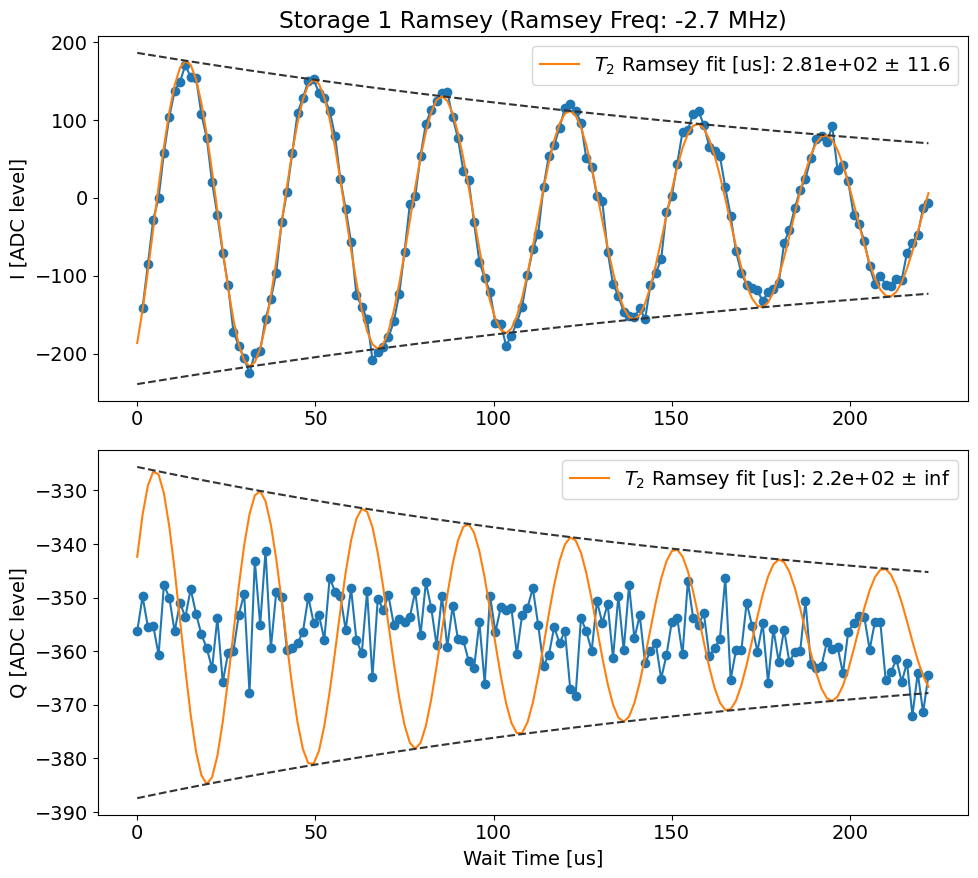

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00092_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.00927565314436329 +/- 1.2503860389846304e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.7792756531444
 	1974.7607243468558
T2 Ramsey from fit I [us]: 435.24921444440594
Fit frequency from Q [MHz]: 0.009275694182260485 +/- 2.334945986746756e-05
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.7792756941824
 	1974.7607243058178
T2 Ramsey from fit Q [us]: 501.2010810473855


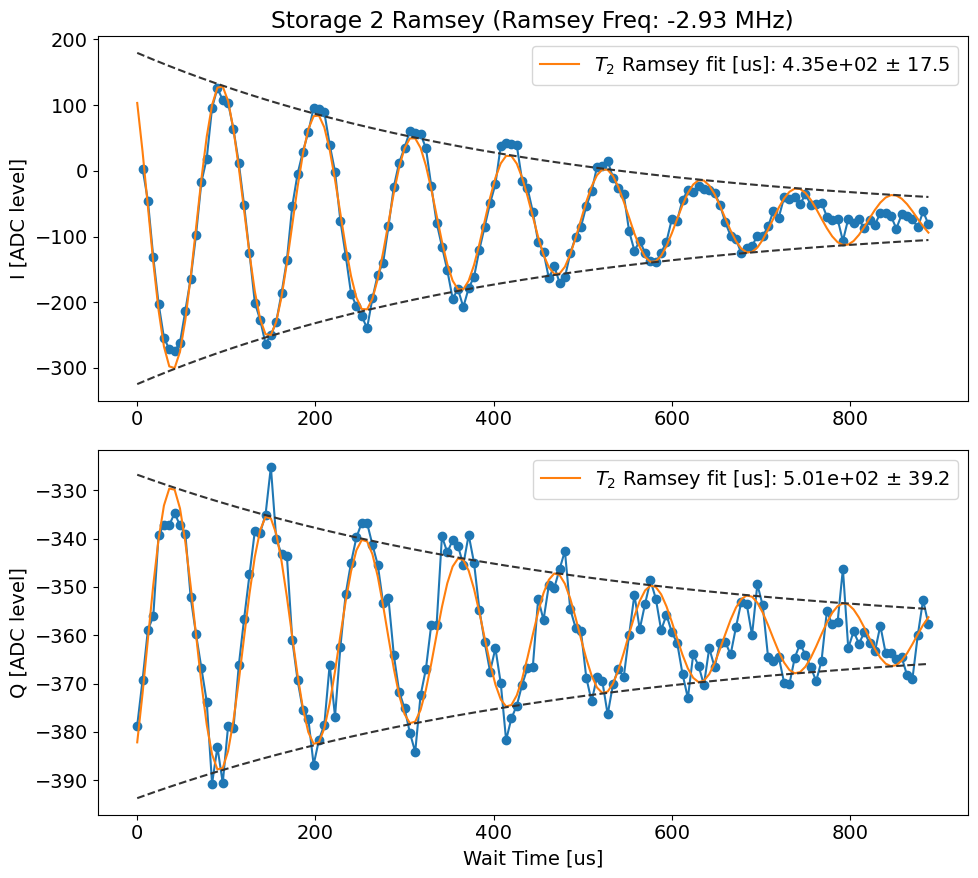

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00030_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.0472972972972973, which is out of bounds 0.00013605442176870748 to 0.02040816326530612. Instead init to 0.010272108843537414
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.009304909061275832 +/- 9.460163914238429e-06
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.7793049090612
 	1974.7606950909387
T2 Ramsey from fit I [us]: 480.8605412521154
Fit frequency from Q [MHz]: 0.009506527551623652 +/- 0.0007824482215939996
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.7795065275516
 	1974.7604934724484
T2 Ramsey from fit Q [us]: 331.053892577845


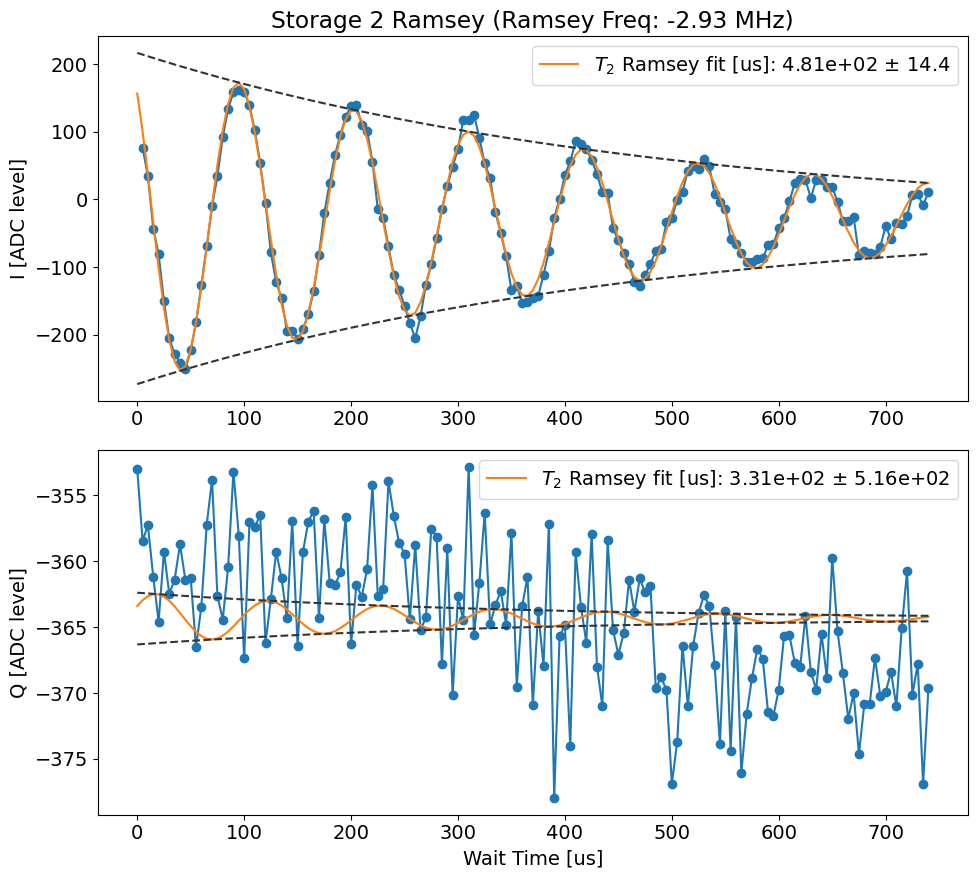

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00031_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.041891891891891894, which is out of bounds 0.00013605442176870748 to 0.02040816326530612. Instead init to 0.010272108843537414
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.009021824812491391 +/- 1.4812668116636866e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.7790218248126
 	1974.7609781751876
T2 Ramsey from fit I [us]: 467.64860176610506
Fit frequency from Q [MHz]: 0.006708477278047908 +/- 0.00045511682862735357
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.7767084772781
 	1974.763291522722
T2 Ramsey from fit Q [us]: 220.50000000000003


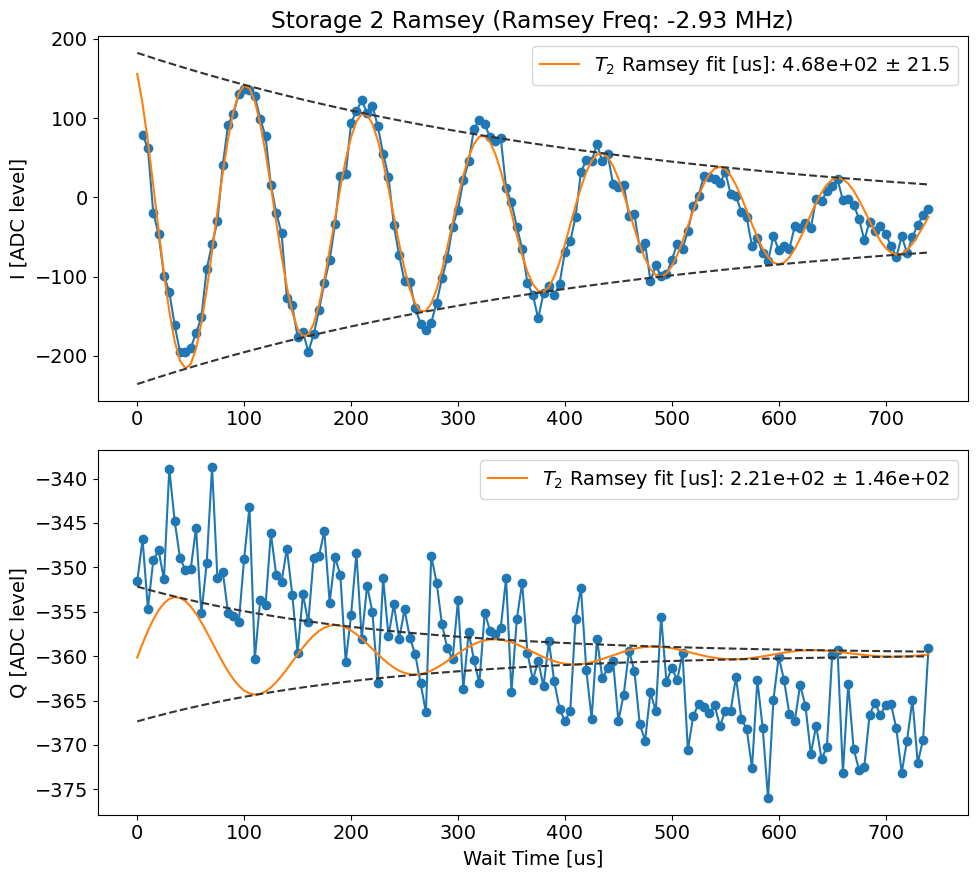

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00032_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.05675675675675676, which is out of bounds 0.00013605442176870748 to 0.02040816326530612. Instead init to 0.010272108843537414
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.009148966546219906 +/- 1.1409160922890485e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.7791489665462
 	1974.7608510334537
T2 Ramsey from fit I [us]: 479.399206024785
Fit frequency from Q [MHz]: 0.006693111082139828 +/- 0.0008831636906414106
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.7766931110823
 	1974.763306888918
T2 Ramsey from fit Q [us]: 220.50000346972368


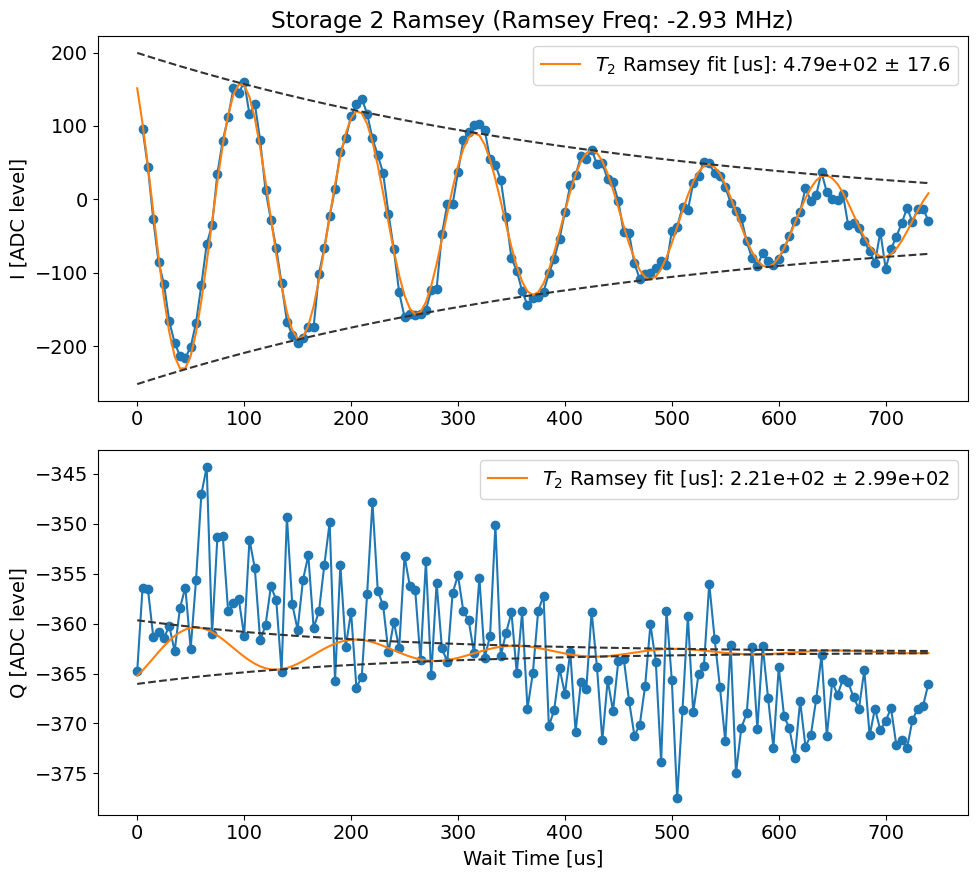

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00033_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.024324324324324326, which is out of bounds 0.00013605442176870748 to 0.02040816326530612. Instead init to 0.010272108843537414
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.009124527986068358 +/- 1.1637626025694463e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.7791245279861
 	1974.760875472014
T2 Ramsey from fit I [us]: 478.39880078856646
Fit frequency from Q [MHz]: 0.011036401023962233 +/- 0.000640485488994774
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.781036401024
 	1974.7589635989762
T2 Ramsey from fit Q [us]: 220.50000000000017


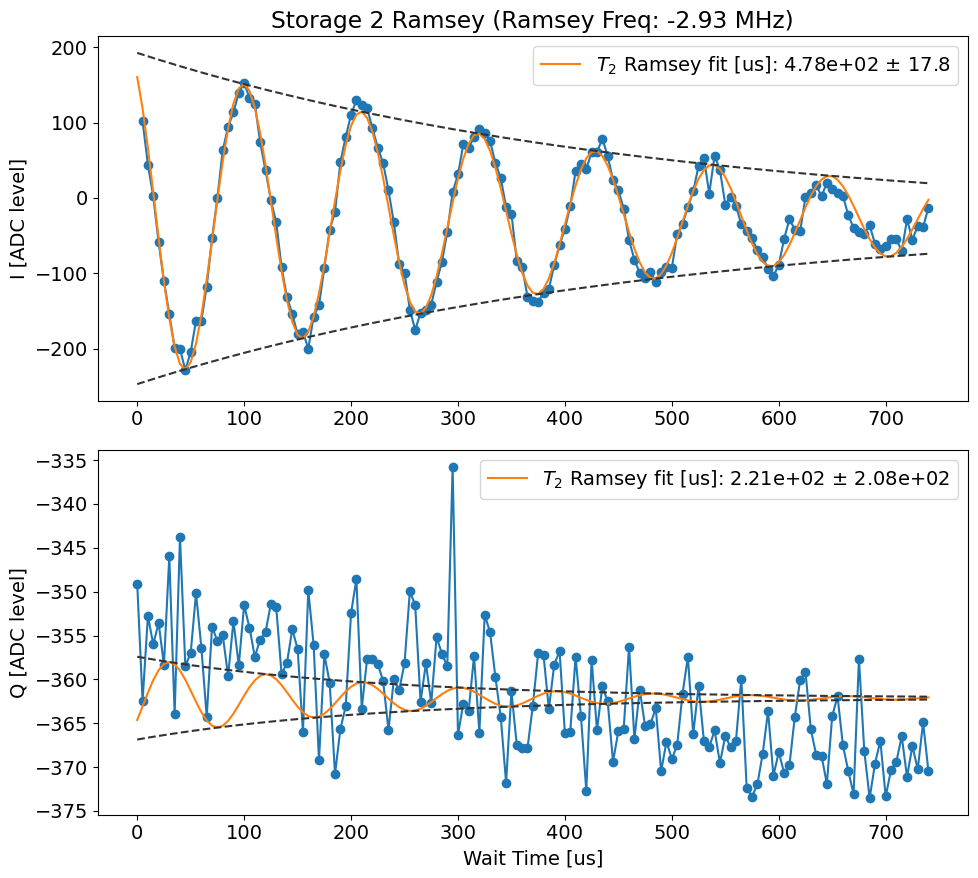

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00034_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.009144948833587442 +/- 1.2940120162016647e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.7791449488336
 	1974.7608550511663
T2 Ramsey from fit I [us]: 484.2246301432168
Fit frequency from Q [MHz]: 0.0006817132700001043 +/- 0.0005599163765425676
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.77068171327
 	1974.7693182867301
T2 Ramsey from fit Q [us]: 220.50000000000003


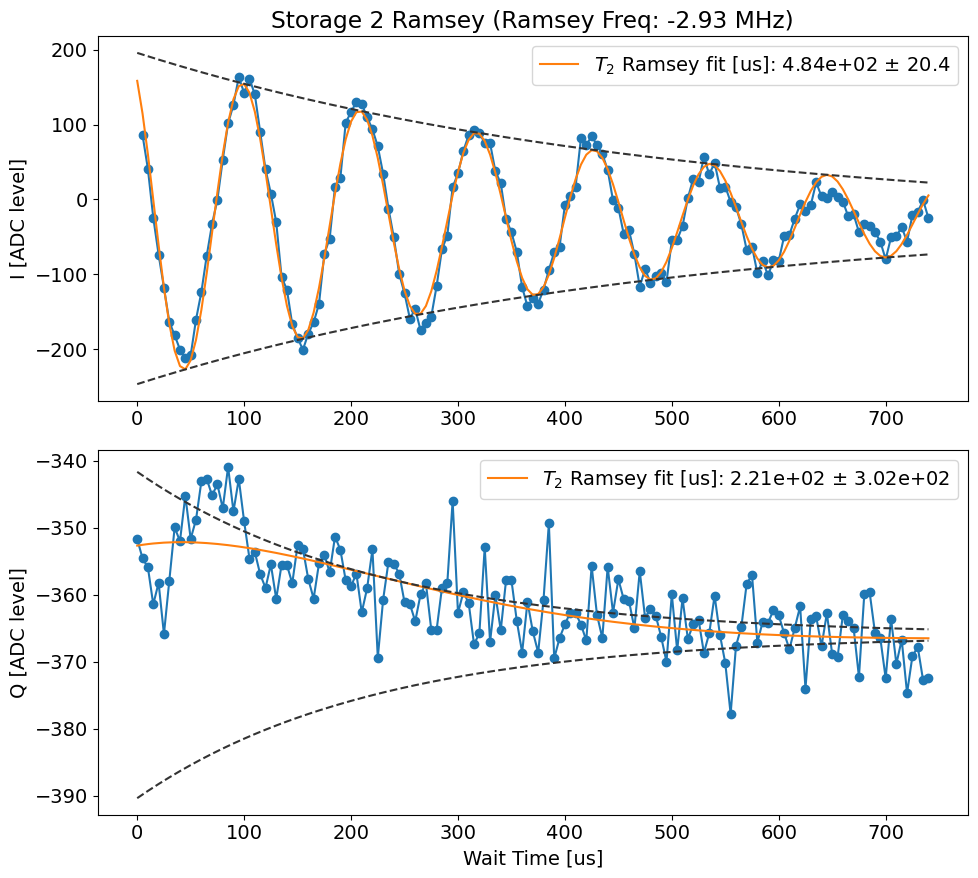

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00094_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.007038288288288289 +/- inf
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.1770382882883
 	1975.1629617117117
T2 Ramsey from fit I [us]: 705.6
Fit frequency from Q [MHz]: 0.006928314765778222 +/- 1.9806257535139186e-05
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.1769283147657
 	1975.1630716852342
T2 Ramsey from fit Q [us]: 846.5052991695401


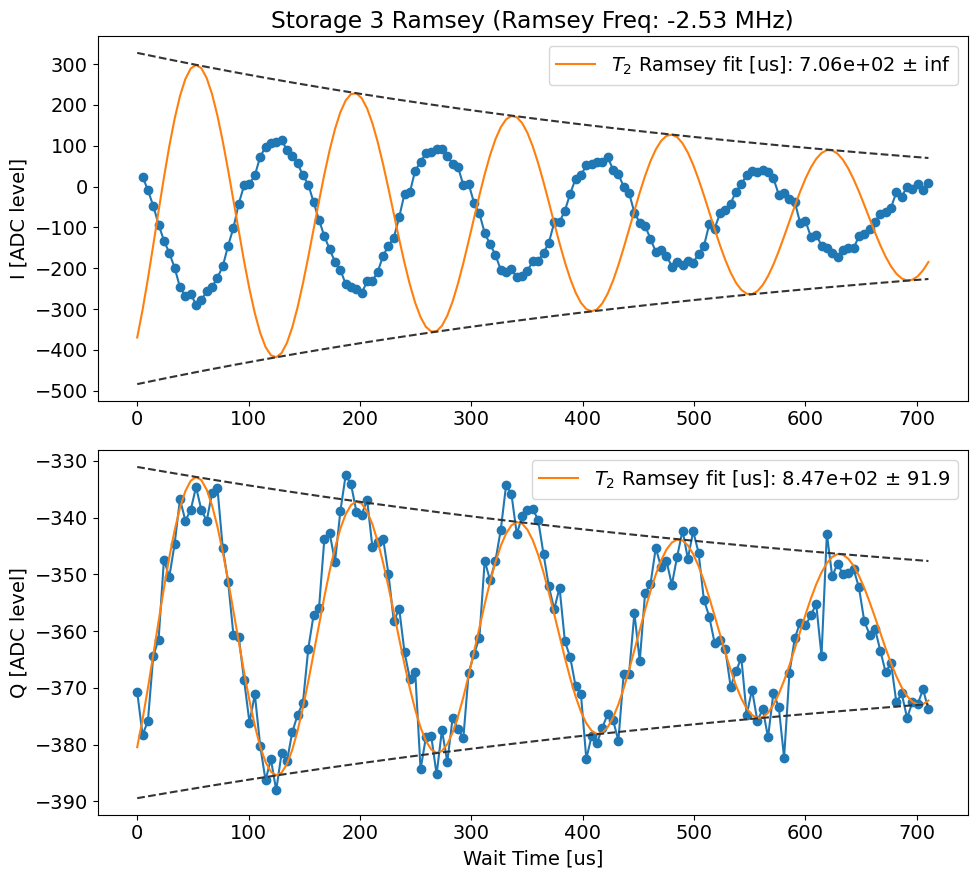

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00038_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.00692720887759949 +/- 8.019933061917515e-06
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.1769272088777
 	1975.1630727911224
T2 Ramsey from fit I [us]: 730.4956197599839
Fit frequency from Q [MHz]: 0.01612327793781455 +/- 0.00038368419681635664
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.186123277938
 	1975.1538767220623
T2 Ramsey from fit Q [us]: 402.0314139455709


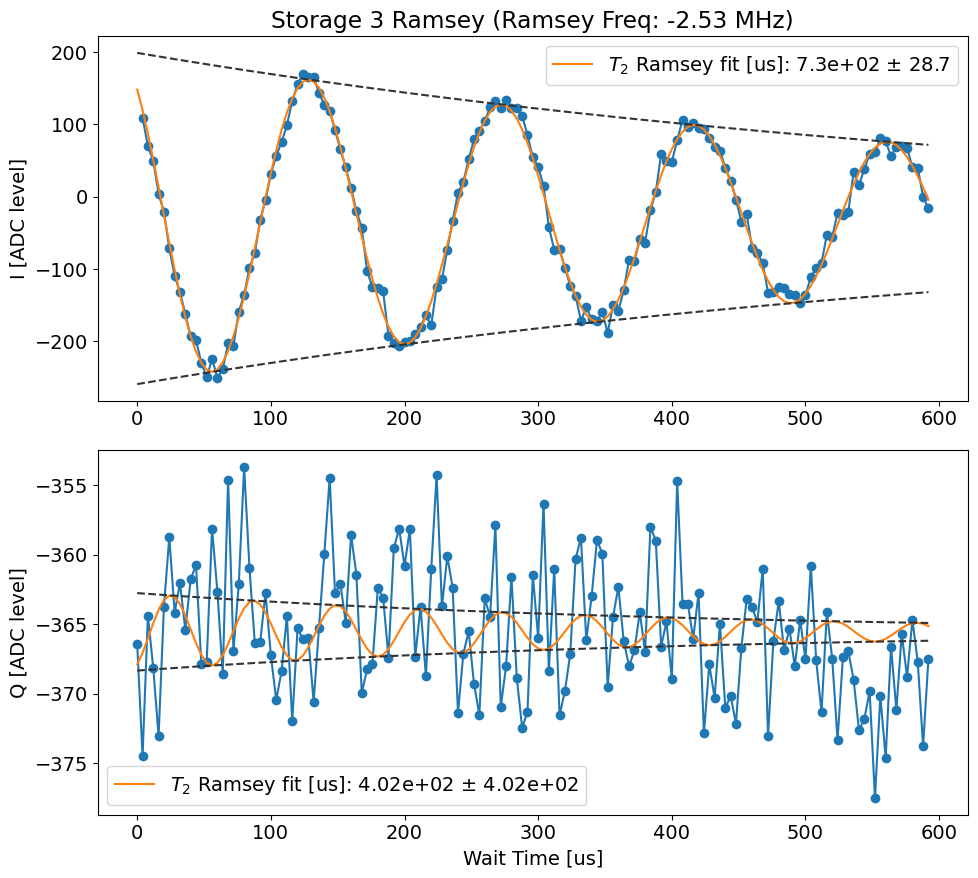

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00039_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.08614864864864866, which is out of bounds 0.00017006802721088437 to 0.025510204081632654. Instead init to 0.01284013605442177
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.006728474246519203 +/- 9.15088895698025e-06
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.1767284742466
 	1975.1632715257535
T2 Ramsey from fit I [us]: 768.1183905031686
Fit frequency from Q [MHz]: 0.013520001254445226 +/- 0.0010373668168444593
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.1835200012545
 	1975.1564799987457
T2 Ramsey from fit Q [us]: 176.4000000000002


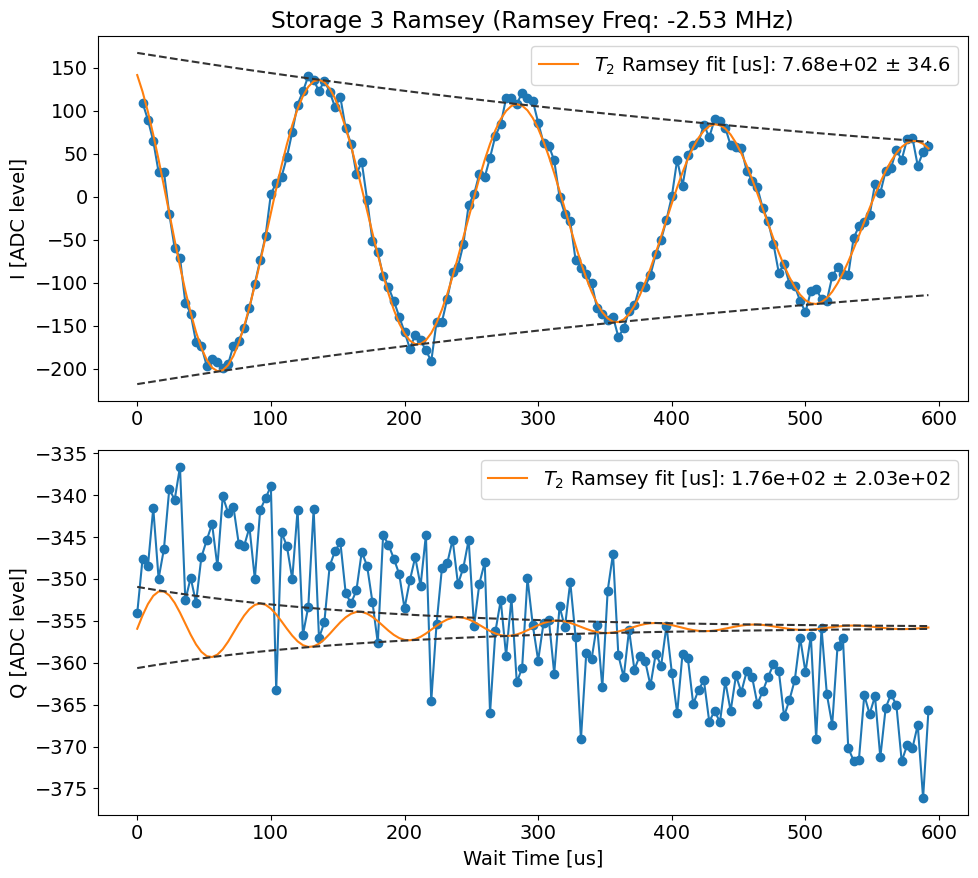

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00040_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.05405405405405406, which is out of bounds 0.00017006802721088437 to 0.025510204081632654. Instead init to 0.01284013605442177
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.006804993189434538 +/- 8.469251608065284e-06
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.1768049931895
 	1975.1631950068106
T2 Ramsey from fit I [us]: 787.5471411192749
Fit frequency from Q [MHz]: 0.013887093992653112 +/- 0.0015270592440537187
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.1838870939928
 	1975.1561129060074
T2 Ramsey from fit Q [us]: 241.1761179608836


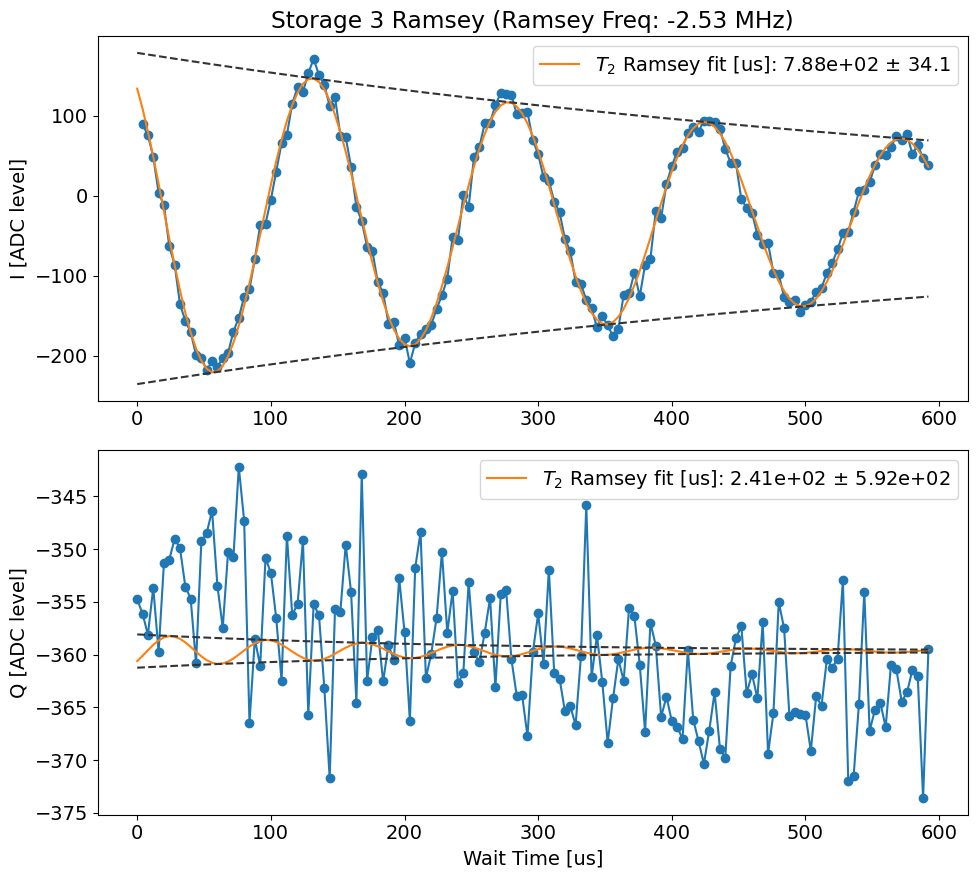

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00041_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.10810810810810811, which is out of bounds 0.00017006802721088437 to 0.025510204081632654. Instead init to 0.01284013605442177
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.006797651925472088 +/- 8.24076910208164e-06
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.1767976519254
 	1975.1632023480745
T2 Ramsey from fit I [us]: 735.0122217312199
Fit frequency from Q [MHz]: 0.009967937981875476 +/- 0.0005319836461686422
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.179967937982
 	1975.1600320620182
T2 Ramsey from fit Q [us]: 176.40000000000785


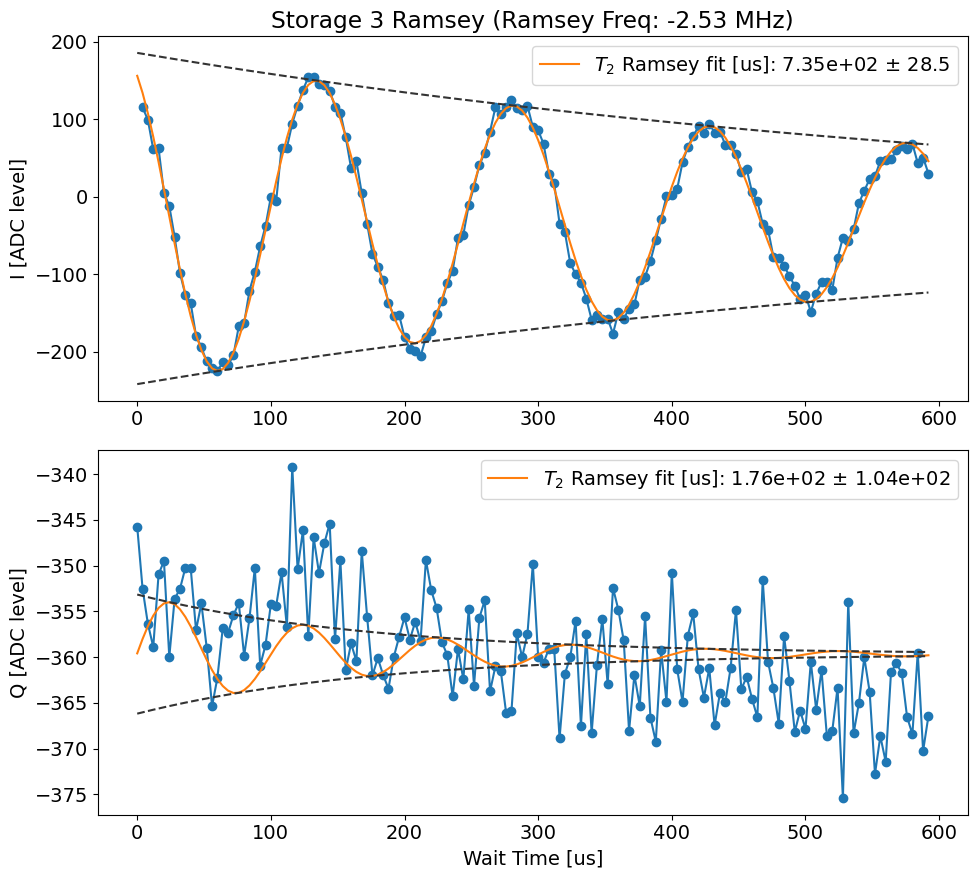

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00042_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.12331081081081081, which is out of bounds 0.00017006802721088437 to 0.025510204081632654. Instead init to 0.01284013605442177
Attempted to init fitparam 1 to 0.08277027027027027, which is out of bounds 0.00017006802721088437 to 0.025510204081632654. Instead init to 0.01284013605442177
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.00681064840915359 +/- 8.625264232366042e-06
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.1768106484092
 	1975.163189351591
T2 Ramsey from fit I [us]: 762.2115098718331
Fit frequency from Q [MHz]: 0.011765511845213399 +/- 0.0006724733774246366
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.1817655118452
 	1975.158234488155
T2 Ramsey from fit Q [us]: 299.83695869963213


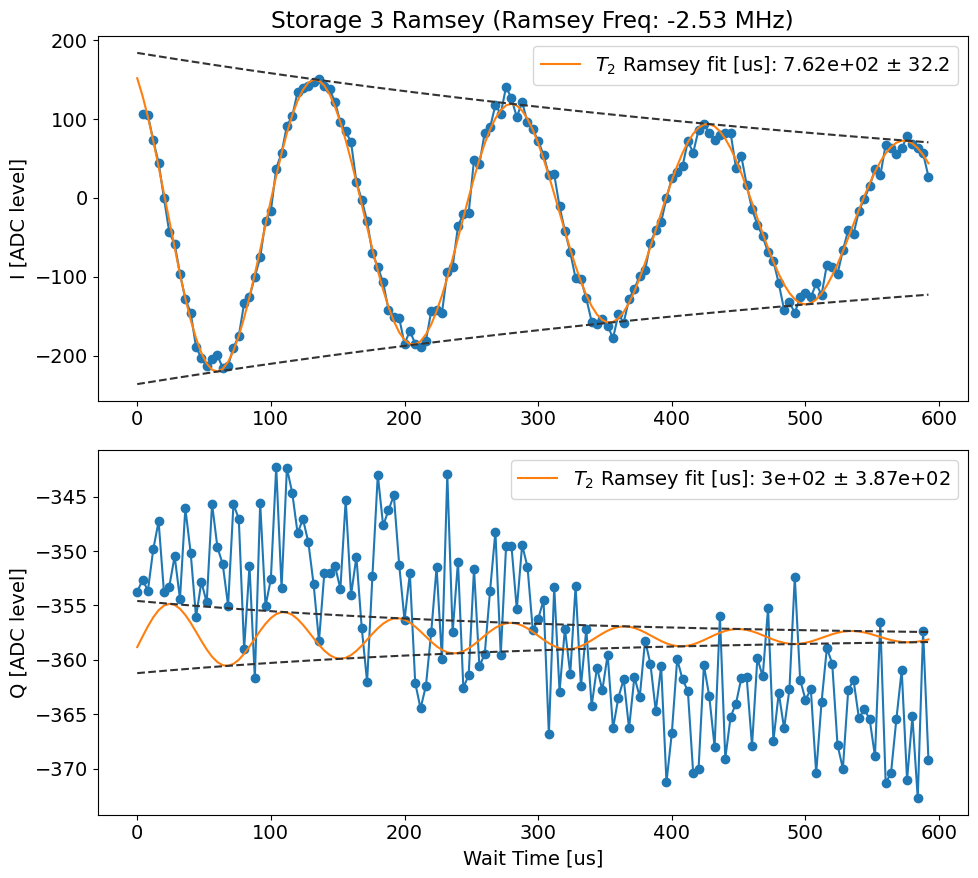

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00096_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.010326146610421893 +/- 8.13191773979571e-06
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.7903261466104
 	1975.7696738533896
T2 Ramsey from fit I [us]: 841.6396191658031
Fit frequency from Q [MHz]: 0.010332772592383 +/- 2.5217126188403754e-05
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.7903327725924
 	1975.7696672274076
T2 Ramsey from fit Q [us]: 794.2282688795814


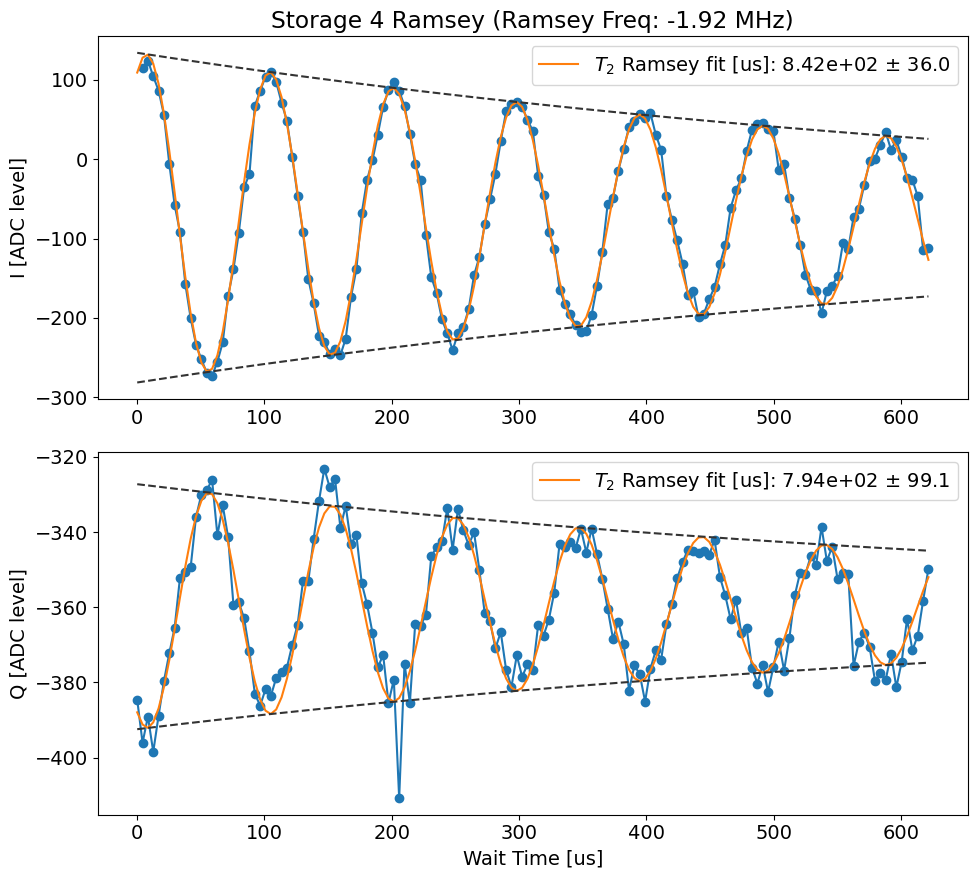

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00046_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.010282564347184005 +/- 8.003265728796944e-06
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.7902825643473
 	1975.7697174356529
T2 Ramsey from fit I [us]: 834.9317355238192
Fit frequency from Q [MHz]: 0.025097817751323522 +/- 0.00040746271435162357
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.8050978177514
 	1975.7549021822488
T2 Ramsey from fit Q [us]: 373.27300370282154


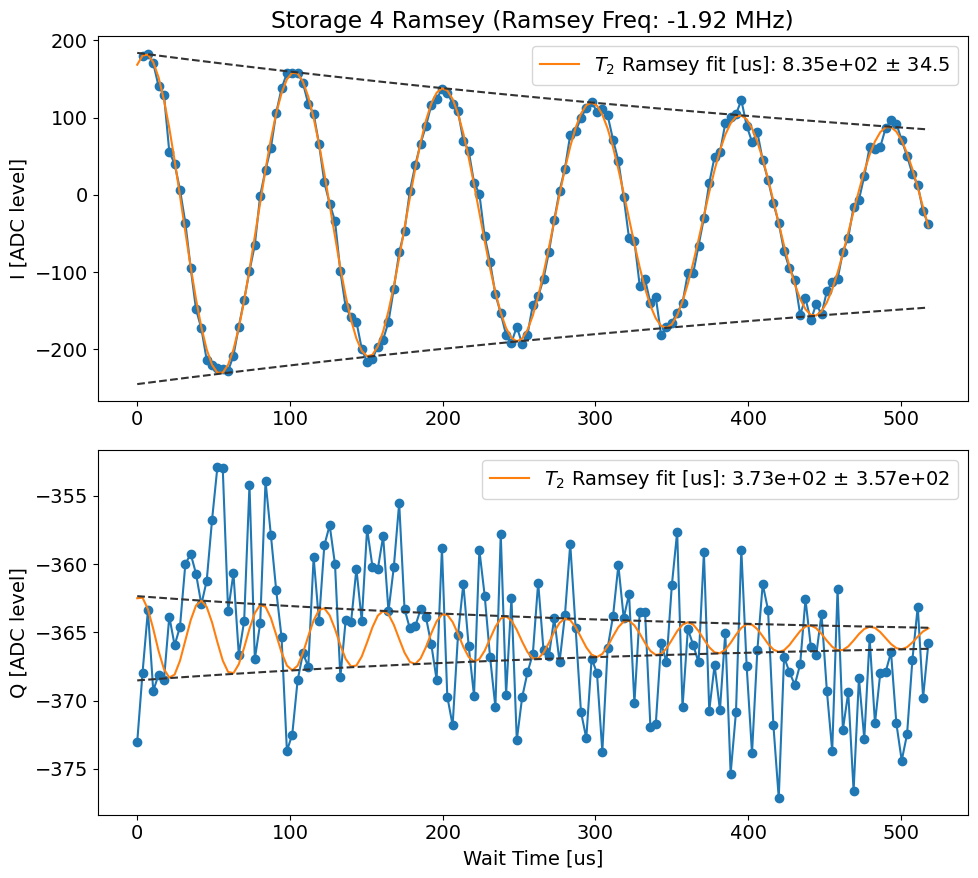

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00047_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.010451938716166207 +/- 1.1220364339102276e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.7904519387162
 	1975.7695480612838
T2 Ramsey from fit I [us]: 841.5600077468966
Fit frequency from Q [MHz]: 0.014764657064967133 +/- 0.0005287216559952972
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.7947646570651
 	1975.765235342935
T2 Ramsey from fit Q [us]: 332.3667985514505


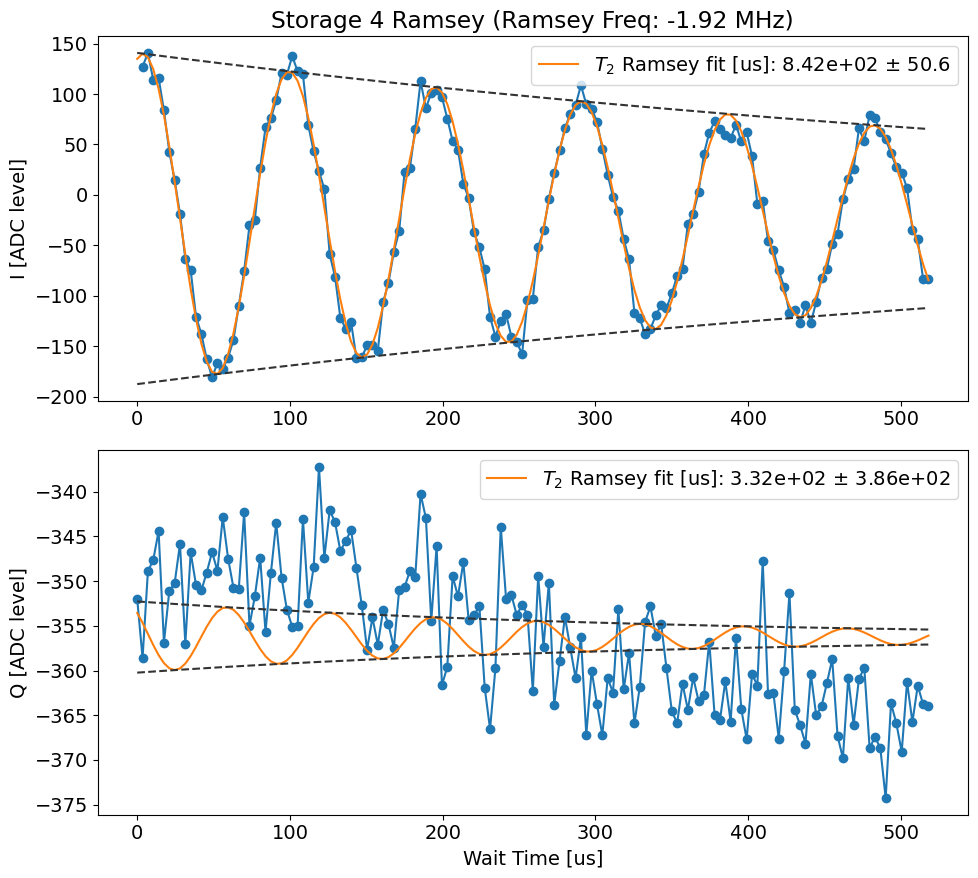

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00048_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.010378581402811324 +/- 9.406113022439533e-06
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.7903785814028
 	1975.7696214185971
T2 Ramsey from fit I [us]: 859.5791479964018
Fit frequency from Q [MHz]: 0.021235521235521235 +/- inf
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.8012355212356
 	1975.7587644787645
T2 Ramsey from fit Q [us]: 514.5


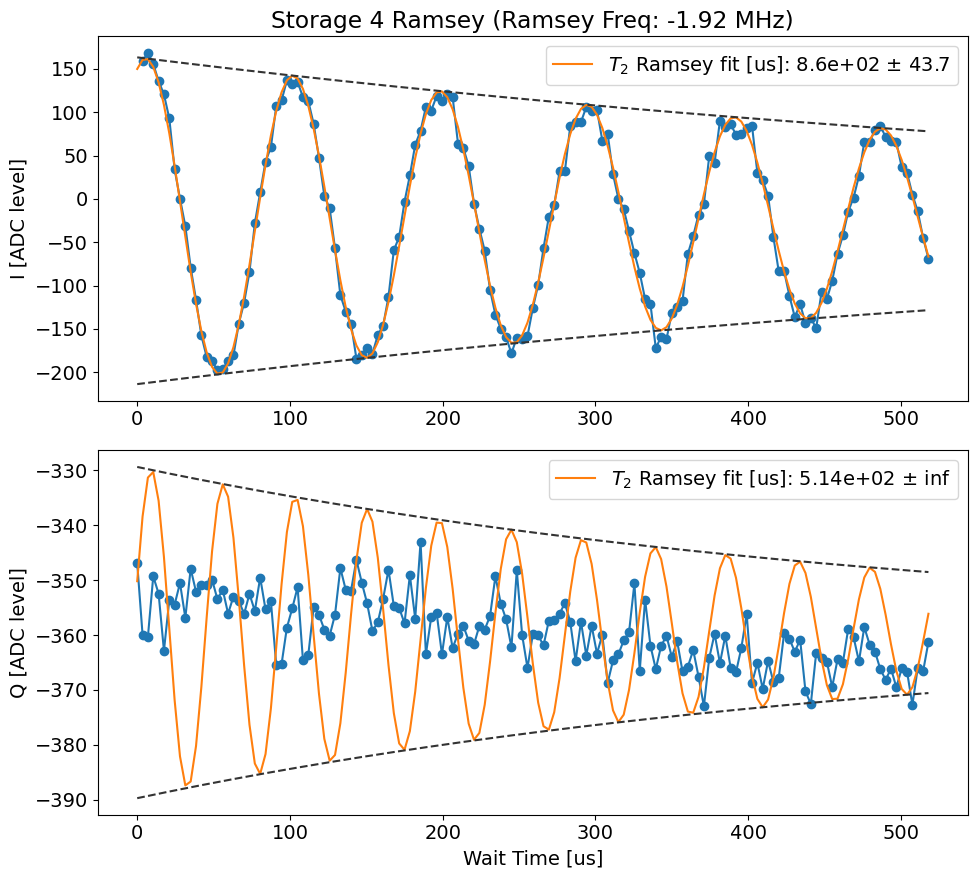

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00049_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.11969111969111969, which is out of bounds 0.00019436345966958212 to 0.029154518950437316. Instead init to 0.01467444120505345
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.010381931882552613 +/- 1.0282062006625477e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.7903819318826
 	1975.7696180681176
T2 Ramsey from fit I [us]: 782.0106985825807
Fit frequency from Q [MHz]: 0.012716061819950048 +/- 0.0014663847200881912
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.79271606182
 	1975.76728393818
T2 Ramsey from fit Q [us]: 192.68721103070789


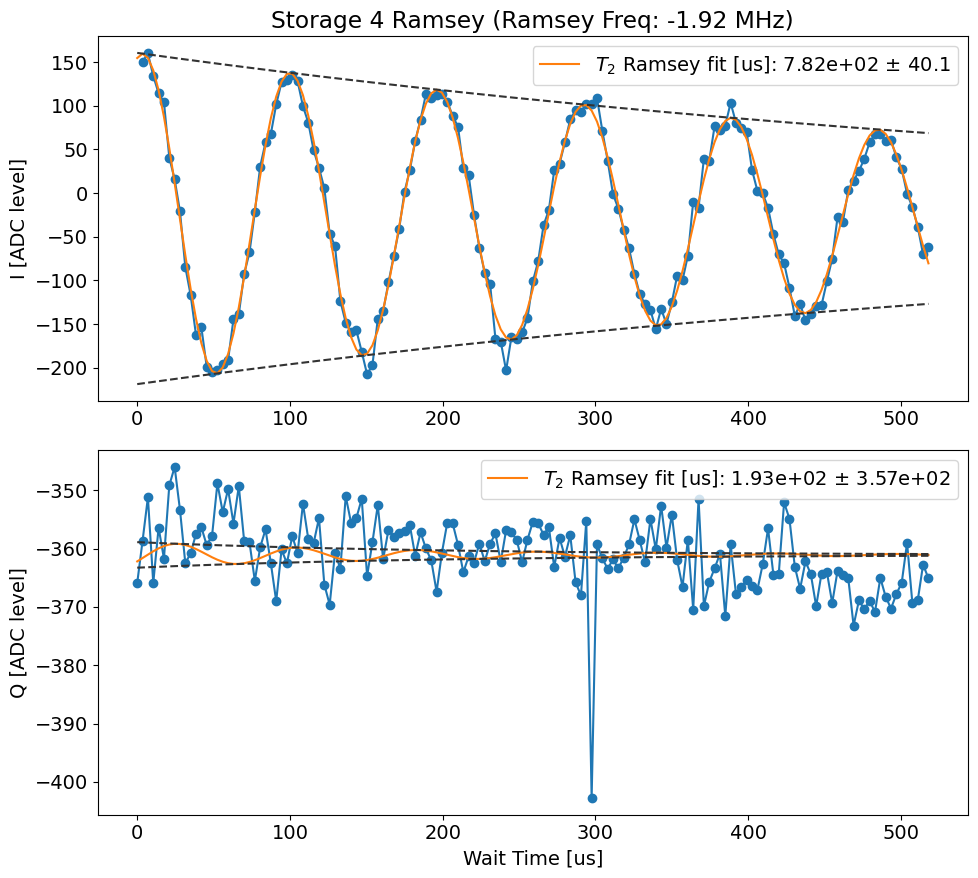

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00050_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.03667953667953668, which is out of bounds 0.00019436345966958212 to 0.029154518950437316. Instead init to 0.01467444120505345
Attempted to init fitparam 1 to 0.05791505791505792, which is out of bounds 0.00019436345966958212 to 0.029154518950437316. Instead init to 0.01467444120505345
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.010383140613489219 +/- 9.553785427148116e-06
Suggested new pi pulse frequency from fit I [MHz]:
 	1975.7903831406136
 	1975.7696168593866
T2 Ramsey from fit I [us]: 870.5597590792732
Fit frequency from Q [MHz]: 0.013955792491615658 +/- 0.001379113081514552
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1975.7939557924917
 	1975.7660442075085
T2 Ramsey from fit Q [us]: 154.35000000000002


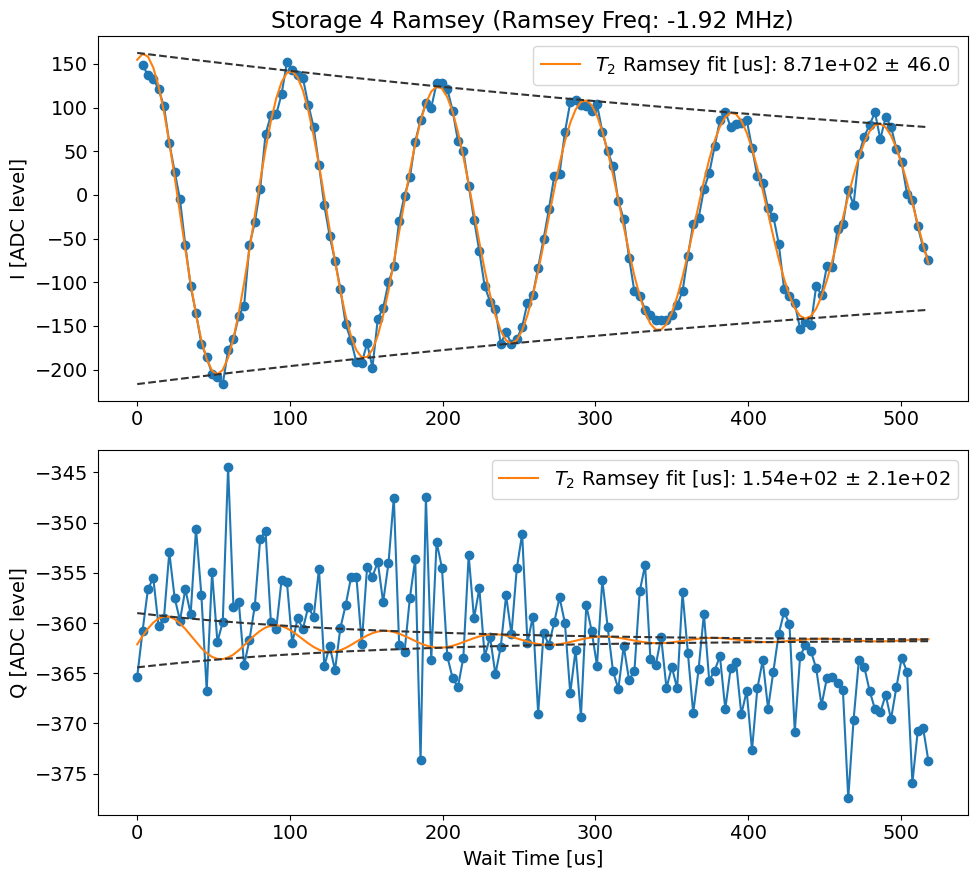

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00098_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.009599770011241538 +/- 8.482414780987029e-06
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.4295997700112
 	1974.410400229989
T2 Ramsey from fit I [us]: 608.4715212840127
Fit frequency from Q [MHz]: 0.009643935049047276 +/- 2.704646553921713e-05
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.4296439350492
 	1974.410356064951
T2 Ramsey from fit Q [us]: 690.385966664025


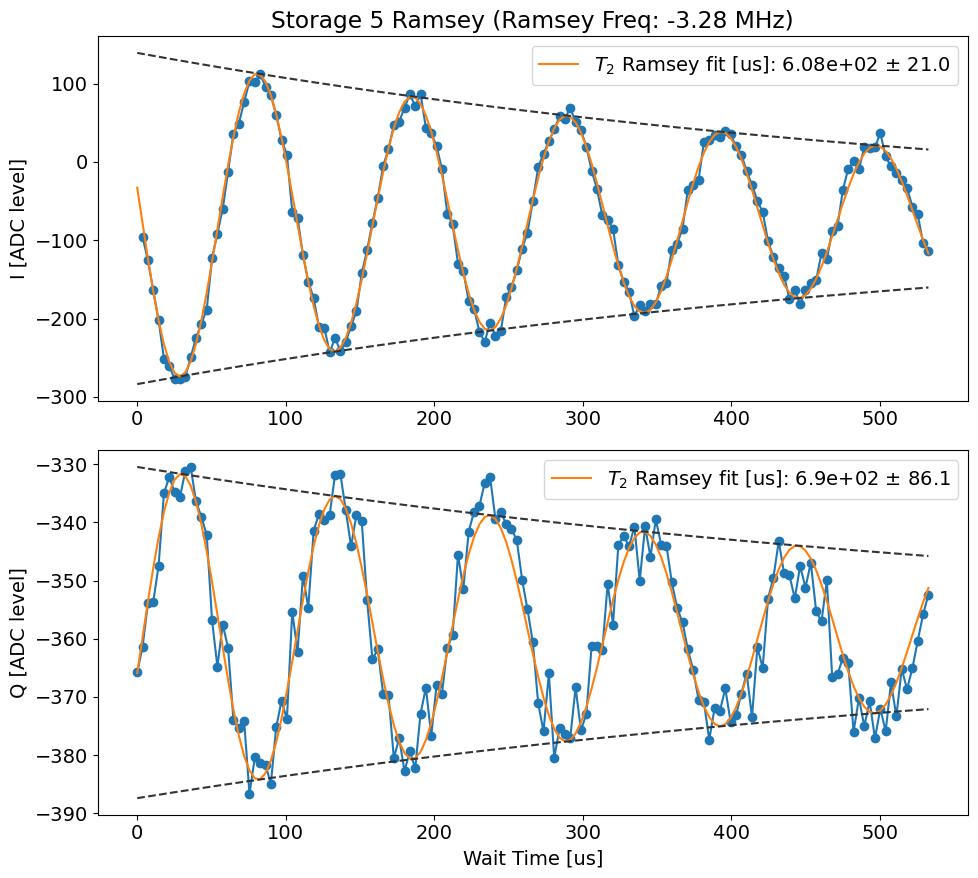

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00054_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.009584217709933085 +/- 9.963693391452207e-06
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.42958421771
 	1974.41041578229
T2 Ramsey from fit I [us]: 586.5540372746107
Fit frequency from Q [MHz]: 0.03154706328335116 +/- 0.0005342908081931783
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.4515470632834
 	1974.3884529367167
T2 Ramsey from fit Q [us]: 294.00906367425017


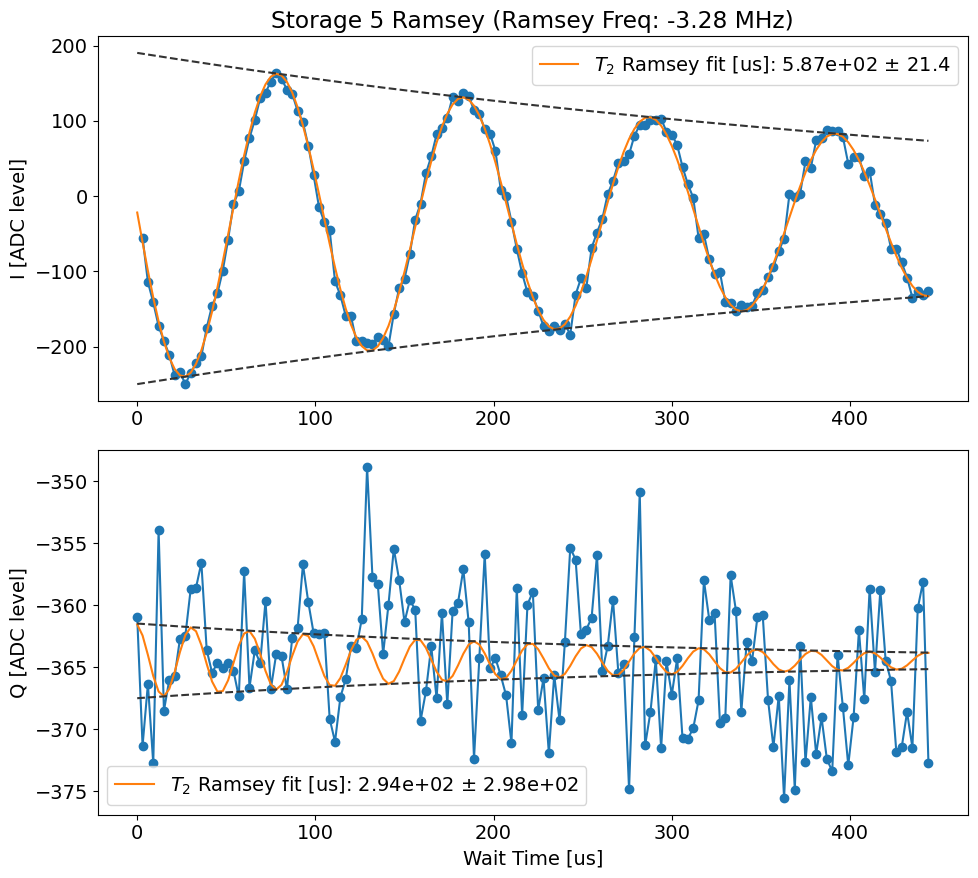

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00055_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.009714458799019448 +/- 1.2436482340288466e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.429714458799
 	1974.4102855412011
T2 Ramsey from fit I [us]: 611.3441883816489
Fit frequency from Q [MHz]: 0.009722653766162808 +/- 0.00041812828320332405
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.4297226537662
 	1974.410277346234
T2 Ramsey from fit Q [us]: 220.16574665887327


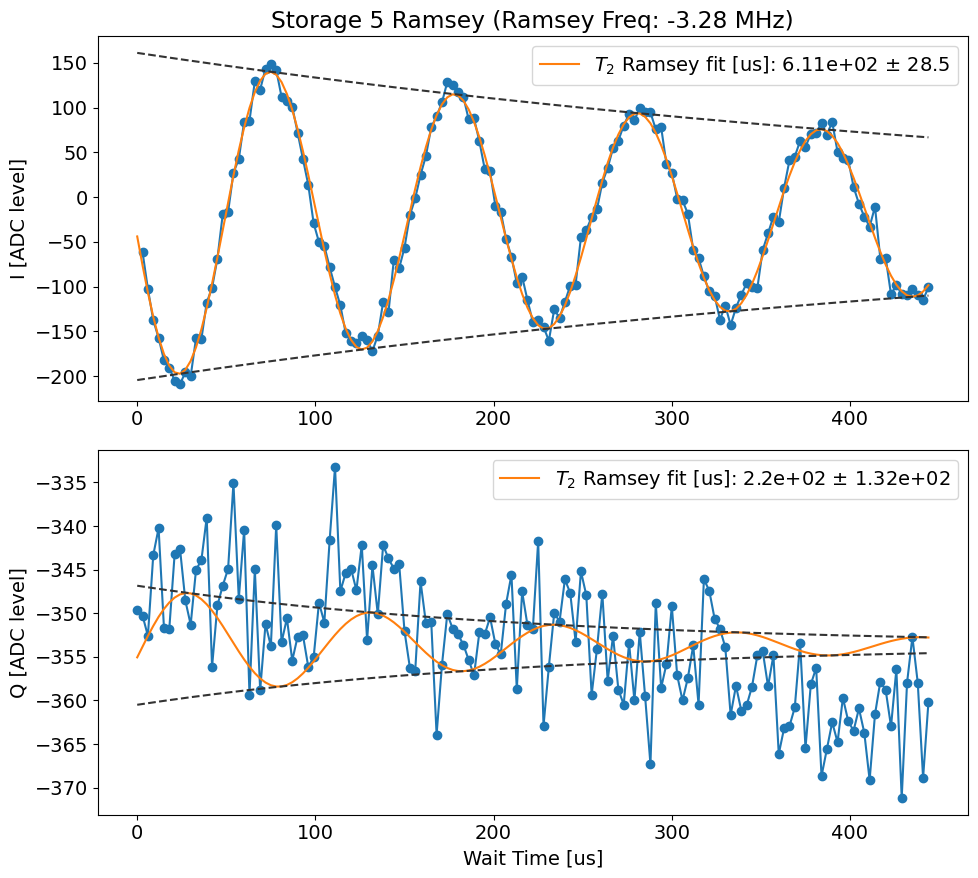

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00056_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.0096359491330184 +/- 1.0907125023735514e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.4296359491332
 	1974.410364050867
T2 Ramsey from fit I [us]: 622.1985867160366
Fit frequency from Q [MHz]: 0.010268328434574061 +/- 0.00040507640654822253
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.4302683284345
 	1974.4097316715654
T2 Ramsey from fit Q [us]: 134.7314377754152


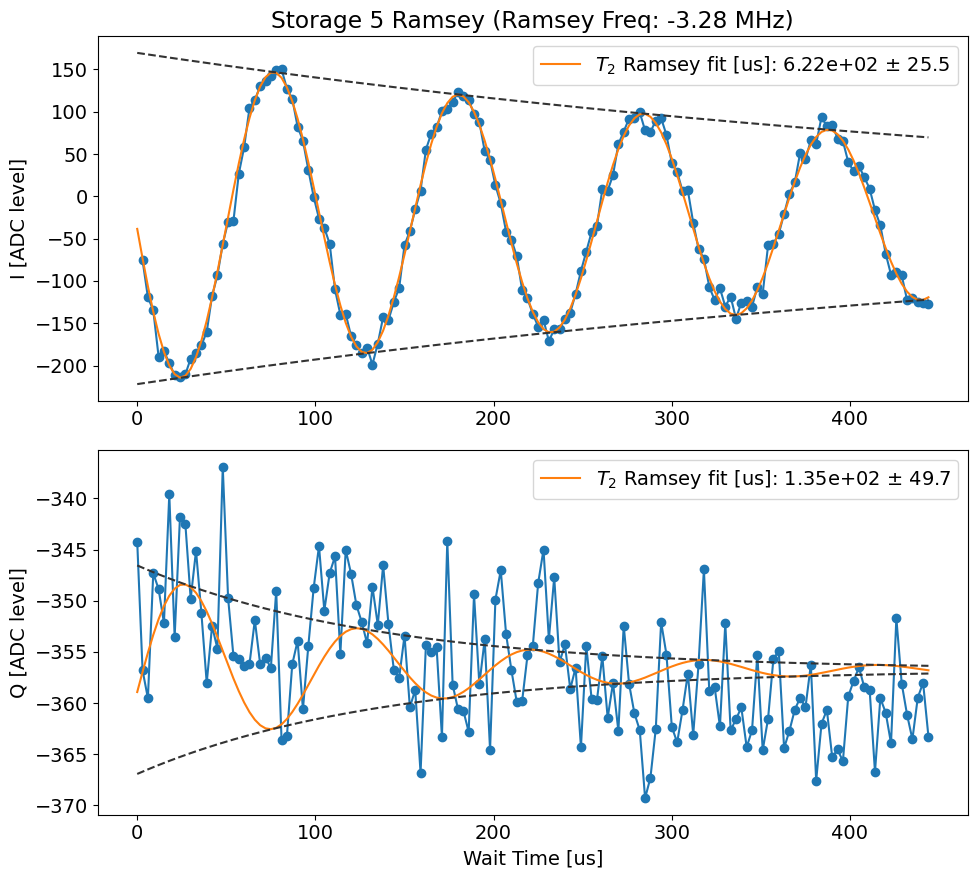

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00057_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.009665405436985535 +/- 1.2287321067577001e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.429665405437
 	1974.410334594563
T2 Ramsey from fit I [us]: 565.2851943501491
Fit frequency from Q [MHz]: 0.03171250839227907 +/- 0.0005091709107713296
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.4517125083923
 	1974.3882874916078
T2 Ramsey from fit Q [us]: 277.9231766456186


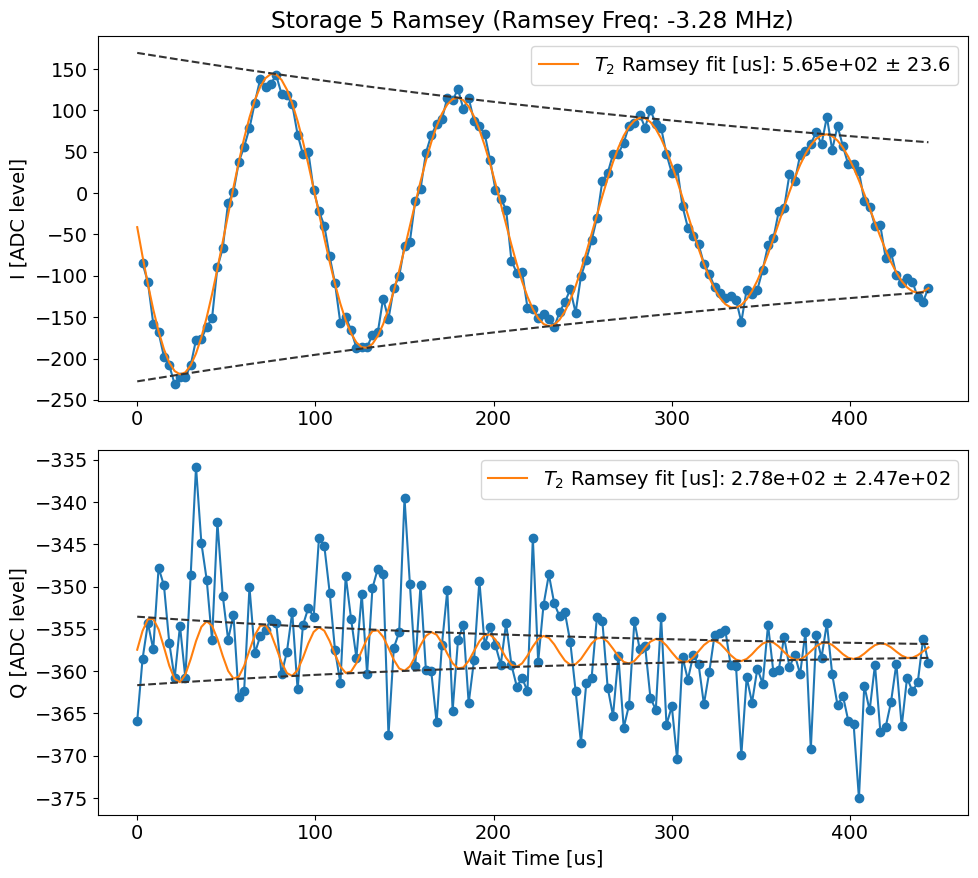

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00058_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.009661870790424005 +/- 1.2844163296884598e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.4296618707904
 	1974.4103381292095
T2 Ramsey from fit I [us]: 579.3387474700384
Fit frequency from Q [MHz]: 0.02870992991101539 +/- 0.00046261248737189685
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.448709929911
 	1974.391290070089
T2 Ramsey from fit Q [us]: 247.87664653421294


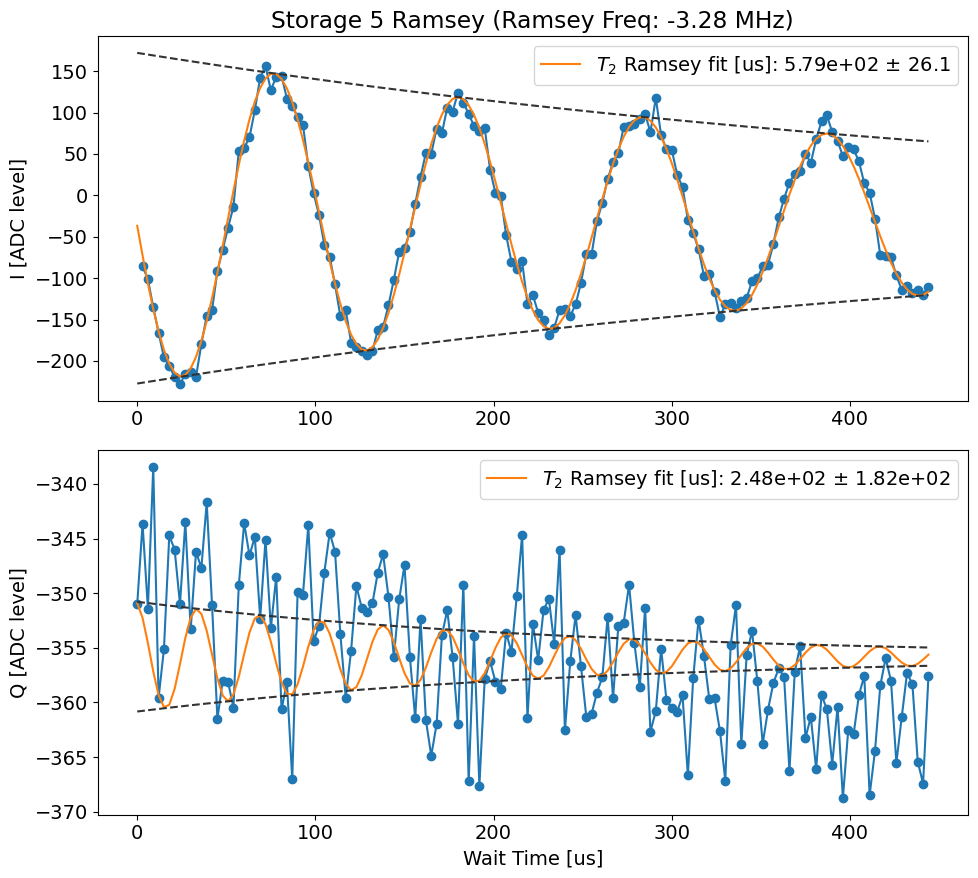

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00100_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.016132048861882162 +/- 8.63183704728926e-06
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.466132048862
 	1974.4338679511382
T2 Ramsey from fit I [us]: 1071.5665451414407
Fit frequency from Q [MHz]: 0.016139889851576925 +/- 1.8311200736383043e-05
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.4661398898515
 	1974.4338601101485
T2 Ramsey from fit Q [us]: 977.5297387550304


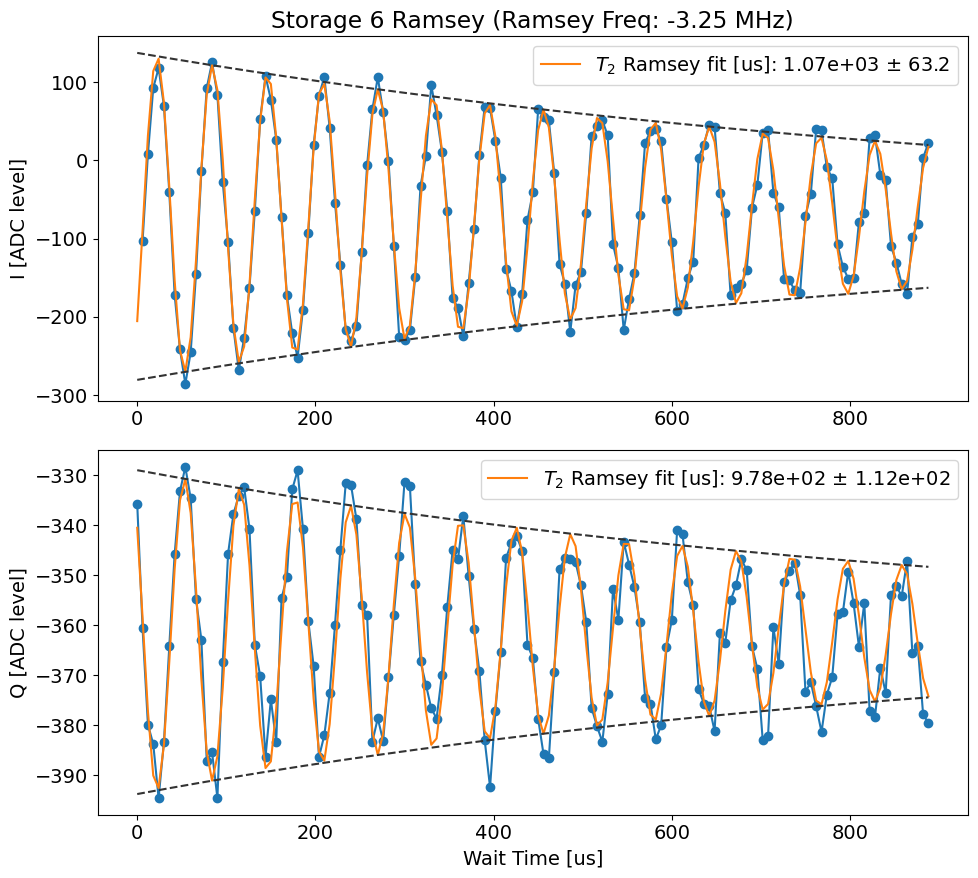

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00062_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.014864864864864866 +/- inf
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.464864864865
 	1974.4351351351352
T2 Ramsey from fit I [us]: 735.0
Fit frequency from Q [MHz]: 0.020408163265306117 +/- 0.0005237106308687052
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.4704081632653
 	1974.4295918367347
T2 Ramsey from fit Q [us]: 305.8457114769793


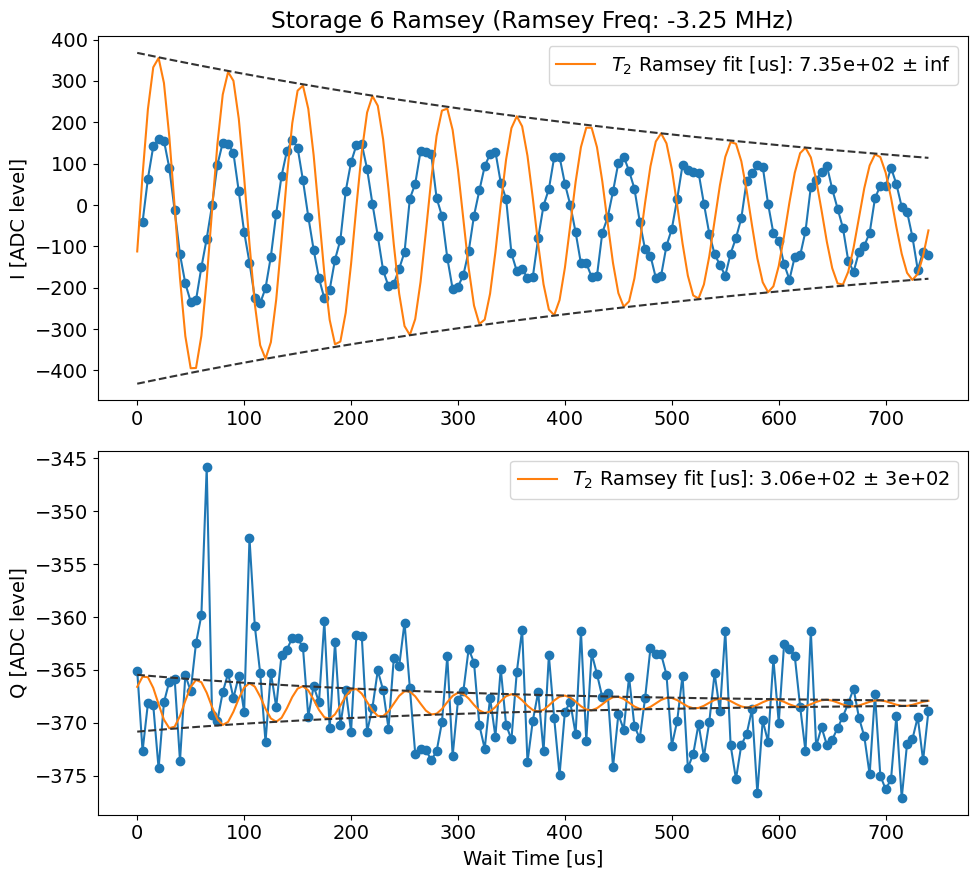

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00063_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.03513513513513514, which is out of bounds 0.00013605442176870748 to 0.02040816326530612. Instead init to 0.010272108843537414
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.01616001534847485 +/- 1.064071374815546e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.4661600153486
 	1974.4338399846515
T2 Ramsey from fit I [us]: 1023.8613147058854
Fit frequency from Q [MHz]: 0.01261692887843259 +/- 0.0005157860133333246
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.4626169288786
 	1974.4373830711215
T2 Ramsey from fit Q [us]: 220.50000000000003


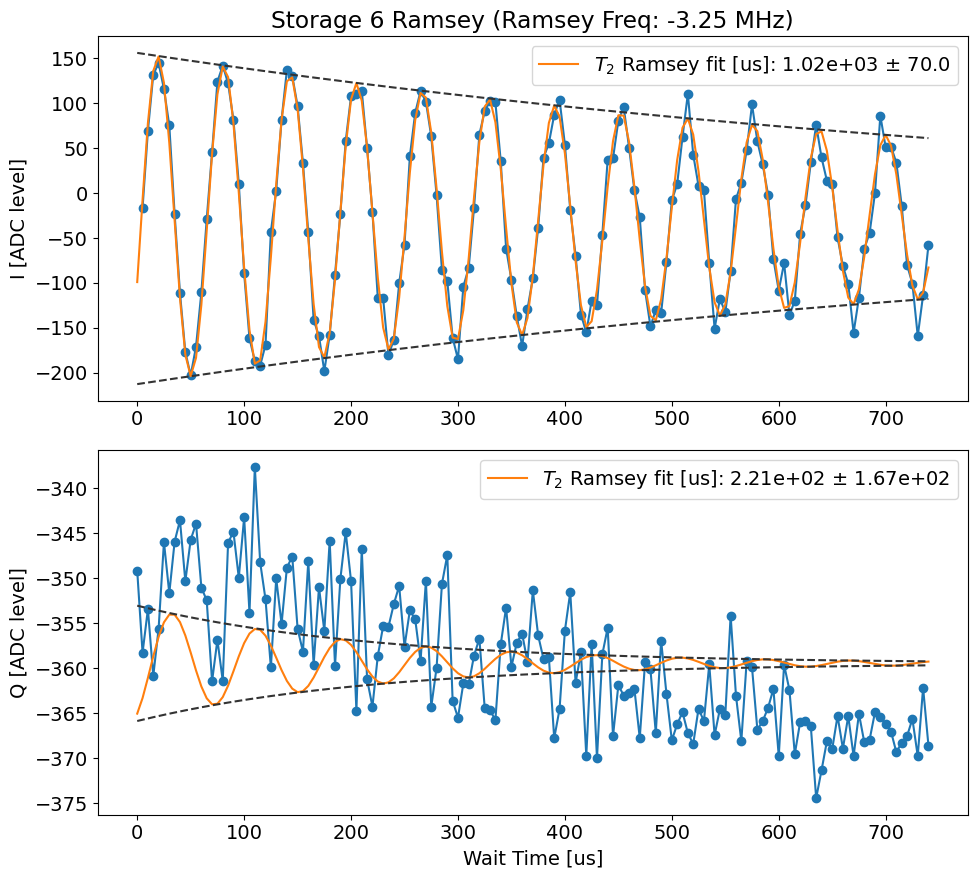

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00064_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.06756756756756757, which is out of bounds 0.00013605442176870748 to 0.02040816326530612. Instead init to 0.010272108843537414
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.016152444717988847 +/- 9.95187561096664e-06
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.466152444718
 	1974.433847555282
T2 Ramsey from fit I [us]: 935.0878129225531
Fit frequency from Q [MHz]: 0.008553179181182976 +/- 0.00039940966537450786
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.4585531791813
 	1974.4414468208188
T2 Ramsey from fit Q [us]: 220.50000003160454


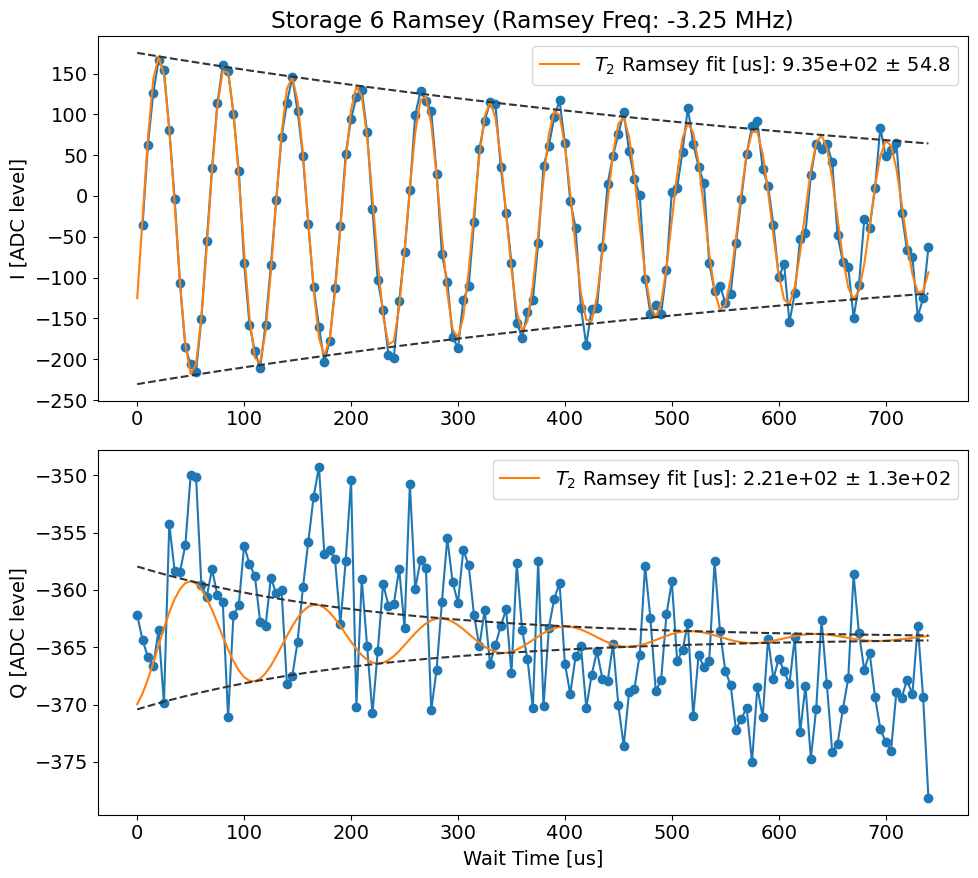

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00065_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.014864864864864866 +/- inf
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.464864864865
 	1974.4351351351352
T2 Ramsey from fit I [us]: 735.0
Fit frequency from Q [MHz]: 0.008393739788611864 +/- 0.0006581865771462017
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.4583937397886
 	1974.4416062602115
T2 Ramsey from fit Q [us]: 220.50000000020492


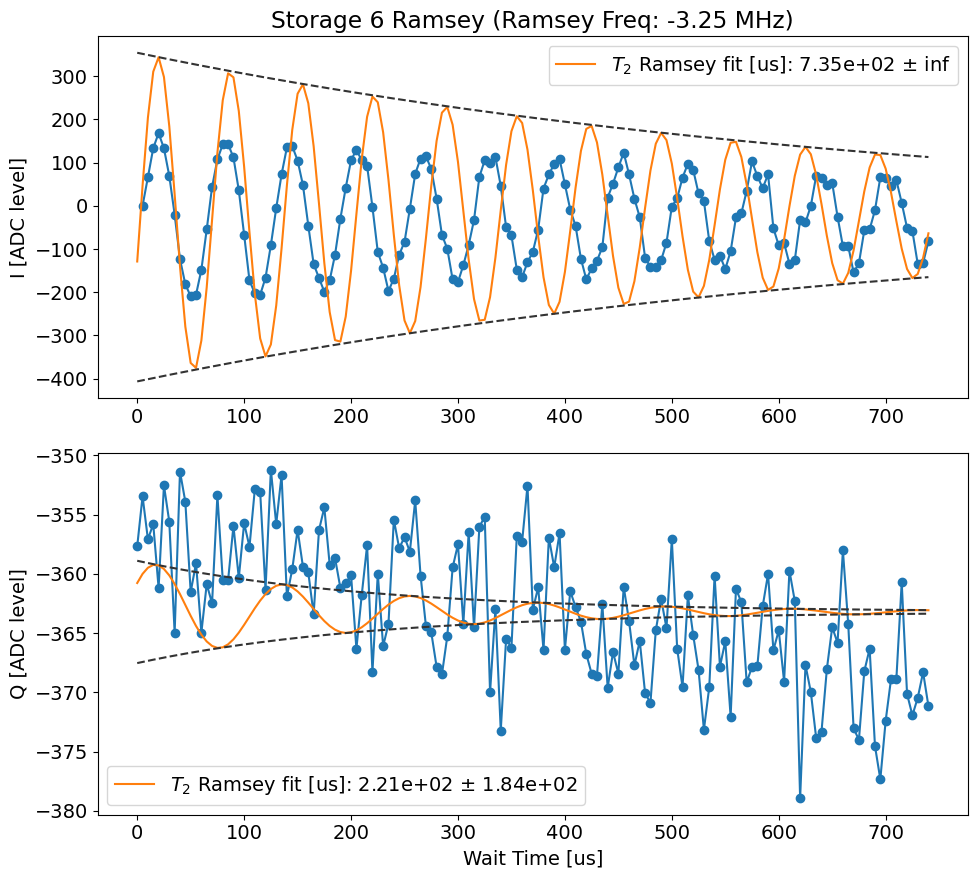

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00066_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.1, which is out of bounds 0.00013605442176870748 to 0.02040816326530612. Instead init to 0.010272108843537414
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.014864864864864866 +/- inf
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.464864864865
 	1974.4351351351352
T2 Ramsey from fit I [us]: 735.0
Fit frequency from Q [MHz]: 0.012062586589001938 +/- 0.0008140254293620859
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.4620625865891
 	1974.437937413411
T2 Ramsey from fit Q [us]: 220.50000000000003


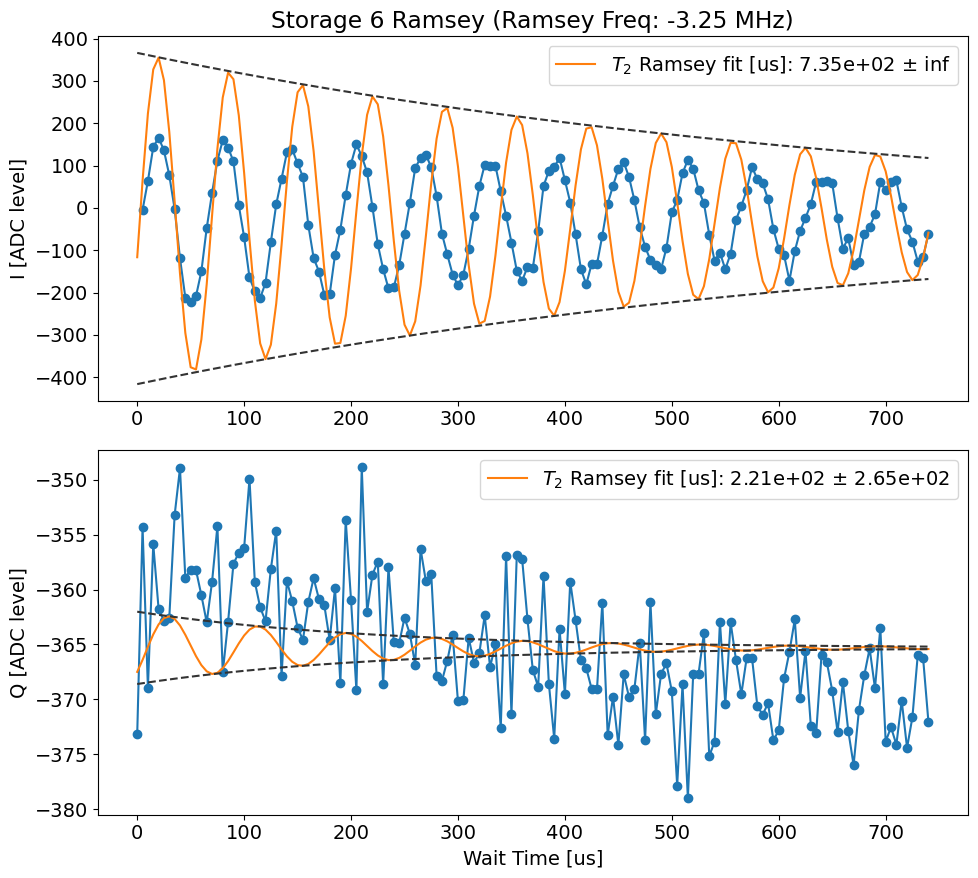

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00102_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.020079831396856387 +/- 1.002978049473053e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.810079831397
 	1974.7699201686032
T2 Ramsey from fit I [us]: 662.2697570230938
Fit frequency from Q [MHz]: 0.020129585729675 +/- 2.8070542783420688e-05
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.8101295857298
 	1974.7698704142704
T2 Ramsey from fit Q [us]: 628.3157143911475


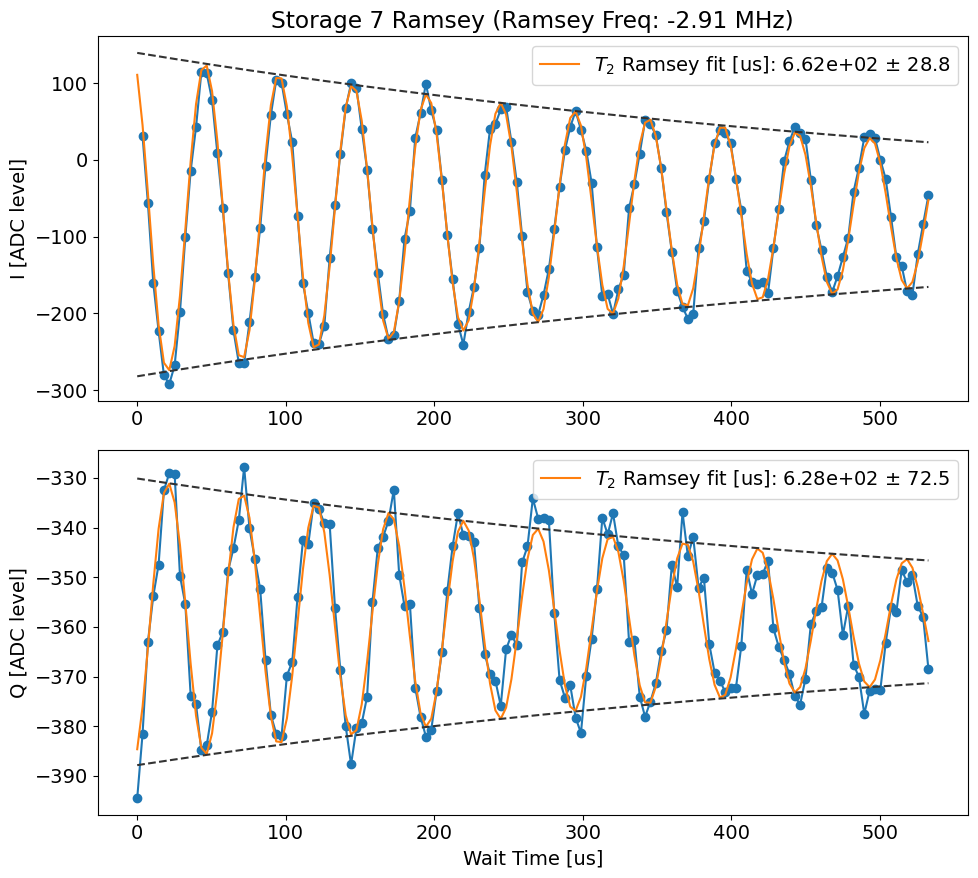

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00070_stor_cavity_ramsey_sweep.h5
No echoes in the data
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.02008361178344349 +/- 1.0297238882670247e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.8100836117835
 	1974.7699163882166
T2 Ramsey from fit I [us]: 691.6979921500949
Fit frequency from Q [MHz]: 0.01710268068040114 +/- 0.0007242663331412097
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.8071026806804
 	1974.7728973193196
T2 Ramsey from fit Q [us]: 215.11436716511253


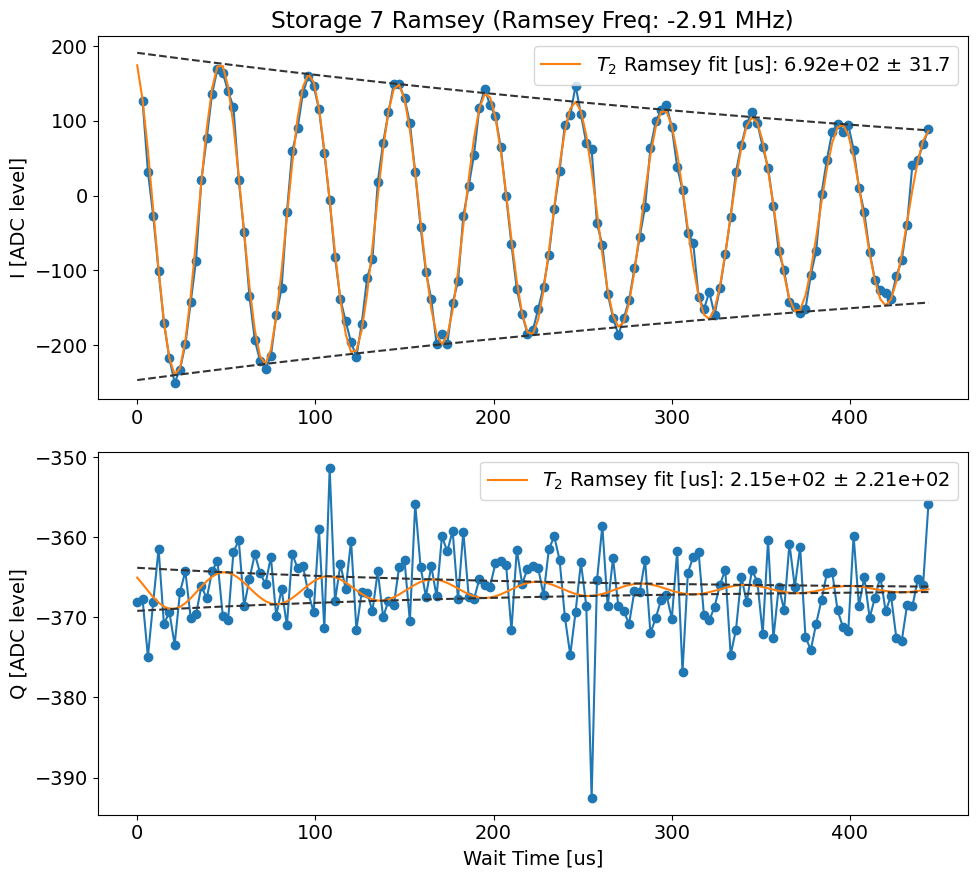

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00071_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.10585585585585586, which is out of bounds 0.00022675736961451248 to 0.034013605442176874. Instead init to 0.017120181405895694
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.02000828344294155 +/- 1.2474232732373649e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.810008283443
 	1974.7699917165571
T2 Ramsey from fit I [us]: 666.709547561615
Fit frequency from Q [MHz]: 0.020455339830471268 +/- 0.002741041464459051
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.8104553398305
 	1974.7695446601697
T2 Ramsey from fit Q [us]: 182.0040741747027


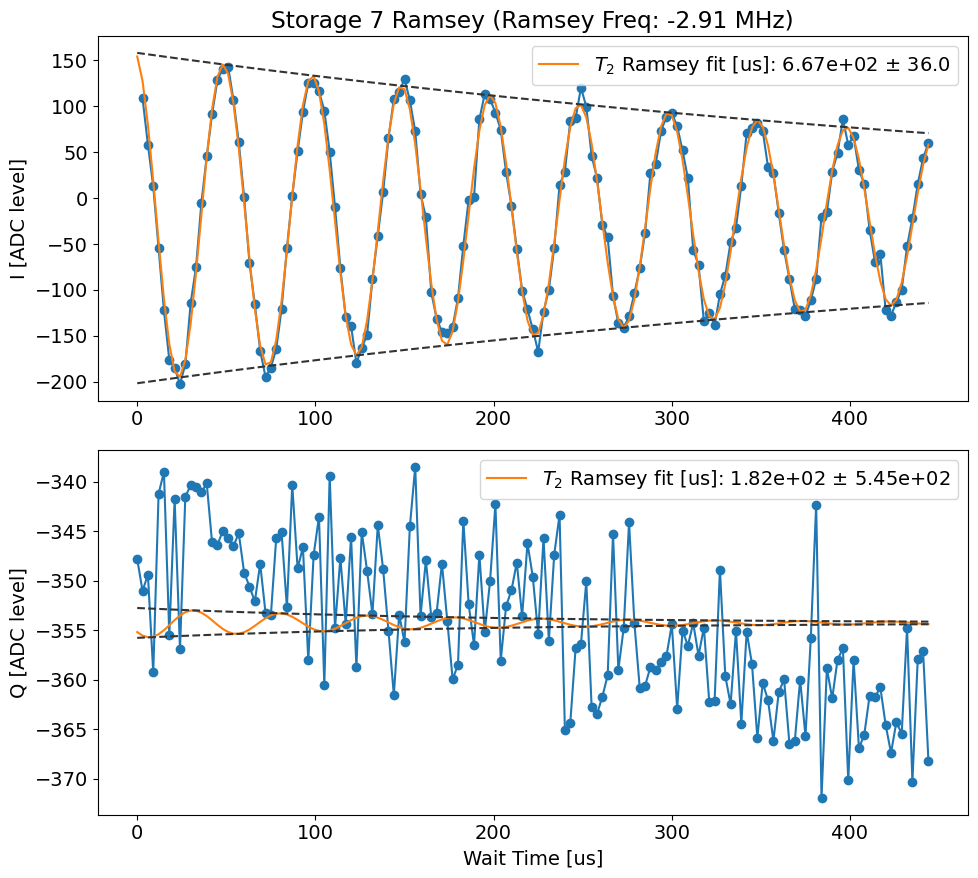

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00072_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.05855855855855856, which is out of bounds 0.00022675736961451248 to 0.034013605442176874. Instead init to 0.017120181405895694
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.02005092400950695 +/- 1.0863893862641163e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.8100509240096
 	1974.7699490759906
T2 Ramsey from fit I [us]: 597.5297373217272
Fit frequency from Q [MHz]: 0.0203052826682272 +/- 0.0006329773042502124
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.8103052826682
 	1974.7696947173317
T2 Ramsey from fit Q [us]: 259.7848677051152


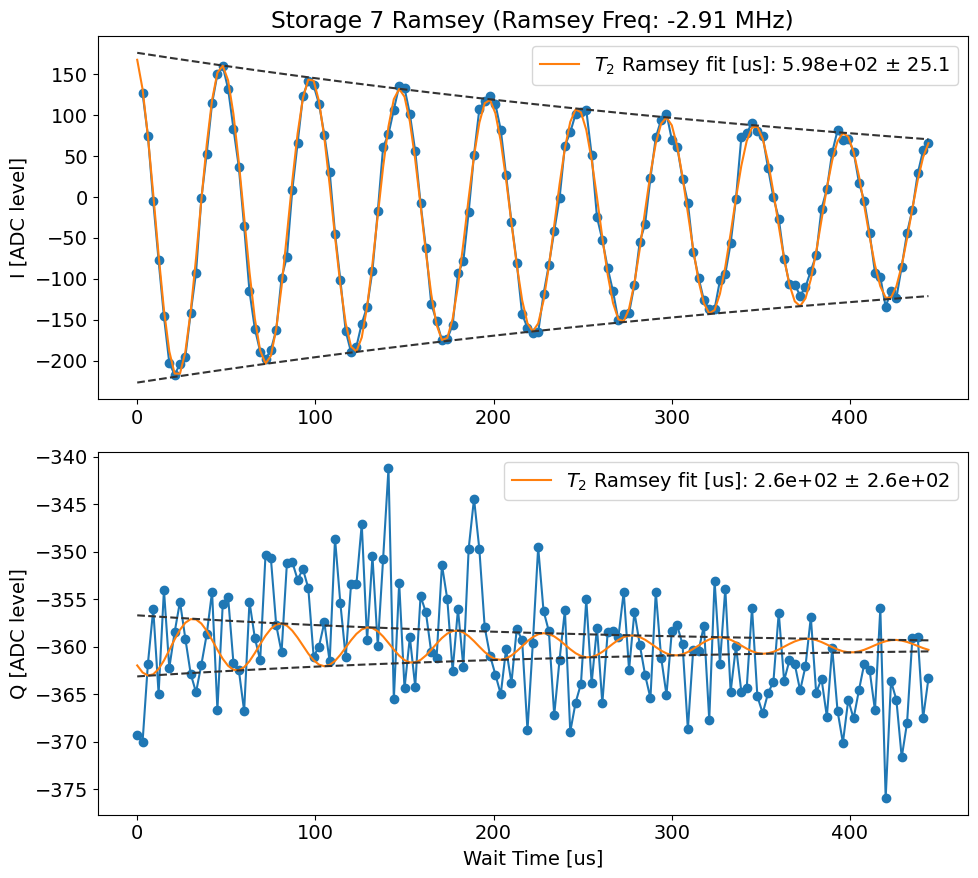

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00073_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.11711711711711711, which is out of bounds 0.00022675736961451248 to 0.034013605442176874. Instead init to 0.017120181405895694
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.02006546014743926 +/- 1.0850482031210421e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.8100654601476
 	1974.7699345398526
T2 Ramsey from fit I [us]: 624.9136575629155
Fit frequency from Q [MHz]: 0.017120181405895694 +/- inf
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.807120181406
 	1974.7728798185942
T2 Ramsey from fit Q [us]: 441.0


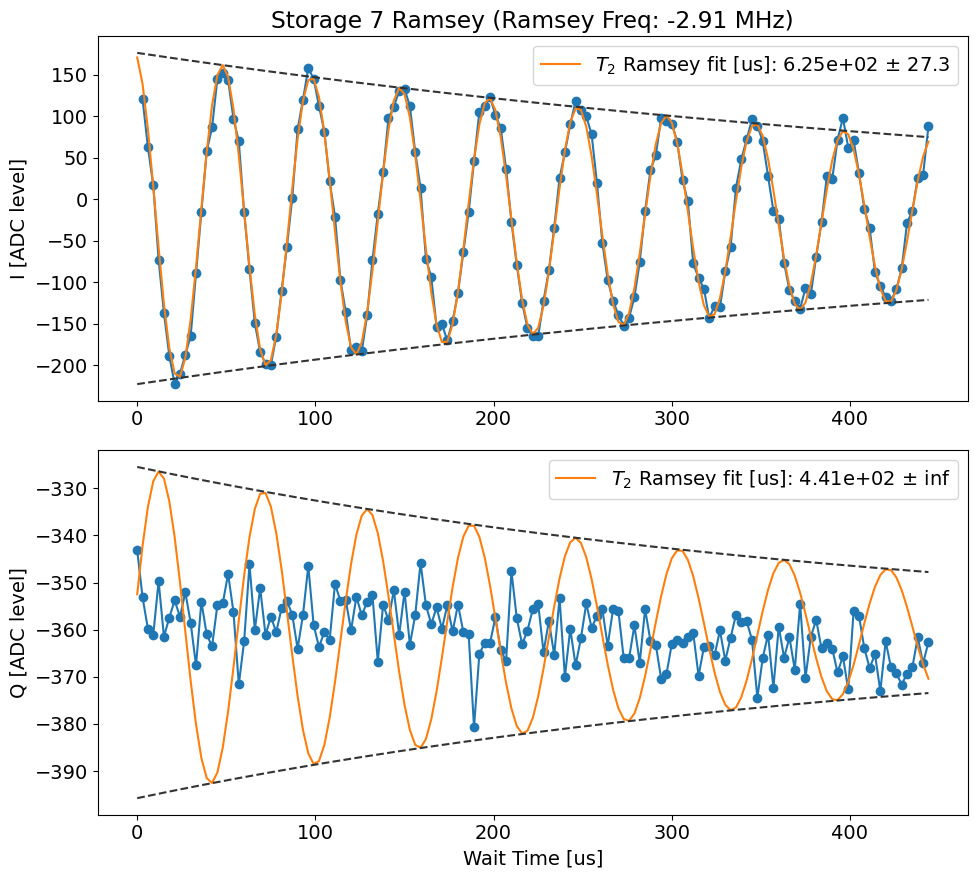

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


00074_stor_cavity_ramsey_sweep.h5
No echoes in the data
Attempted to init fitparam 1 to 0.10810810810810811, which is out of bounds 0.00022675736961451248 to 0.034013605442176874. Instead init to 0.017120181405895694
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.020022842459885535 +/- 1.132233196007783e-05
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.8100228424598
 	1974.76997715754
T2 Ramsey from fit I [us]: 630.2002969063517
Fit frequency from Q [MHz]: 0.017120181405895694 +/- inf
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.807120181406
 	1974.7728798185942
T2 Ramsey from fit Q [us]: 441.0


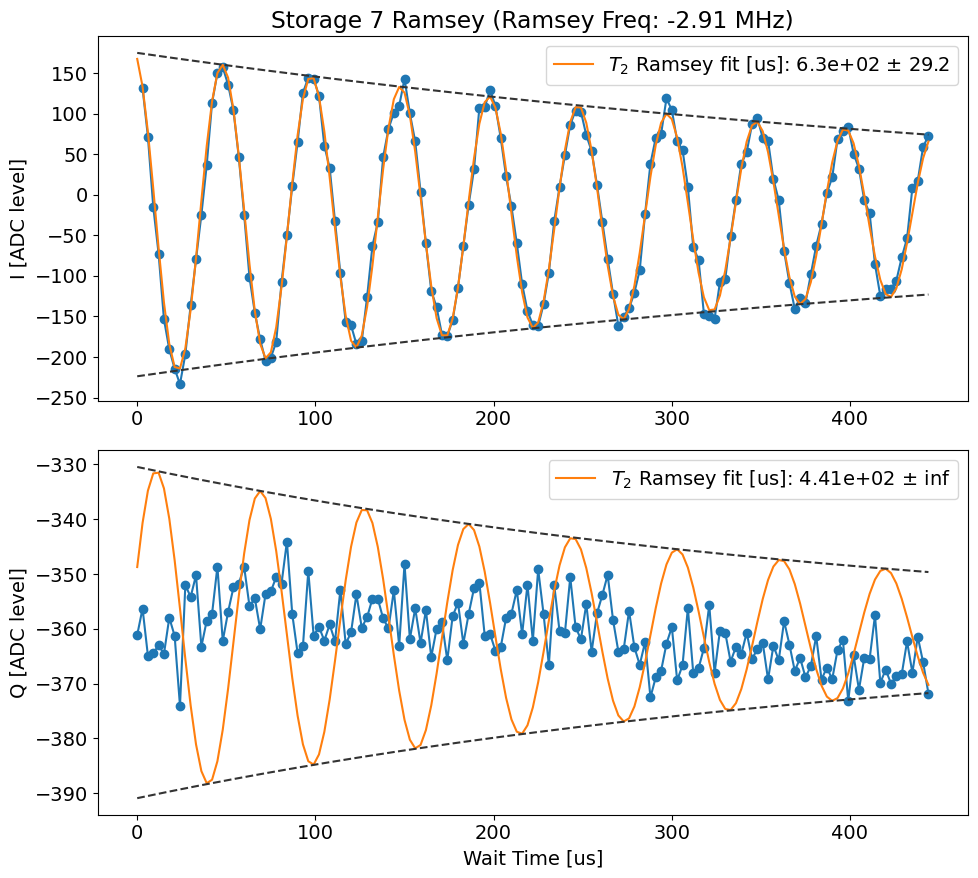

C:\Users\26049\AppData\Local\Temp\ipykernel_6232\3620592628.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)


In [17]:
p_list = []
pCov_list = []
xdata_list = []
idata_list = []

# New DataFrame to store return arguments
df_results = pd.DataFrame(columns=['xdata', 'idata'])
df_MBD['t2'] = np.zeros(len(df_MBD))
df_MBD['t2_err'] = np.zeros(len(df_MBD))

for df_idx in range(len(df_MBD)):

    file_no = df_MBD.loc[df_idx, 'file_no']
    name = df_MBD.loc[df_idx, 'name']
    temp_data, attrs = prev_data(expt_path, f'{file_no:05d}{name}')
    print(f'{file_no:05d}{name}')
    mode_no = df_MBD.loc[df_idx, 'target']

    # Perform Ramsey display analysis
    return_args = Ramsey_display(temp_data, attrs, ramsey_freq=attrs['config']['expt']['ramsey_freq'], 
                                    active_reset=True, threshold=-4.323194812977462, readouts_per_rep=4, 
                                    initial_freq=attrs['config']['expt']['user_defined_pulse'][1], fit=True, 
                                    fitparams=None, title=f'Storage {mode_no} Ramsey', end_idx = -50)
    
    p, pCov, xdata_1, idata1 = return_args
    
    # Append results to lists
    p_list.append(p)
    pCov_list.append(pCov)
    xdata_list.append(xdata_1)
    idata_list.append(idata1)
    
    # Add return arguments to the new DataFrame
    df_results = df_results.append({'xdata': xdata_1.tolist(), 'idata': idata1}, ignore_index=True)
    df_MBD.loc[df_idx, 't2'] = p[3]
    df_MBD.loc[df_idx, 't2_err'] = np.sqrt(pCov[3][3])

# Add the new DataFrame column to df_MBD
df_MBD['p'] = p_list
df_MBD['pCov'] = pCov_list
df_MBD['xdata'] = xdata_list
df_MBD['idata'] = idata_list

In [366]:
df_MBD

,target,state_idx,file_no,name,t2,t2_err,p,pCov,xdata,idata
0,1,0,90,_stor_cavity_ramsey_sweep.h5,278.042230,10.884967,"[324.24014967332226, 0.028097209173008147, -37...","[[1.090380880791255e+16, -95.41451162320111, 3...","[1.8099999999999998, 3.6099999999999994, 5.409...","[-132.15446674537586, -81.4926948051948, -25.3..."
1,1,1,22,_stor_cavity_ramsey_sweep.h5,290.866341,13.154786,"[317.2052536225801, 0.02817283907630359, -43.4...","[[1.1505267032596872e+16, 83.28837376834583, -...","[1.51, 3.01, 4.51, 6.01, 7.51, 9.01, 10.51, 12...","[-134.0004214852085, -86.87475864257942, -30.3..."
2,1,2,23,_stor_cavity_ramsey_sweep.h5,220.500000,inf,"[352.61802854947564, 0.02252252252252253, -53....","[[inf, inf, inf, inf, inf, inf], [inf, inf, in...","[1.51, 3.01, 4.51, 6.01, 7.51, 9.01, 10.51, 12...","[-128.49311135112353, -95.4091829223408, -55.4..."
3,1,3,24,_stor_cavity_ramsey_sweep.h5,285.860033,12.445693,"[298.24575088624164, 0.027798812484074183, -44...","[[1.3434286229293562e+16, -115.52099125490838,...","[1.51, 3.01, 4.51, 6.01, 7.51, 9.01, 10.51, 12...","[-137.93075129738415, -83.48585016593066, -20...."
4,1,4,25,_stor_cavity_ramsey_sweep.h5,220.500000,inf,"[382.4504166493798, 0.02252252252252253, 59.50...","[[inf, inf, inf, inf, inf, inf], [inf, inf, in...","[1.51, 3.01, 4.51, 6.01, 7.51, 9.01, 10.51, 12...","[-142.45235487404165, -111.91995732462264, -26..."
5,1,5,26,_stor_cavity_ramsey_sweep.h5,281.408727,11.610525,"[293.4444761455023, 0.0278841355148579, -48.87...","[[7765623946563382.0, 147.04058367772717, -577...","[1.51, 3.01, 4.51, 6.01, 7.51, 9.01, 10.51, 12...","[-141.12335001064508, -85.12480121918897, -27...."
6,2,0,92,_stor_cavity_ramsey_sweep.h5,435.249214,17.516631,"[337.60037486360045, 0.00927565314436329, 135....","[[1.4971028817742644e+16, -83.81816266329135, ...","[6.01, 12.01, 18.01, 24.01, 30.01, 36.01, 42.0...","[3.4405705856010123, -45.609278879015726, -131..."
7,2,1,30,_stor_cavity_ramsey_sweep.h5,480.860541,14.388364,"[343.7825200812474, 0.009304909061275832, 130....","[[34.76934588738778, 5.337152226497324e-07, -0...","[5.01, 10.01, 15.01, 20.01, 25.01, 30.01, 35.0...","[76.7657297339757, 34.58518767817549, -42.9902..."
8,2,2,31,_stor_cavity_ramsey_sweep.h5,467.648602,21.497076,"[277.36160787490377, 0.009021824812491391, 119...","[[59.801125563663724, -4.420521159595613e-06, ...","[5.01, 10.01, 15.01, 20.01, 25.01, 30.01, 35.0...","[79.25604201524446, 61.97823619469962, -19.346..."
9,2,3,32,_stor_cavity_ramsey_sweep.h5,479.399206,17.607957,"[312.23932319091995, 0.009148966546219906, 128...","[[46.85758254268591, -2.817217076306951e-07, 0...","[5.01, 10.01, 15.01, 20.01, 25.01, 30.01, 35.0...","[96.05281077948422, 43.75738619832307, -27.001..."


In [346]:
# save dataframe
folder = os.path.join(data_parent, 'RAM_paper_results', 'datasets')
file_name = 'ManyBodyDephasing.csv'
file_path = os.path.join(folder, file_name)

# Ensure the directory exists
os.makedirs(folder, exist_ok=True)

# Save the DataFrame to a CSV file
df_MBD.to_csv(file_path)

print(f"DataFrame read from to {file_path}")

DataFrame read from to H:\Shared drives\SLab\Multimode\experiment\240911\RAM_paper_results\datasets\ManyBodyDephasing.csv


## Applying analysis 

In [285]:

mode_no = 1
spectator_cross_kerrs = np.abs(cross_kerrs[mode_no-1])
kappa = np.sum(1/T1s * np.abs(spectator_cross_kerrs/np.sum(spectator_cross_kerrs)))
print('effective spectator T1: ', 1/kappa)

effective spectator T1:  778.7676123782737


In [367]:
df_idx

2

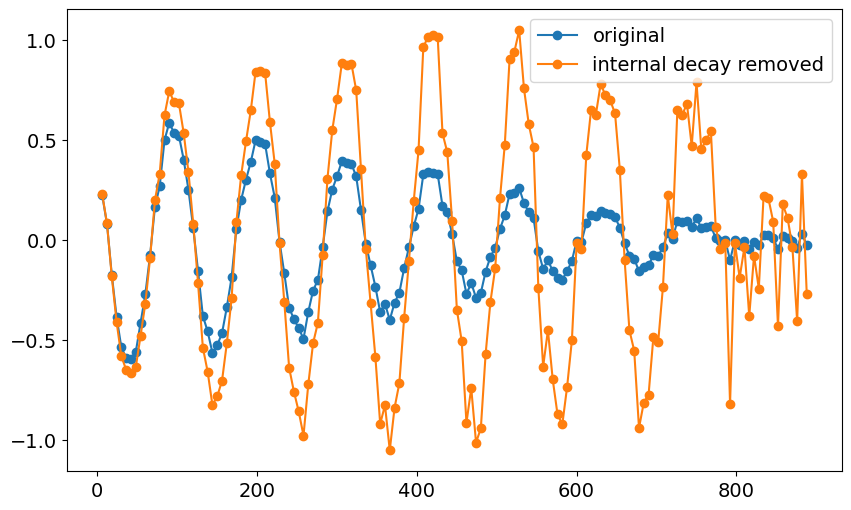

In [433]:
df_idx = 6
file_no = df_MBD.loc[df_idx, 'file_no']
name = df_MBD.loc[df_idx, 'name']
mode_no = df_MBD.loc[df_idx, 'target']
state_idx = df_MBD.loc[df_idx, 'state_idx']

spectator_cross_kerrs = np.abs(cross_kerrs[mode_no-1])
T1s = np.array([358.3, 1254.8, 799.0, 597.4, 355.7, 589.5, 371.2])
kappa = np.sum(1/T1s * np.abs(spectator_cross_kerrs/np.sum(spectator_cross_kerrs)))
effective_spec_T1 = 1/kappa

if state_idx == 0:
    alpha =0
elif state_idx == 1:
    alpha = 1
else:
    alpha = 1/2

xdata_1, idata1 = df_MBD.loc[df_idx, 'xdata'], df_MBD.loc[df_idx, 'idata']
p, pCov = df_MBD.loc[df_idx, 'p'], df_MBD.loc[df_idx, 'pCov']

#  # fitparams=[amp, freq (non-angular), phase (deg), decay time, amp offset, decay time offset]

#get rid of amp offset and amp 
idata1 = (idata1 - p[4])/p[0]
# plt.plot(xdata_1, idata1, '-o', label='original')

# get rid of internal kappa decay 

## find df_idx in the t2_and_echo dataframe with target being mode_no and type being T2
t2_df_idx = df_t2_and_echo[(df_t2_and_echo['target'] == mode_no) & (df_t2_and_echo['type'] == 'T2')].index[0]
t2 = df_t2_and_echo.loc[t2_df_idx, 't2']

factor = np.exp(xdata_1/t2)
idata1_ = np.array(idata1) * factor



# get rid of oscillations
# idata2_= idata1_/np.sin(p[1]*xdata_1 *2*np.pi +p[2]*np.pi/180)
# # remove outliers (things larger than 1)
# idata2_[idata2_>1] = 1
# idata2_[idata2_<-1] = -1

plt.plot(xdata_1, idata1, '-o', label='original')
plt.plot(xdata_1, idata1_, '-o', label='internal decay removed')
# plt.plot(xdata_1, idata2_, '-o', label='oscillations removed')
plt.legend()
p_ramsey = p.copy()


In [436]:
alpha

0

In [373]:

file_no = df_MBD.loc[df_idx, 'file_no']
name = df_MBD.loc[df_idx, 'name']
temp_data, attrs = prev_data(expt_path, f'{file_no:05d}{name}')
print(f'{file_no:05d}{name}')
attrs['config']['expt']

00033_stor_cavity_ramsey_sweep.h5


{'start': 0.01,
 'step': 5.0,
 'expts': 201,
 'ramsey_freq': -2.93,
 'reps': 500,
 'rounds': 1,
 'qubits': [0],
 'checkEF': False,
 'f0g1_cavity': 0,
 'init_gf': False,
 'active_reset': True,
 'man_reset': True,
 'storage_reset': True,
 'user_defined_pulse': [False, 1977.7, 15000, 0.005, 0.550453, 0],
 'parity_meas': False,
 'man_idx': 1,
 'storage_ramsey': [True, 2, True],
 'coupler_ramsey': False,
 'custom_coupler_pulse': [[1435],
  [2000],
  [0.17234146839057687],
  [0],
  [3],
  ['flat_top'],
  [0.005]],
 'echoes': [False, 0],
 'prepulse': True,
 'postpulse': True,
 'pre_sweep_pulse': [[3568.1515953227604,
   3425.5564066067,
   2007.0,
   349.415,
   3568.1515953227604,
   3425.5564066067,
   2007.0,
   696.665,
   3568.1515953227604,
   3425.5564066067,
   2007.0,
   875.845,
   3568.1515953227604,
   3425.5564066067,
   2007.0,
   1053.395,
   3568.1515953227604,
   3425.5564066067,
   2007.0,
   1245.16,
   3568.1515953227604,
   3425.5564066067,
   2007.0,
   1423.04,
   3568.

In [380]:
print(attrs['config']['expt']['post_sweep_pulse'])

[[2007.0, 3425.5564066067, 3568.1515953227604], [15000, 8236, 5510], [0.6056817916987671, 0, 0], [0, 0, 0], [0, 2, 2], ['flat_top', 'g', 'g'], [0.005, 0.035, 0.035]]


In [355]:
alpha

0.5

In [291]:
alpha

0.5

### Fitting only kappam


$f(t) = e^{-\kappa_{int} t} e^{\alpha e^{-\kappa_{s} t} \kappa_m t}$ cos($\omega t$)

where 
- $\kappa_{int}$ is the intrinsic dephasing rate (T2)
- $\kappa_{s}$ is the T1 decay (average) of spectator storage modes
- $\kappa_m$ is the effective many body dephasing rate
- $\omega$ is the ramsey frequency
- $\alpha$ is the amount of photon prepared per storage mode

In [265]:
effective_spec_T1

1151.791633849051

In [302]:
mode_no

2

In [335]:
T1s = [358.3, 1254.8, 799.0, 597.4, 355.7, 589.5, 371.2]
T1s_eff = []
for idx, T1 in enumerate(T1s):
    if idx == mode_no-1:
        pass
    else:
        T1s_eff.append(T1)
T1s_eff = np.array(T1s_eff)
T1s_eff

array([358.3, 799. , 597.4, 355.7, 589.5, 371.2])

In [343]:

def many_body_dephasing_func(x, *p, args = [0.9, 0, alpha,np.mean(T1s_eff), p_ramsey[1], p_ramsey[2]]):
    '''f(t) = yscale * sin(2*pi*freq*t + phase) * exp(-alpha * exp(-t/decay_T1) * t/decay_mbd)'''
    decay_mbd = p
    yscale, x0, alpha, decay_T1, freq, phase_deg = args
    return yscale * (np.sin(2 * np.pi * freq * x + phase_deg * np.pi / 180) 
                     * np.exp(-1* alpha* np.exp(-1* (x - x0) / decay_T1) * (x - x0) / decay_mbd))

def fit_many_body_dephasing(xdata, ydata, fitparams=None, bounds=(-np.inf, np.inf)):
    if fitparams is None:
        fitparams = [np.max(ydata), 1000, 1000, 0.1, 0, 0]

    try:
        # print(fitparams)
        # print(xdata.shape, ydata.shape)
        # print(bounds)
        avg_deviation = 1
        while avg_deviation > 0.2:
            pOpt, pCov = sp.optimize.curve_fit(many_body_dephasing_func, xdata, ydata, p0=fitparams, bounds=bounds, maxfev=10000)

            avg_deviation = np.mean(np.abs(ydata - many_body_dephasing_func(xdata, *pOpt)))
            # randomly perturb the initial guess with positive or negative
            fitparams = pOpt 
            print(avg_deviation)
            print(fitparams)
    except RuntimeError:
        print('Error - curve_fit failed')
        pOpt = fitparams
        pCov = np.zeros((len(fitparams), len(fitparams)))
    return pOpt, pCov

# Example usage
T2s = df_t2_and_echo[(df_t2_and_echo['type'] == 'T2')]['t2'].values

# Define bounds for the parameters
lower_bounds = [10]
upper_bounds = [ 5000]

# Fit the data with bounds
p_, pCov_ = fit_many_body_dephasing(xdata_1, idata1_, fitparams=[ 2000], bounds=(lower_bounds, upper_bounds))

0.12177145059538853
[1448.32612342]


decay_mbd:  1448.3261234233253 ± 126142548.40508004


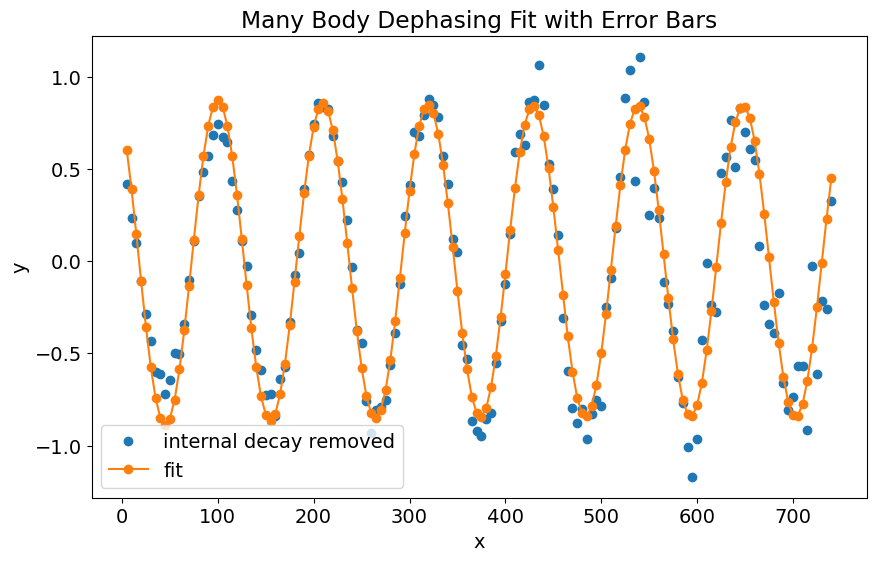

In [344]:
# Assuming pCov is the covariance matrix returned by curve_fit
# Extract the standard deviations (errors) of the parameters
p_errors = np.sqrt(np.diag(pCov))

# Plot the data with error bars
plt.plot(xdata_1, idata1_, 'o', label='internal decay removed')

# Plot the fit with error bars
plt.plot(xdata_1, many_body_dephasing_func(xdata_1, *p_), '-o', label='fit')

# Print all the parameters with their errors
# yscale, decay_T1, decay_mbd, freq, phase_deg, x0
# print('yscale: ', p_[0], '±', p_errors[0])
print('decay_mbd: ', p_[0], '±', p_errors[0])
# print('freq: ', p_[3], '±', p_errors[3])
# print('phase_deg: ', p_[4], '±', p_errors[4])
# print('x0: ', p_[2], '±', p_errors[2])

plt.legend()
plt.xlabel('x')
plt.ylabel('y')
plt.title('Many Body Dephasing Fit with Error Bars')
plt.show()

### With yscale

In [327]:


def many_body_dephasing_func(x, *p, args = [0, alpha,np.mean(T1s_eff), p_ramsey[1], p_ramsey[2]]):
    '''f(t) = yscale * sin(2*pi*freq*t + phase) * exp(-alpha * exp(-t/decay_T1) * t/decay_mbd)'''
    yscale, decay_mbd= p
    x0, alpha, decay_T1, freq, phase_deg = args
    return yscale * (np.sin(2 * np.pi * freq * x + phase_deg * np.pi / 180) 
                     * np.exp(-1* alpha* np.exp(-1* (x - x0) / decay_T1) * (x - x0) / decay_mbd))

def fit_many_body_dephasing(xdata, ydata, fitparams=None, bounds=(-np.inf, np.inf)):
    if fitparams is None:
        fitparams = [np.max(ydata), 1000, 1000, 0.1, 0, 0]

    try:
        # print(fitparams)
        # print(xdata.shape, ydata.shape)
        # print(bounds)
        avg_deviation = 1
        while avg_deviation > 0.2:
            pOpt, pCov = sp.optimize.curve_fit(many_body_dephasing_func, xdata, ydata, p0=fitparams, bounds=bounds, maxfev=10000)

            avg_deviation = np.mean(np.abs(ydata - many_body_dephasing_func(xdata, *pOpt)))
            # randomly perturb the initial guess with positive or negative
            fitparams = pOpt 
            print(avg_deviation)
            print(fitparams)
    except RuntimeError:
        print('Error - curve_fit failed')
        pOpt = fitparams
        pCov = np.zeros((len(fitparams), len(fitparams)))
    return pOpt, pCov

# Example usage
T2s = df_t2_and_echo[(df_t2_and_echo['type'] == 'T2')]['t2'].values

# Define bounds for the parameters
lower_bounds = [0.3,10 ]
upper_bounds = [2,  50000000]

# Fit the data with bounds
p_, pCov_ = fit_many_body_dephasing(xdata_1, idata1_, fitparams=[1, 100], bounds=(lower_bounds, upper_bounds))

0.1182457769396848
[8.30421511e-01 5.00000000e+07]


yscale:  0.8304215112847372 ± 126142548.40508004
decay_mbd:  49999999.99999492 ± 1.1637626025694463e-05


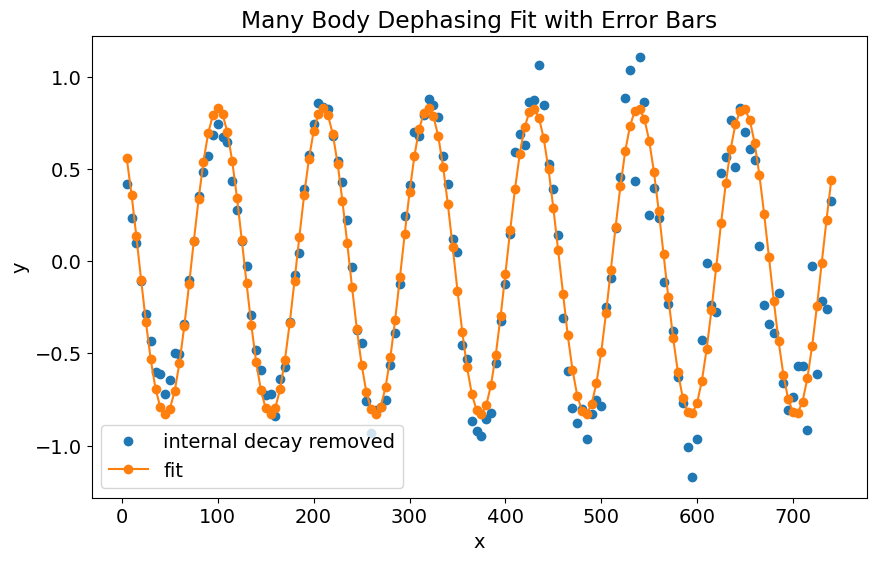

In [328]:
# Assuming pCov is the covariance matrix returned by curve_fit
# Extract the standard deviations (errors) of the parameters
p_errors = np.sqrt(np.diag(pCov))

# Plot the data with error bars
plt.plot(xdata_1, idata1_, 'o', label='internal decay removed')

# Plot the fit with error bars
plt.plot(xdata_1, many_body_dephasing_func(xdata_1, *p_), '-o', label='fit')

# Print all the parameters with their errors
# yscale, decay_T1, decay_mbd, freq, phase_deg, x0
print('yscale: ', p_[0], '±', p_errors[0])
print('decay_mbd: ', p_[1], '±', p_errors[1])
# print('freq: ', p_[3], '±', p_errors[3])
# print('phase_deg: ', p_[4], '±', p_errors[4])
# print('x0: ', p_[2], '±', p_errors[2])

plt.legend()
plt.xlabel('x')
plt.ylabel('y')
plt.title('Many Body Dephasing Fit with Error Bars')
plt.show()

### With x0 

In [331]:


def many_body_dephasing_func(x, *p, args = [alpha,np.mean(T1s_eff), p_ramsey[1], p_ramsey[2]]):
    '''f(t) = yscale * sin(2*pi*freq*t + phase) * exp(-alpha * exp(-t/decay_T1) * t/decay_mbd)'''
    yscale, decay_mbd, x0 = p
    alpha, decay_T1, freq, phase_deg = args
    return yscale * (np.sin(2 * np.pi * freq * x + phase_deg * np.pi / 180) 
                     * np.exp(-1* alpha* np.exp(-1* (x - x0) / decay_T1) * (x - x0) / decay_mbd))

def fit_many_body_dephasing(xdata, ydata, fitparams=None, bounds=(-np.inf, np.inf)):
    if fitparams is None:
        fitparams = [np.max(ydata), 1000, 1000, 0.1, 0, 0]

    try:
        # print(fitparams)
        # print(xdata.shape, ydata.shape)
        # print(bounds)
        avg_deviation = 1
        while avg_deviation > 0.2:
            pOpt, pCov = sp.optimize.curve_fit(many_body_dephasing_func, xdata, ydata, p0=fitparams, bounds=bounds, maxfev=10000)

            avg_deviation = np.mean(np.abs(ydata - many_body_dephasing_func(xdata, *pOpt)))
            # randomly perturb the initial guess with positive or negative
            fitparams = pOpt 
            print(avg_deviation)
            print(fitparams)
    except RuntimeError:
        print('Error - curve_fit failed')
        pOpt = fitparams
        pCov = np.zeros((len(fitparams), len(fitparams)))
    return pOpt, pCov

# Example usage
T2s = df_t2_and_echo[(df_t2_and_echo['type'] == 'T2')]['t2'].values

# Define bounds for the parameters
lower_bounds = [0.3,10 ,  -5000]
upper_bounds = [2,  5000, 5000]

# Fit the data with bounds
p_, pCov_ = fit_many_body_dephasing(xdata_1, idata1_, fitparams=[1, 1000,  0], bounds=(lower_bounds, upper_bounds))

0.11362958610413437
[ 9.19921971e-01  1.00000024e+01 -3.52023386e+03]


In [299]:
effective_spec_T1

455.79634359556235

yscale:  0.9199219708205986 ± 126142548.40508004
decay_mbd:  10.000002424734097 ± 1.1637626025694463e-05
x0:  -3520.233860286097 ± 1.1130112035254542


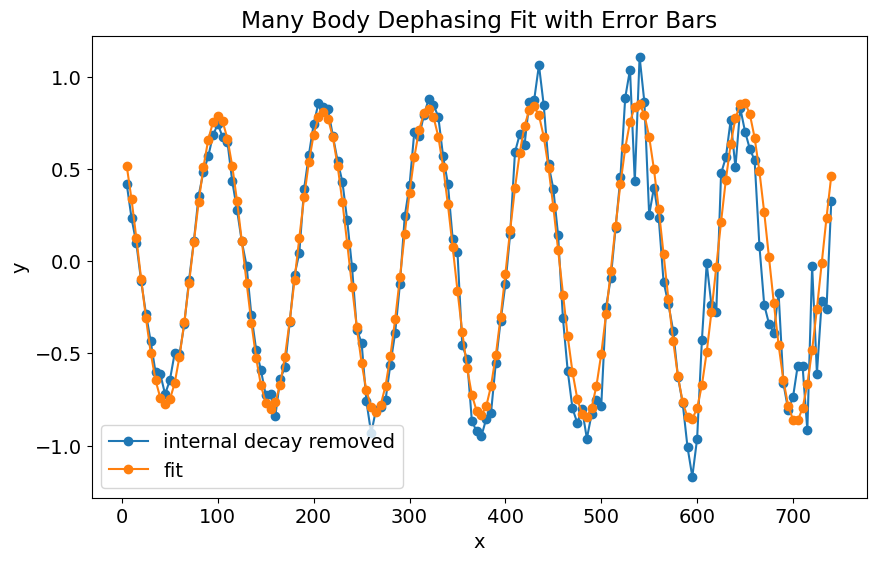

In [333]:
# Assuming pCov is the covariance matrix returned by curve_fit
# Extract the standard deviations (errors) of the parameters
p_errors = np.sqrt(np.diag(pCov))

# Plot the data with error bars
plt.plot(xdata_1, idata1_, '-o', label='internal decay removed')

# Plot the fit with error bars
plt.plot(xdata_1, many_body_dephasing_func(xdata_1, *p_), '-o', label='fit')

# Print all the parameters with their errors
# yscale, decay_T1, decay_mbd, freq, phase_deg, x0
print('yscale: ', p_[0], '±', p_errors[0])
print('decay_mbd: ', p_[1], '±', p_errors[1])
# print('freq: ', p_[3], '±', p_errors[3])
# print('phase_deg: ', p_[4], '±', p_errors[4])
print('x0: ', p_[2], '±', p_errors[2])

plt.legend()
plt.xlabel('x')
plt.ylabel('y')
plt.title('Many Body Dephasing Fit with Error Bars')
plt.show()

### Fitting both kappa_m and kappa_s

In [227]:
def many_body_dephasing_func(x, *p, args = [alpha, p_ramsey[1], p_ramsey[2]]):
    yscale, decay_T1, decay_mbd, x0 = p
    alpha , freq, phase_deg = args
    return yscale * (np.sin(2 * np.pi * freq * x + phase_deg * np.pi / 180) 
                     * np.exp(-alpha* np.exp(-1* (x - x0) / decay_T1) * (x - x0) / decay_mbd))

def fit_many_body_dephasing(xdata, ydata, fitparams=None, bounds=(-np.inf, np.inf)):
    if fitparams is None:
        fitparams = [np.max(ydata), 1000, 1000, 0.1, 0, 0]

    try:
        # print(fitparams)
        # print(xdata.shape, ydata.shape)
        # print(bounds)
        avg_deviation = 1
        while avg_deviation > 0.2:
            pOpt, pCov = sp.optimize.curve_fit(many_body_dephasing_func, xdata, ydata, p0=fitparams, bounds=bounds, maxfev=10000)

            avg_deviation = np.mean(np.abs(ydata - many_body_dephasing_func(xdata, *pOpt)))
            # randomly perturb the initial guess with positive or negative
            fitparams = pOpt 
            print(avg_deviation)
            print(fitparams)
    except RuntimeError:
        print('Error - curve_fit failed')
        pOpt = fitparams
        pCov = np.zeros((len(fitparams), len(fitparams)))
    return pOpt, pCov

# Example usage
T1s = [358.3, 1254.8, 799.0, 597.4, 355.7, 589.5, 371.2]
T2s = df_t2_and_echo[(df_t2_and_echo['type'] == 'T2')]['t2'].values

# Define bounds for the parameters
lower_bounds = [0.3, 10,10 ,  -300]
upper_bounds = [8, max(T1s), max(T2s), 300]

# Fit the data with bounds
p_, pCov_ = fit_many_body_dephasing(xdata_1, idata1_, fitparams=[1, 200, 1000,  -30], bounds=(lower_bounds, upper_bounds))

0.12753867983535108
[  0.88674623  32.7627651   14.93970767 -27.55935824]


yscale:  0.8867462291306181 ± 7.733118747547055
decay_T1:  32.76276510312704 ± 1.4812668116636866e-05
decay_mbd:  14.939707666918679 ± 1.3987311323249314
x0:  -27.55935824236356 ± 21.497075772041903


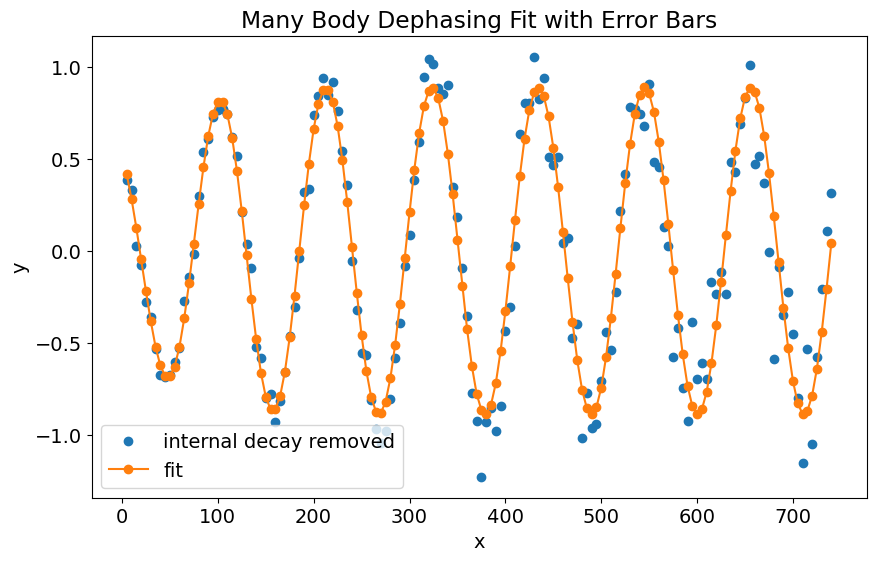

In [228]:
# Assuming pCov is the covariance matrix returned by curve_fit
# Extract the standard deviations (errors) of the parameters
p_errors = np.sqrt(np.diag(pCov))

# Plot the data with error bars
plt.plot(xdata_1, idata1_, 'o', label='internal decay removed')

# Plot the fit with error bars
plt.plot(xdata_1, many_body_dephasing_func(xdata_1, *p_), '-o', label='fit')

# Print all the parameters with their errors
# yscale, decay_T1, decay_mbd, freq, phase_deg, x0
print('yscale: ', p_[0], '±', p_errors[0])
print('decay_T1: ', p_[1], '±', p_errors[1])
print('decay_mbd: ', p_[2], '±', p_errors[2])
# print('freq: ', p_[3], '±', p_errors[3])
# print('phase_deg: ', p_[4], '±', p_errors[4])
print('x0: ', p_[3], '±', p_errors[3])

plt.legend()
plt.xlabel('x')
plt.ylabel('y')
plt.title('Many Body Dephasing Fit with Error Bars')
plt.show()

### Old analysis

In [115]:
def many_body_dephasing_func(x, *p):
    yscale, decay_T1, decay_mbd, freq, phase_deg, x0 = p
    return yscale * (np.sin(2 * np.pi * freq * x + phase_deg * np.pi / 180) 
                     * np.exp(-1* np.exp(-1* (x - x0) / decay_T1) * (x - x0) / decay_mbd))

def fit_many_body_dephasing(xdata, ydata, fitparams=None, bounds=(-np.inf, np.inf)):
    if fitparams is None:
        fitparams = [np.max(ydata), 1000, 1000, 0.1, 0, 0]

    try:
        # print(fitparams)
        # print(xdata.shape, ydata.shape)
        # print(bounds)
        avg_deviation = 1
        while avg_deviation > 0.1:
            pOpt, pCov = sp.optimize.curve_fit(many_body_dephasing_func, xdata, ydata, p0=fitparams, bounds=bounds)

            avg_deviation = np.mean(np.abs(ydata - many_body_dephasing_func(xdata, *pOpt)))
            # randomly perturb the initial guess with positive or negative
            fitparams = pOpt + avg_deviation*pOpt*np.random.uniform(-0.5, 0.5)
            print(avg_deviation)
            print(fitparams)
    except RuntimeError:
        print('Error - curve_fit failed')
        pOpt = fitparams
        pCov = np.zeros((len(fitparams), len(fitparams)))
    return pOpt, pCov

# Example usage
T1s = [358.3, 1254.8, 799.0, 597.4, 355.7, 589.5, 371.2]
T2s = df_t2_and_echo[(df_t2_and_echo['type'] == 'T2')]['t2'].values

# Define bounds for the parameters
lower_bounds = [0.3, 50,50 , 0.002, -180, -300]
upper_bounds = [2, max(T1s), max(T2s), 0.04, 180, 300]

# Fit the data with bounds
p, pCov = fit_many_body_dephasing(xdata_1, idata1_, fitparams=[0.9, 100, 100, 0.009, 90, -30], bounds=(lower_bounds, upper_bounds))

0.10511700433043765
[ 8.34652573e-01  5.09707841e+01  6.11179013e+01  8.80225946e-03
  1.14380347e+02 -3.67460806e+01]
0.10511700590881946
[ 9.06728147e-01  5.53784492e+01  6.64005523e+01  9.56236146e-03
  1.24257376e+02 -3.99405594e+01]
0.10511709586435587
[ 8.48459440e-01  5.18220165e+01  6.21414515e+01  8.94785456e-03
  1.16272308e+02 -3.73719066e+01]
0.10511645019355133
[ 8.41859331e-01  5.14119828e+01  6.16277436e+01  8.87824036e-03
  1.15367531e+02 -3.70907689e+01]
0.10511683896003843
[ 8.58295159e-01  5.24135029e+01  6.28424388e+01  9.05158994e-03
  1.17620231e+02 -3.77905851e+01]
0.10511695943059551
[ 8.32425694e-01  5.08408736e+01  6.09566485e+01  8.77876665e-03
  1.14074974e+02 -3.66738956e+01]
0.10511656941646427
[ 8.83715798e-01  5.39672517e+01  6.46966703e+01  9.31965988e-03
  1.21103573e+02 -3.89230929e+01]
0.1051170351539289
[ 8.64496302e-01  5.27954998e+01  6.33043916e+01  9.11699355e-03
  1.18470104e+02 -3.80699683e+01]
0.1051171102715698
[ 8.75703727e-01  5.34819192e+

KeyboardInterrupt: 

In [112]:
np.random.uniform(-0.05, 0.05)
#

0.032647858076105804

In [107]:
# check whether p is within bounds
print(p)
print(lower_bounds)
print(upper_bounds)
for i in range(len(p)):
    if p[i] < lower_bounds[i] or p[i] > upper_bounds[i]:
        print('not within bounds')  
        

[0.9, 100, 100, 0.009, 90, -30]
[0.3, 177.85, 50, 0.002, -180, -300]
[2, 1254.8, 1071.0700788320455, 0.04, 180, 300]
not within bounds


yscale:  0.30000000000128557
decay_T1:  330.4367476703105
decay_mbd:  50.000000002257046
freq:  0.024919442662766102
phase_deg:  3.2599886008326915
x0:  -8.760198665741216


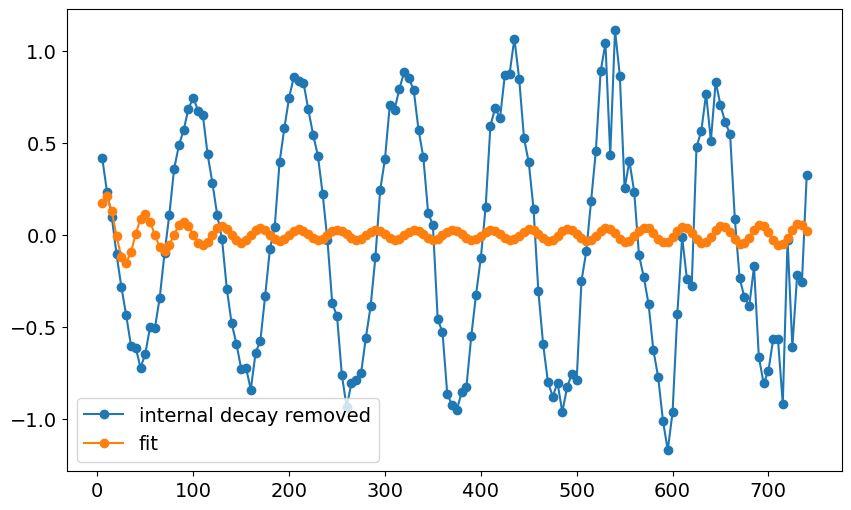

In [72]:
plt.plot(xdata_1, idata1_, '-o', label='internal decay removed')
plt.plot(xdata_1, many_body_dephasing_func(xdata_1, *p), '-o', label='fit')
# print all the parameters
# yscale, decay_T1, decay_mbd, freq, phase_deg, x0
print('yscale: ', p[0])
print('decay_T1: ', p[1])
print('decay_mbd: ', p[2])
print('freq: ', p[3])
print('phase_deg: ', p[4])
print('x0: ', p[5])
plt.legend()


In [104]:
p

[0.9, 100, 100, 0.009, 90, -30]

In [57]:
p

array([ 3.13767059e+02,  9.12452799e-03,  1.21301781e+02,  4.78398801e+02,
       -2.72890935e+01, -1.70560938e+02])

### Manual FItting

Text(0.5, 0.98, 'T_mbd=500 mus')

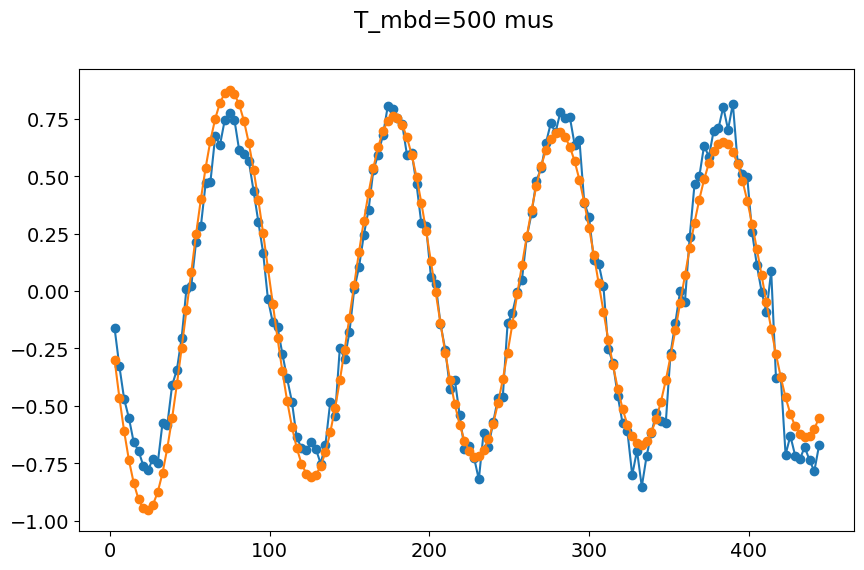

In [316]:
def many_body_dephasing_func(x, *p):
    '''
    $f(t) = e^{-\kappa_{int} t} e^{e^{-\kappa_{s} t} \kappa_m t}$ cos($\omega t$)
    without kappa_int decay
    '''
    yscale, decay_T1, decay_mbd, freq, phase_deg, x0 = p
    return yscale * (np.sin(2 * np.pi * freq * x + phase_deg * np.pi / 180) 
                     * np.exp(-1* np.exp(-1* (x - x0) / decay_T1) * (x - x0) / decay_mbd))

# manual fitting
yscale = 1#p_[0]#0.8278143110603906
decay_T1 = np.mean(T1s_eff)
decay_mbd = 500
freq = p_ramsey[1]
phase_deg = p_ramsey[2]
x0 = 0#p_[3]

p_ = [yscale, decay_T1, decay_mbd, freq, phase_deg, x0]
plt.plot(xdata_1, idata1_, '-o', label='internal decay removed')
plt.plot(xdata_1, many_body_dephasing_func(xdata_1, *p_), '-o', label='fit')
plt.suptitle('T_mbd=' + str(decay_mbd) + ' mus')


## reeating the experiment but with smaller domain (time range)

No echoes in the data
Attempted to init fitparam 4 to -52.3769361300025, which is out of bounds -402.65909090909093 to -325.543093270366. Instead init to -364.10109208972847
Attempted to init fitparam 4 to -364.10109208972847, which is out of bounds 368.5343882479175 to 459.75810853628633. Instead init to 414.14624839210194
Current pi pulse frequency: 1977.7
Fit frequency from I [MHz]: 0.03255919698408584 +/- 0.008872435294071543
Suggested new pi pulse frequency from fit I [MHz]:
 	1974.732559196984
 	1974.667440803016
T2 Ramsey from fit I [us]: 118.87153669253003
Fit frequency from Q [MHz]: 0.029403845924749518 +/- 0.000988796482608455
Suggested new pi pulse frequencies from fit Q [MHz]:
 	1974.7294038459247
 	1974.6705961540754
T2 Ramsey from fit Q [us]: 118.80000000000001


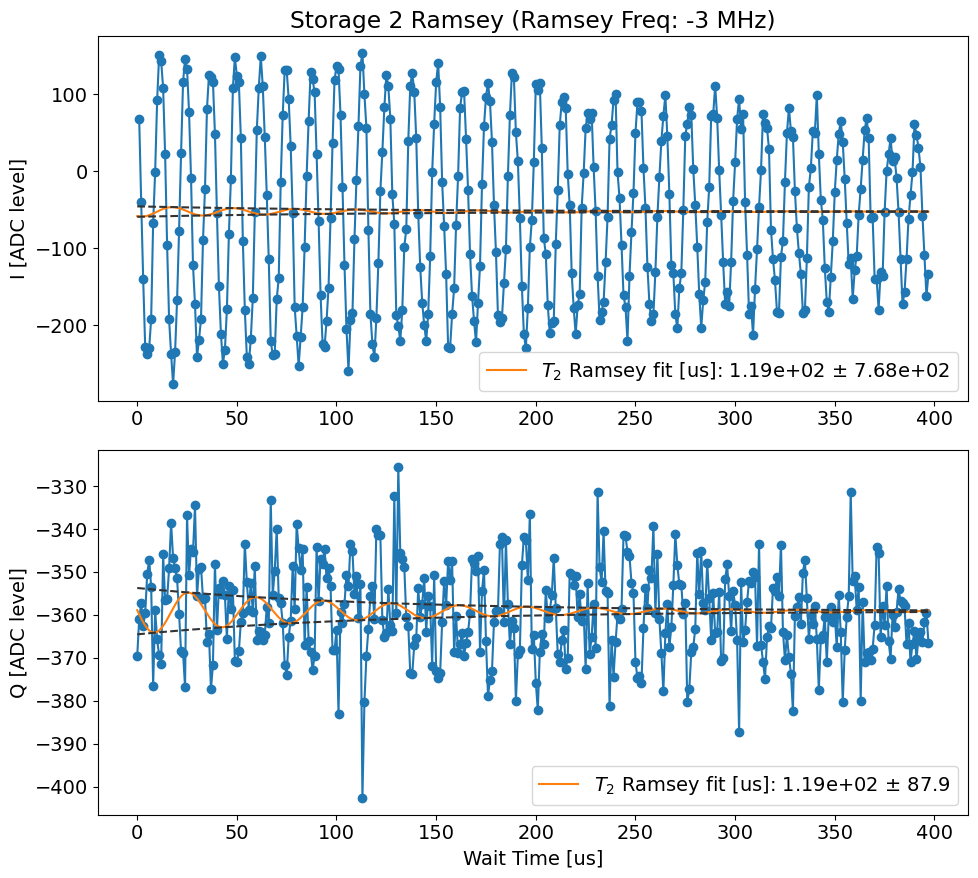

In [428]:
temp_data, attrs = prev_data(expt_path, '00231_CavityRamseyExperiment.h5')
return_args = Ramsey_display(temp_data, attrs, ramsey_freq=attrs['config']['expt']['ramsey_freq'], 
                                    active_reset=True, threshold=attrs['config']['device']['readout']['threshold'][0], readouts_per_rep=4, 
                                    initial_freq=attrs['config']['expt']['user_defined_pulse'][1], fit=True, 
                                    fitparams=[300, 0.03, None, None, None, None],
                                      title=f'Storage {mode_no} Ramsey', end_idx = -1)


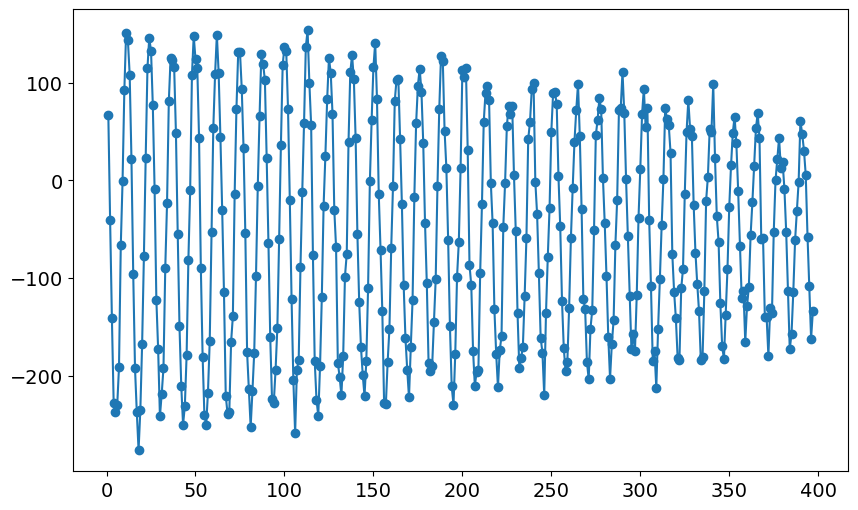

In [429]:
# collect retur args
p, pCov, xdata_1, idata1 = return_args
plt.plot(xdata_1, idata1, '-o', label='original')

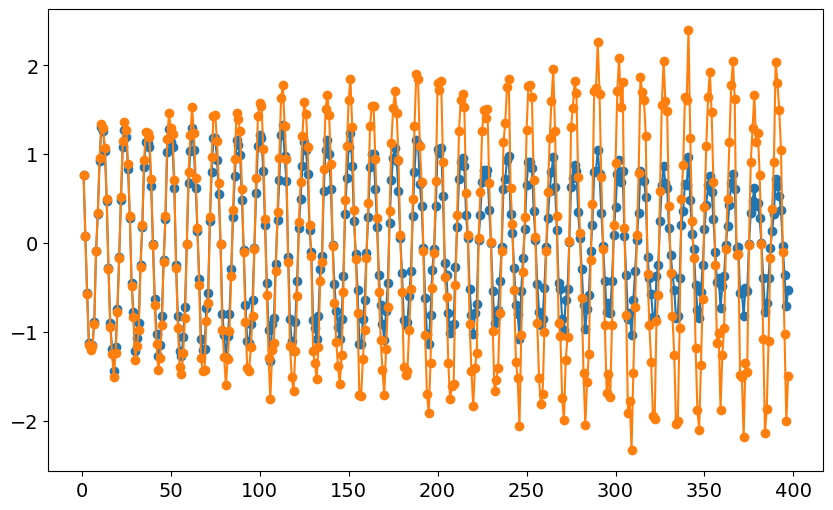

In [430]:
mode_no = 2
t2_df_idx = df_t2_and_echo[(df_t2_and_echo['target'] == mode_no) & (df_t2_and_echo['type'] == 'T2')].index[0]
t2 = df_t2_and_echo.loc[t2_df_idx, 't2']

factor = np.exp(xdata_1/t2)
# rescale y data
idata1 = (idata1 - p[4])/p[0]

idata1_ = np.array(idata1) * factor



# get rid of oscillations
# idata2_= idata1_/np.sin(p[1]*xdata_1 *2*np.pi +p[2]*np.pi/180)
# # remove outliers (things larger than 1)
# idata2_[idata2_>1] = 1
# idata2_[idata2_<-1] = -1

plt.plot(xdata_1, idata1, '-o', label='original')
plt.plot(xdata_1, idata1_, '-o', label='internal decay removed')

In [432]:
df_t2_and_echo

,target,type,file_no,name,t2,t2_err,return_args
0,1,T2,90,_stor_cavity_ramsey_sweep.h5,235.687931,7.102034,"[[1.8099999999999998, 3.6099999999999994, 5.40..."
1,1,T2_echo,91,_stor_cavity_ramsey_sweep.h5,551.567706,16.846464,"[[3.02, 6.02, 9.02, 12.02, 15.02, 18.02, 21.02..."
2,2,T2,92,_stor_cavity_ramsey_sweep.h5,378.310633,15.076063,"[[6.01, 12.01, 18.01, 24.01, 30.01, 36.01, 42...."
3,2,T2_echo,93,_stor_cavity_ramsey_sweep.h5,1493.194215,53.469139,NaN
4,3,T2,94,_stor_cavity_ramsey_sweep.h5,677.194120,16.847612,"[[4.81, 9.61, 14.409999999999998, 19.21, 24.01..."
5,3,T2_echo,95,_stor_cavity_ramsey_sweep.h5,1309.914525,41.804243,"[[8.02, 16.02, 24.02, 32.02, 40.02, 48.02, 56...."
6,4,T2,96,_stor_cavity_ramsey_sweep.h5,806.227803,23.684860,"[[4.21, 8.41, 12.610000000000001, 16.810000000..."
7,4,T2_echo,97,_stor_cavity_ramsey_sweep.h5,972.376941,29.846202,"[[7.02, 14.02, 21.02, 28.02, 35.02, 42.02, 49...."
8,5,T2,98,_stor_cavity_ramsey_sweep.h5,591.843259,15.246132,"[[3.6099999999999994, 7.209999999999999, 10.80..."
9,5,T2_echo,99,_stor_cavity_ramsey_sweep.h5,663.338928,22.742345,"[[6.02, 12.02, 18.02, 24.02, 30.02, 36.02, 42...."


In [431]:
t2

378.3106327148159

In [393]:
temp_data.keys()

dict_keys(['amps', 'avgi', 'avgq', 'idata', 'phases', 'qdata', 'xpts', 'fit_avgi', 'fit_avgq', 'fit_amps', 'fit_err_avgi', 'fit_err_avgq', 'fit_err_amps', 'f_adjust_ramsey_avgi', 'f_adjust_ramsey_avgq', 'f_adjust_ramsey_amps'])

In [391]:
len(temp_data['idata'])

40400

In [390]:
attrs['config']['expt']

{'start': 0.01,
 'step': 1,
 'expts': 101,
 'ramsey_freq': -2.96,
 'reps': 100,
 'rounds': 1,
 'qubits': [0],
 'checkEF': False,
 'f0g1_cavity': 0,
 'init_gf': False,
 'active_reset': True,
 'man_reset': True,
 'storage_reset': True,
 'user_defined_pulse': [False, 1977.7, 15000, 0.005, 0.550453, 0],
 'parity_meas': False,
 'man_idx': 1,
 'storage_ramsey': [True, 2, True],
 'man_ramsey': [False, 1],
 'coupler_ramsey': False,
 'custom_coupler_pulse': [[944.25],
  [1000],
  [0.316677658],
  [0],
  [1],
  ['flat_top'],
  [0.005]],
 'echoes': [False, 0],
 'prepulse': True,
 'postpulse': True,
 'pre_sweep_pulse': [[3568.1515953227604,
   3425.5564066067,
   2007.0,
   349.415,
   3568.1515953227604,
   3425.5564066067,
   2007.0,
   696.665,
   3568.1515953227604,
   3425.5564066067,
   2007.0,
   875.845,
   3568.1515953227604,
   3425.5564066067,
   2007.0,
   1053.395,
   3568.1515953227604,
   3425.5564066067,
   2007.0,
   1245.16,
   3568.1515953227604,
   3425.5564066067,
   2007.0,
 

## Comparing Curves

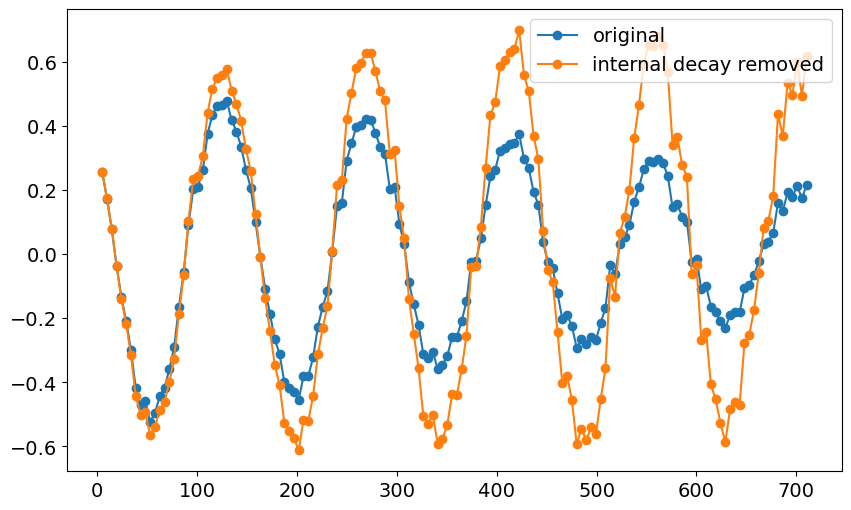

In [445]:
df_idx = 12
file_no = df_MBD.loc[df_idx, 'file_no']
name = df_MBD.loc[df_idx, 'name']
mode_no = df_MBD.loc[df_idx, 'target']
state_idx = df_MBD.loc[df_idx, 'state_idx']

spectator_cross_kerrs = np.abs(cross_kerrs[mode_no-1])
T1s = np.array([358.3, 1254.8, 799.0, 597.4, 355.7, 589.5, 371.2])
kappa = np.sum(1/T1s * np.abs(spectator_cross_kerrs/np.sum(spectator_cross_kerrs)))
effective_spec_T1 = 1/kappa

if state_idx == 0:
    alpha =0
elif state_idx == 1:
    alpha = 1
else:
    alpha = 1/2

xdata_1, idata1 = df_MBD.loc[df_idx, 'xdata'], df_MBD.loc[df_idx, 'idata']
p, pCov = df_MBD.loc[df_idx, 'p'], df_MBD.loc[df_idx, 'pCov']

#  # fitparams=[amp, freq (non-angular), phase (deg), decay time, amp offset, decay time offset]

#get rid of amp offset and amp 
idata1 = (idata1 - p[4])/p[0]
# plt.plot(xdata_1, idata1, '-o', label='original')

# get rid of internal kappa decay 

## find df_idx in the t2_and_echo dataframe with target being mode_no and type being T2
t2_df_idx = df_t2_and_echo[(df_t2_and_echo['target'] == mode_no) & (df_t2_and_echo['type'] == 'T2')].index[0]
t2 = df_t2_and_echo.loc[t2_df_idx, 't2']

factor = np.exp(xdata_1/t2)
idata1_ = np.array(idata1) * factor



# get rid of oscillations
# idata2_= idata1_/np.sin(p[1]*xdata_1 *2*np.pi +p[2]*np.pi/180)
# # remove outliers (things larger than 1)
# idata2_[idata2_>1] = 1
# idata2_[idata2_<-1] = -1

plt.plot(xdata_1, idata1, '-o', label='original')
plt.plot(xdata_1, idata1_, '-o', label='internal decay removed')
# plt.plot(xdata_1, idata2_, '-o', label='oscillations removed')
plt.legend()
p_ramsey = p.copy()


In [450]:
df_idx = 14
file_no = df_MBD.loc[df_idx, 'file_no']
name = df_MBD.loc[df_idx, 'name']
mode_no = df_MBD.loc[df_idx, 'target']
state_idx = df_MBD.loc[df_idx, 'state_idx']

spectator_cross_kerrs = np.abs(cross_kerrs[mode_no-1])
T1s = np.array([358.3, 1254.8, 799.0, 597.4, 355.7, 589.5, 371.2])
kappa = np.sum(1/T1s * np.abs(spectator_cross_kerrs/np.sum(spectator_cross_kerrs)))
effective_spec_T1 = 1/kappa

if state_idx == 0:
    alpha =0
elif state_idx == 1:
    alpha = 1
else:
    alpha = 1/2

xdata_2, idata2 = df_MBD.loc[df_idx, 'xdata'], df_MBD.loc[df_idx, 'idata']
p, pCov = df_MBD.loc[df_idx, 'p'], df_MBD.loc[df_idx, 'pCov']

#  # fitparams=[amp, freq (non-angular), phase (deg), decay time, amp offset, decay time offset]

#get rid of amp offset and amp 
idata2 = (idata2 - p[4])/p[0]
# plt.plot(xdata_1, idata1, '-o', label='original')

# get rid of internal kappa decay 

## find df_idx in the t2_and_echo dataframe with target being mode_no and type being T2
t2_df_idx = df_t2_and_echo[(df_t2_and_echo['target'] == mode_no) & (df_t2_and_echo['type'] == 'T2')].index[0]
t2 = df_t2_and_echo.loc[t2_df_idx, 't2']

factor = np.exp(xdata_1/t2)
idata2_ = np.array(idata2) * factor



# get rid of oscillations
# idata2_= idata1_/np.sin(p[1]*xdata_1 *2*np.pi +p[2]*np.pi/180)
# # remove outliers (things larger than 1)
# idata2_[idata2_>1] = 1
# idata2_[idata2_<-1] = -1

# plt.plot(xdata_1, idata1, '-o', label='original')
# plt.plot(xdata_1, idata1_, '-o', label='internal decay removed')
# # plt.plot(xdata_1, idata2_, '-o', label='oscillations removed')
# plt.legend()
# p_ramsey = p.copy()


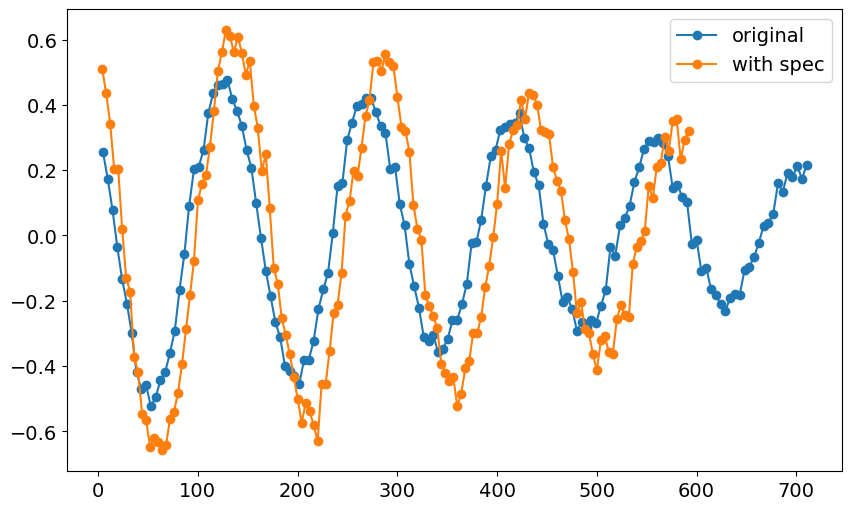

In [451]:
plt.plot(xdata_1, idata1, '-o', label='original')
plt.plot(xdata_2, idata2, '-o', label='with spec')
plt.legend()

In [449]:
alpha

1

## Qubit Manipulate expts

No echoes in the data
Attempted to init fitparam 1 to 0.07908163265306122, which is out of bounds 0.0002564102564102564 to 0.038461538461538464. Instead init to 0.01935897435897436
Attempted to init fitparam 1 to 0.07653061224489795, which is out of bounds 0.0002564102564102564 to 0.038461538461538464. Instead init to 0.01935897435897436
Attempted to init fitparam 1 to 0.07653061224489795, which is out of bounds 0.0002564102564102564 to 0.038461538461538464. Instead init to 0.01935897435897436
Current pi pulse frequency: 3568.1515953227604
Fit frequency from I [MHz]: 0.01935897435897436 +/- inf
Suggested new pi pulse frequency from fit I [MHz]:
 	3568.2122363484013
 	3568.2509542971193
T2 Ramsey from fit I [us]: 390.0
Fit frequency from Q [MHz]: 0.019347284802061788 +/- 0.003254818344288998
Suggested new pi pulse frequencies from fit Q [MHz]:
 	3568.2122480379585
 	3568.2509426075626
T2 Ramsey from fit Q [us]: 140.14446123423073


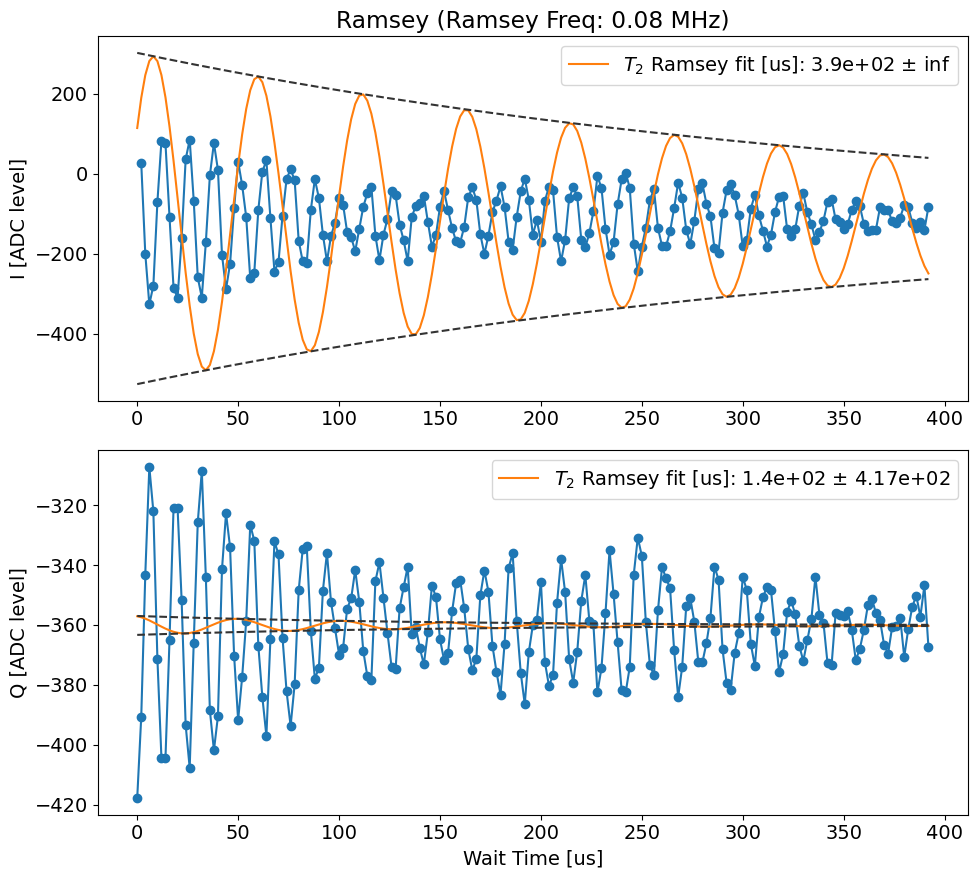

In [465]:
# bare qubit ramsey
temp_data, attrs = prev_data(expt_path, '00056_RamseyExperiment.h5')
return_args1 = Ramsey_display(temp_data,  attrs, normalize = [False, 'g_data', 'e_data'], active_reset=True, threshold = -25.73026268397916, readouts_per_rep=4,
                ramsey_freq=attrs['config']['expt']['ramsey_freq'], initial_freq=attrs['config']['device']['qubit']['f_ge_idle'][0], fit=True, title='Ramsey',
                end_idx = -1)
#collect return args
p, pCov, xdata_1, idata1 = return_args1

osc_freq = 0.07911063060839033
qubit_t2 = 99.03023337204115

No echoes in the data
Attempted to init fitparam 1 to 0.07908163265306122, which is out of bounds 0.0002564102564102564 to 0.038461538461538464. Instead init to 0.01935897435897436
Attempted to init fitparam 1 to 0.07653061224489795, which is out of bounds 0.0002564102564102564 to 0.038461538461538464. Instead init to 0.01935897435897436
Attempted to init fitparam 1 to 0.07653061224489795, which is out of bounds 0.0002564102564102564 to 0.038461538461538464. Instead init to 0.01935897435897436
Current pi pulse frequency: 3568.1515953227604
Fit frequency from I [MHz]: 0.02232734003274188 +/- 0.003642472590982329
Suggested new pi pulse frequency from fit I [MHz]:
 	3568.209267982728
 	3568.2539226627932
T2 Ramsey from fit I [us]: 117.00000691587799
Fit frequency from Q [MHz]: 0.017329291210105027 +/- 0.0058363084095736355
Suggested new pi pulse frequencies from fit Q [MHz]:
 	3568.2142660315503
 	3568.2489246139703
T2 Ramsey from fit Q [us]: 120.6423978078915


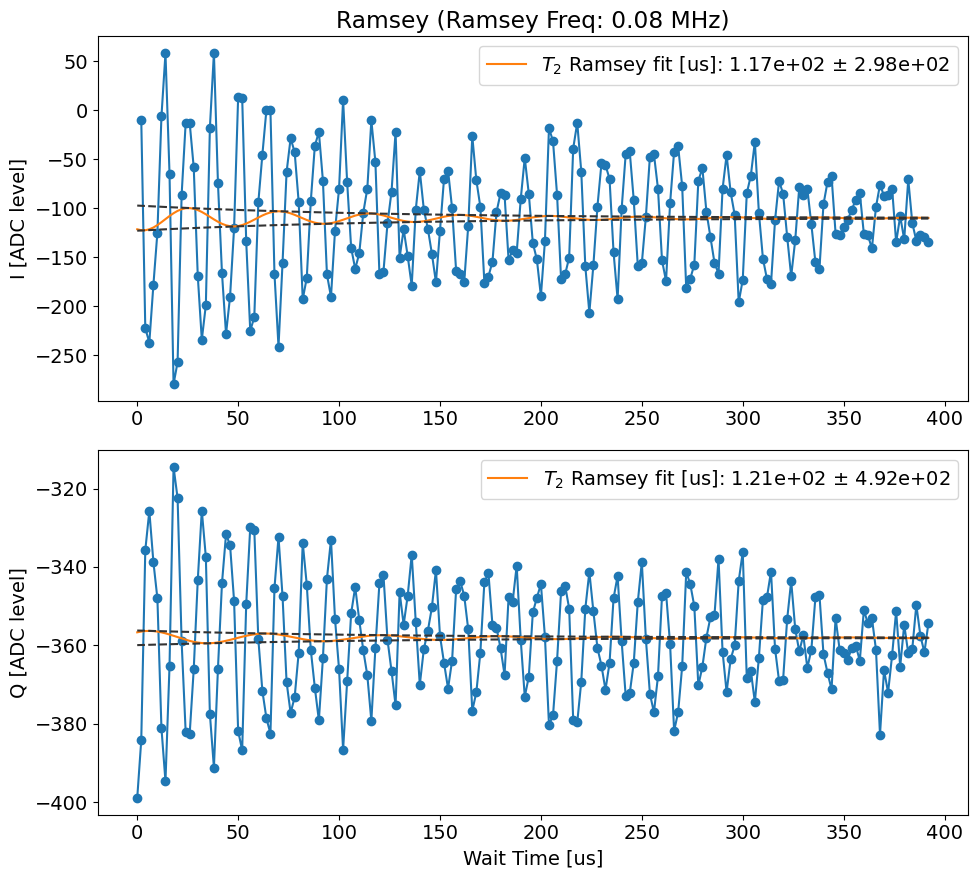

In [466]:
# qubit ramsey with man1 occupied
temp_data, attrs = prev_data(expt_path, '00057_RamseyExperiment.h5')
return_args2 = Ramsey_display(temp_data,  attrs, normalize = [False, 'g_data', 'e_data'], active_reset=True, threshold = -25.73026268397916, readouts_per_rep=4,
                ramsey_freq=attrs['config']['expt']['ramsey_freq'], initial_freq=attrs['config']['device']['qubit']['f_ge_idle'][0], fit=True, title='Ramsey',
                end_idx = -1)
#collect return args
p, pCov, xdata_2, idata2 = return_args2

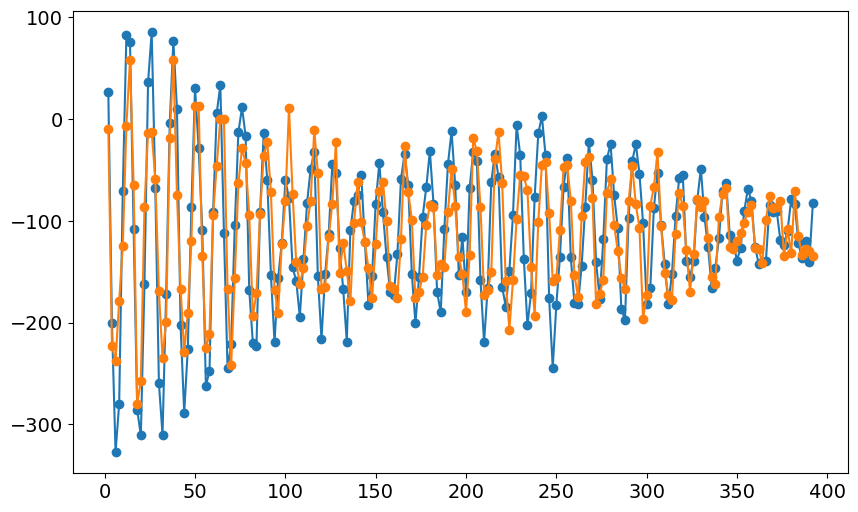

In [470]:
plt.plot(xdata_1, idata1, '-o', label='bare qubit')
plt.plot(xdata_2, idata2, '-o', label='man1 occupied')

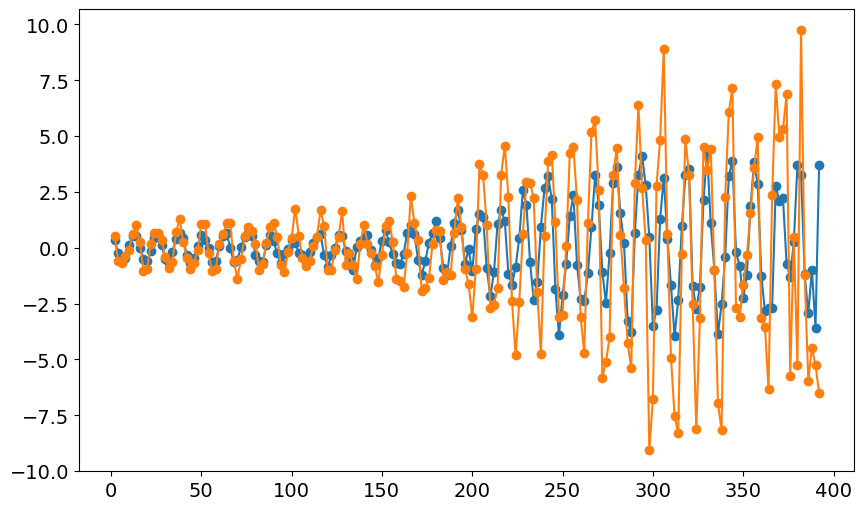

In [471]:
# collect return args
p1, pCov1, xdata_1, idata1 = return_args1
p2, pCov2, xdata_2, idata2 = return_args2

# rescale data
idata1 = (idata1 - p1[4])/p1[0]
idata2 = (idata2 - p2[4])/p2[0]


# getting rid of internal decay
factor1 = np.exp(xdata_1/qubit_t2)
idata1_ = np.array(idata1) * factor1

factor2 = np.exp(xdata_2/qubit_t2)
idata2_ = np.array(idata2) * factor2

plt.plot(xdata_1, idata1_, '-o', label='bare qubit internal decay removed')
plt.plot(xdata_2, idata2_, '-o', label='man1 occupied internal decay removed')

# simulation 
Let's see how the ramsey signal would look like if things followed the model

$f(t) = e^{-\kappa_{int} t} e^{e^{-\kappa_{s} t} \kappa_m t}$ cos($\omega t$)

where 
- $\kappa_{int}$ is the intrinsic dephasing rate (T2)
- $\kappa_{s}$ is the T1 decay (average) of spectator storage modes
- $\kappa_m$ is the effective many body dephasing rate
- $\omega$ is the ramsey frequency

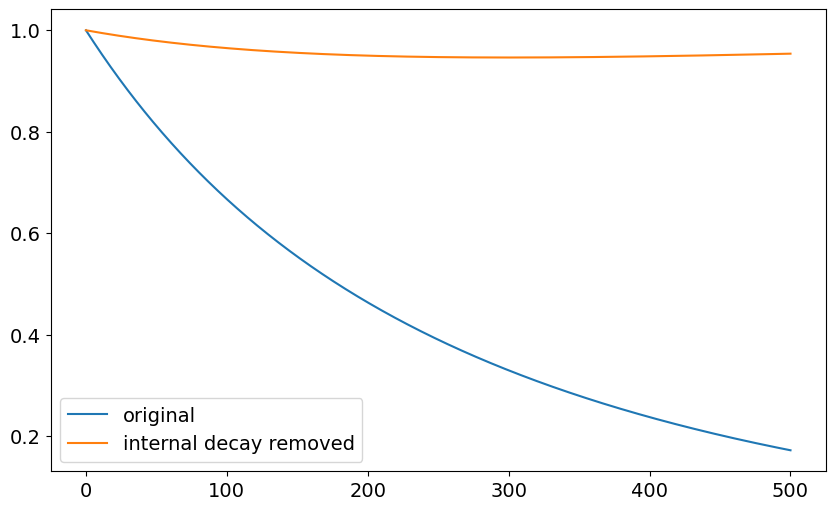

In [452]:
kappa_int = 1/(300) # internal kappa Mhz  
kappa_s = 1/(300) # T1
kappa_mbd = 1/(1000) # MBD
omega = 2*np.pi*0#*0.02
alpha = 0.5

def fit_func(t, include_int_kappa = True):

    '''$f(t) = e^{-\kappa_{int} t} e^{e^{-\kappa_{s} t} \kappa_m t}$ cos($\omega t$)'''
    if include_int_kappa:
        return np.exp(-kappa_int*t)*np.exp(-1 *np.exp(-kappa_s*t)*kappa_mbd*t)*np.cos(omega*t)
    else:
        return np.exp(-1 *alpha *np.exp(-kappa_s*t)*kappa_mbd*t)*np.cos(omega*t)

t= np.linspace(0, 500, 1000)
plt.plot(t, fit_func(t), label='original')
plt.plot(t, fit_func(t, include_int_kappa=False), label='internal decay removed')
plt.legend()
